In [ ]:
! pip install ipywidgets widgetsnbextension pandas-profiling

In [ ]:
! jupyter nbextension enable --py widgetsnbextension

In [ ]:
import os
import gc
import pandas as pd
import warnings
import matplotlib.pyplot as plt
import matplotlib
import anndata as ad

import scanpy as sc

import SEACells

matplotlib.rcParams.update({'font.size': 12})
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

# *M. lignano*

## Read in the data

In [ ]:
peaks = sc.read_h5ad( 'ArchROutputs/Mlig/Mlig.peaks.h5ad' )

peaks

In [ ]:
peakdf = pd.read_csv( 'ArchROutputs/Mlig/Mlig.peaks.csv', index_col=0 )

peakdf.index = peakdf['seqnames'] + ':' + peakdf['start'].astype(str) + '-' + peakdf['end'].astype(str)
peaks.var = peakdf

In [ ]:
del peakdf

gc.collect()

In [ ]:
peaks.X = peaks.X.tocsr()

In [7]:
peaks

AnnData object with n_obs × n_vars = 37553 × 236018
    obs: 'SeuratClusters', 'GroupSAMName', 'TissueSAM', 'Sample', '_scvi_batch', '_scvi_labels', 'cluster_pvi', 'Injury', 'GroupFigure'
    var: 'seqnames', 'start', 'end', 'width', 'strand', 'score', 'idx', 'GC', 'N'
    uns: 'X_name'

In [8]:
# Grab the PeakVI latent dimensions
peaks.obsm['X_svd'] = pd.read_csv('scVI_models/Mlig.pvi_latent_dims.csv', 
                                  index_col=0).loc[peaks.obs_names, : ].values

We're going to process the data separately per sample

## Uncut

In [203]:
uc = peaks[peaks.obs.Sample=='uncut',:].copy()

uc

AnnData object with n_obs × n_vars = 11886 × 236018
    obs: 'SeuratClusters', 'GroupSAMName', 'TissueSAM', 'Sample', '_scvi_batch', '_scvi_labels', 'cluster_pvi', 'Injury', 'GroupFigure'
    var: 'seqnames', 'start', 'end', 'width', 'strand', 'score', 'idx', 'GC', 'N'
    uns: 'X_name', 'GeneScoresColums'
    obsm: 'X_svd', 'GeneScores'

In [204]:
warnings.filterwarnings('ignore')
sc.pp.neighbors(uc, use_rep='X_svd')
sc.tl.umap(uc)
sc.tl.leiden(uc)
warnings.filterwarnings('default')

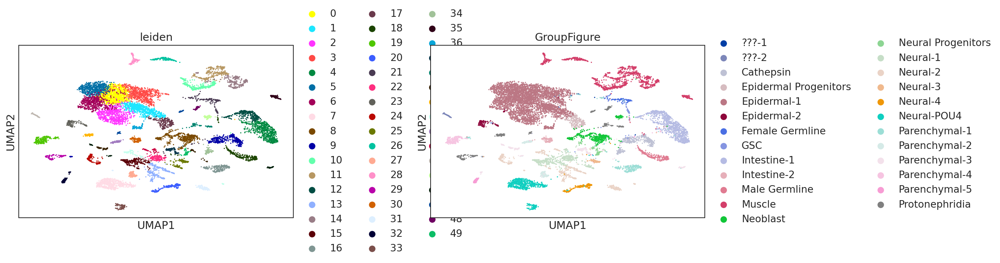

In [205]:
sc.pl.scatter(uc, basis='umap', color=['leiden', 'GroupFigure'])
plt.show()

In [224]:
# Number of SEACells to compute
nsc = len( uc.obs_names ) // 75 + 1
nsc

159

In [225]:
model = SEACells.core.SEACells( uc, build_kernel_on='X_svd', n_SEACells=nsc, 
                                n_waypoint_eigs=10, convergence_epsilon=1e-5 )

Welcome to SEACells!


In [226]:
model.construct_kernel_matrix()
M = model.kernel_matrix

Computing kNN graph using scanpy NN ...
Computing radius for adaptive bandwidth kernel...


/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/scipy/sparse/_index.py:125: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


  0%|          | 0/11886 [00:00<?, ?it/s]

Making graph symmetric...
Parameter graph_construction = union being used to build KNN graph...
Computing RBF kernel...


sys:1: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f394ea5c580>


  0%|          | 0/11886 [00:00<?, ?it/s]

Building similarity LIL matrix...


sys:1: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f394d524d00>


  0%|          | 0/11886 [00:00<?, ?it/s]

Constructing CSR matrix...


/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


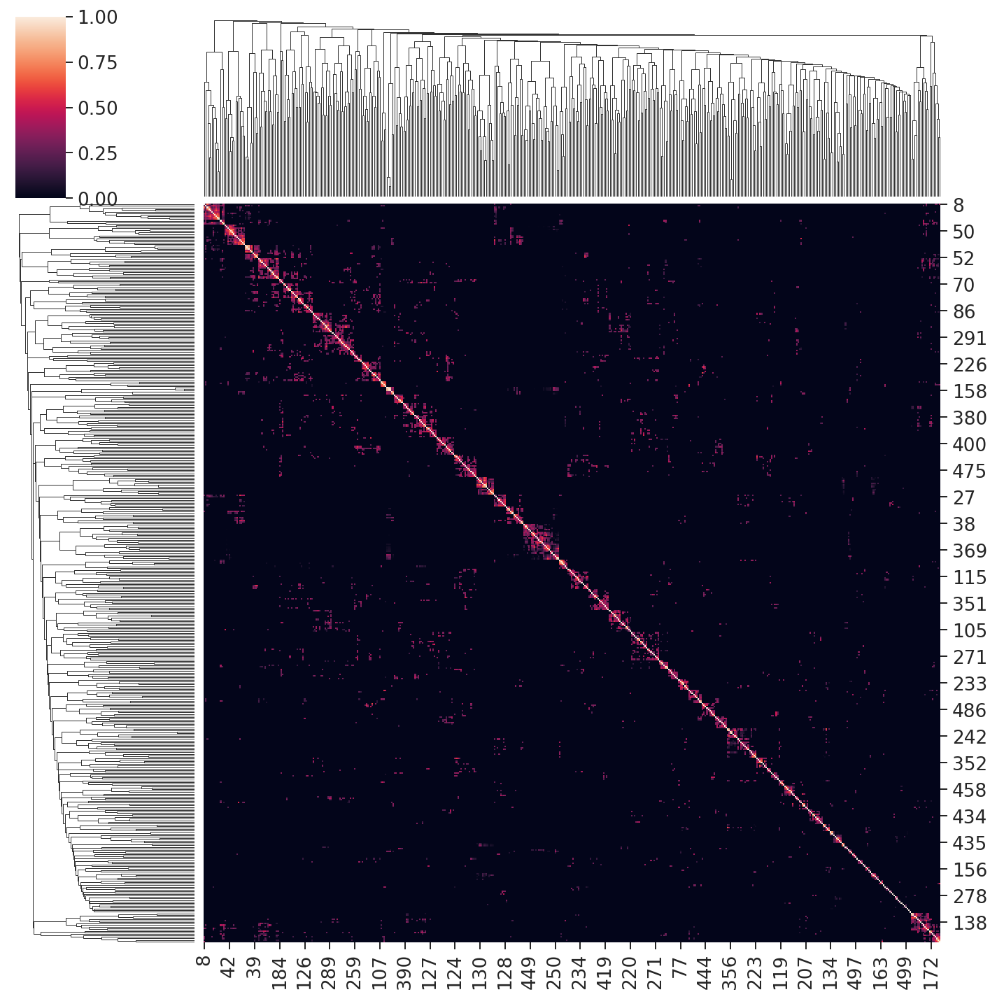

In [227]:
sns.clustermap(M.toarray()[:500,:500])
plt.show()

In [228]:
model.initialize_archetypes()

Building kernel on X_svd
Computing diffusion components from X_svd for waypoint initialization ... 
Determing nearest neighbor graph...


/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/palantir/utils.py:54: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  temp = sc.AnnData(data_df.values)


Done.
Sampling waypoints ...
Done.
Selecting 134 cells from waypoint initialization.
Initializing residual matrix using greedy column selection
Initializing f and g...


100%|████████████████████████████████████████████████████████████████| 35/35 [00:01<00:00, 20.50it/s]

Selecting 25 cells from greedy initialization.


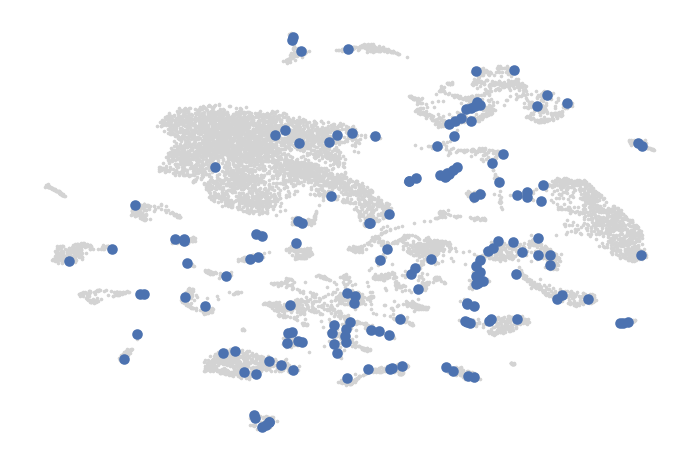

In [229]:
SEACells.plot.plot_initialization(uc, model)

In [230]:
model.fit(min_iter=10, max_iter=50)

Randomly initialized A matrix.
Setting convergence threshold at 0.00188
Starting iteration 1.
Completed iteration 1.
Starting iteration 10.
Completed iteration 10.
Starting iteration 20.
Completed iteration 20.
Starting iteration 30.
Completed iteration 30.
Starting iteration 40.
Completed iteration 40.
Converged after 45 iterations.


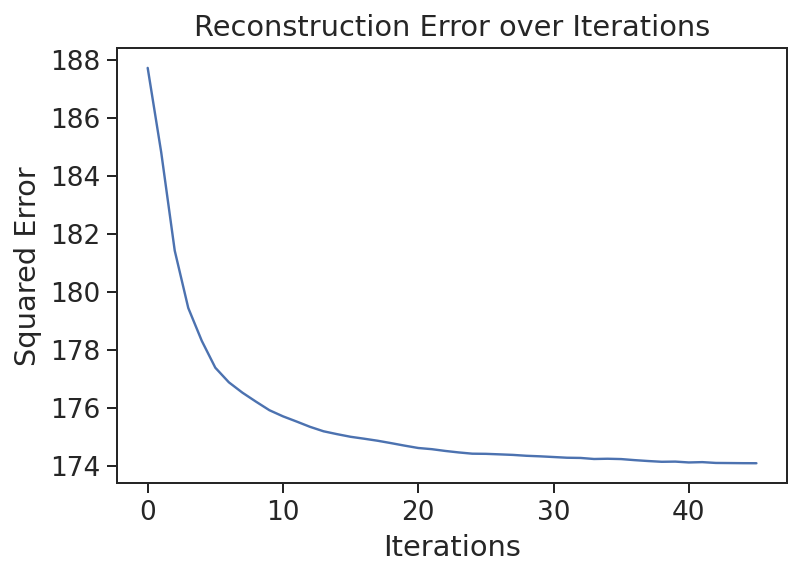

In [231]:
model.plot_convergence()

In [232]:
uc.layers['raw'] = uc.X

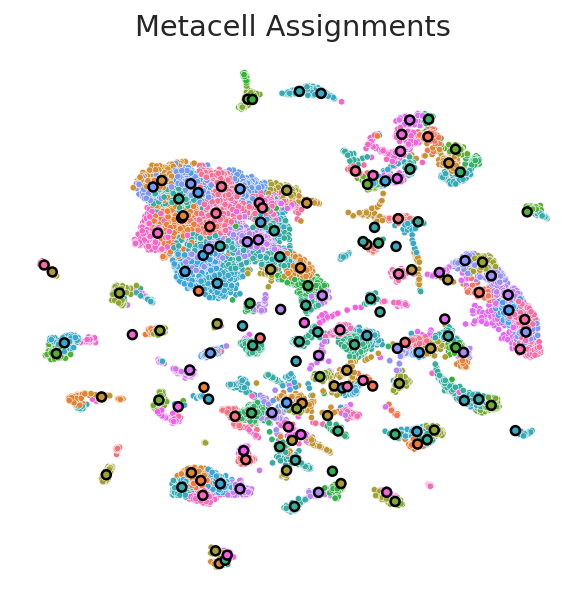

In [233]:
SEACells.plot.plot_2D(uc, key='X_umap', colour_metacells=True)

/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


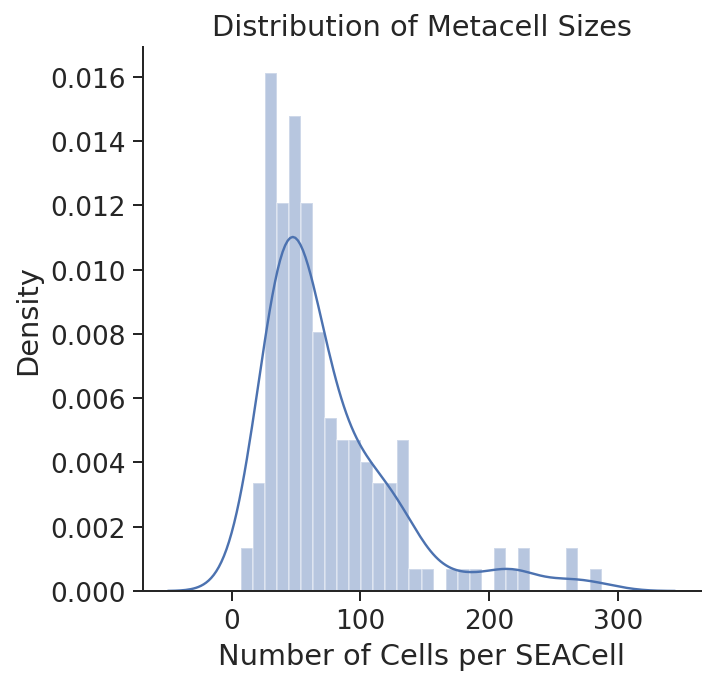

,size
SEACell,
SEACell-0,47
SEACell-1,82
SEACell-10,49
SEACell-100,62
SEACell-101,45
...,...
SEACell-95,33
SEACell-96,261
SEACell-97,111


In [234]:
SEACells.plot.plot_SEACell_sizes(uc, bins=30)

In [ ]:
uc.obs.groupby('SEACell').apply( lambda x: x.groupby('GroupFigure').size().idxmax() ).value_counts()

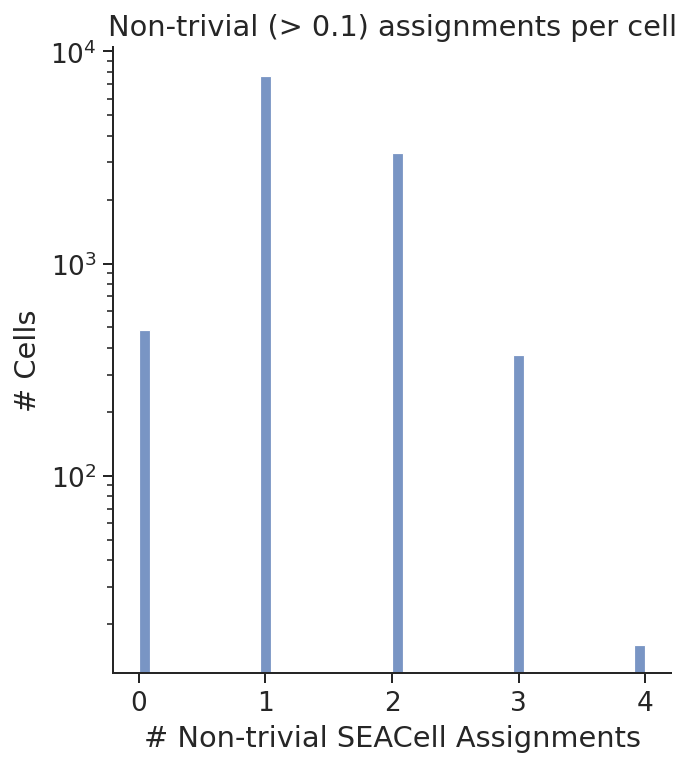

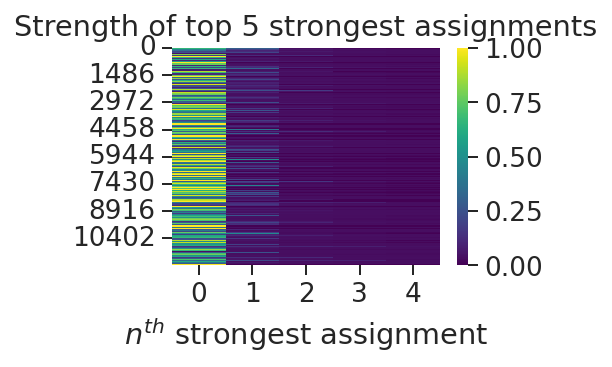

In [236]:
sns.displot((model.A_.T > 0.1).sum(axis=1), kde=False)
plt.title(f'Non-trivial (> 0.1) assignments per cell')
plt.xlabel('# Non-trivial SEACell Assignments')
plt.ylabel('# Cells')
plt.yscale('log')
plt.show()

plt.figure(figsize=(3,2))
b = np.partition(model.A_.T, -5)    
sns.heatmap(np.sort(b[:,-5:])[:, ::-1], cmap='viridis', vmin=0)
plt.title('Strength of top 5 strongest assignments')
plt.xlabel('$n^{th}$ strongest assignment')
plt.show()

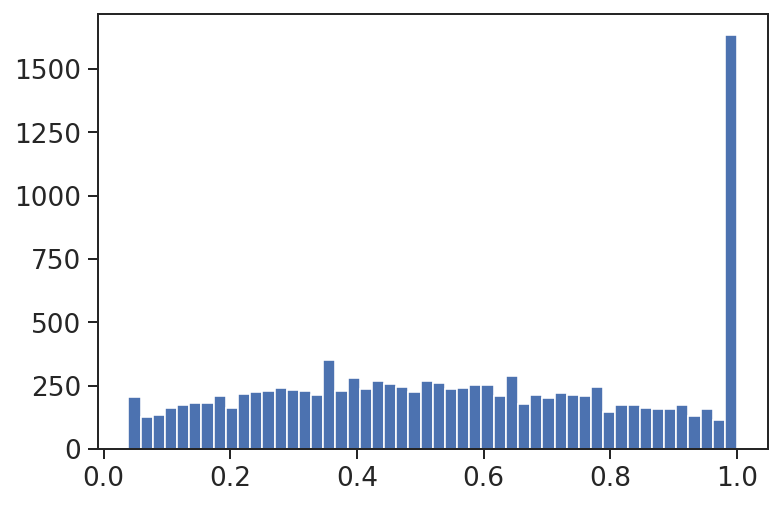

In [237]:
# We want cells that are confidently 
# assigned to a single SEACell
uc.obs['MaxSEACellScore'] = model.A_.max(0).flatten()
plt.hist( uc.obs['MaxSEACellScore'].values, bins=50 )
plt.show()

In [238]:
np.save( 'SEACellsOutput/Mlig.uncut_SEACell_assignments.npy', model.A_ )

In [239]:
uc.obs.loc[:,'SEACell'] = [ c.replace( '-', '-uncut-' ) for c in uc.obs.SEACell ]

## Amputated head

In [240]:
ch = peaks[peaks.obs.Sample=='head',:].copy()

ch

AnnData object with n_obs × n_vars = 15348 × 236018
    obs: 'SeuratClusters', 'GroupSAMName', 'TissueSAM', 'Sample', '_scvi_batch', '_scvi_labels', 'cluster_pvi', 'Injury', 'GroupFigure'
    var: 'seqnames', 'start', 'end', 'width', 'strand', 'score', 'idx', 'GC', 'N'
    uns: 'X_name', 'GeneScoresColums'
    obsm: 'X_svd', 'GeneScores'

In [241]:
warnings.filterwarnings('ignore')
sc.pp.neighbors(ch, use_rep='X_svd')
sc.tl.umap(ch)
sc.tl.leiden(ch)
warnings.filterwarnings('default')

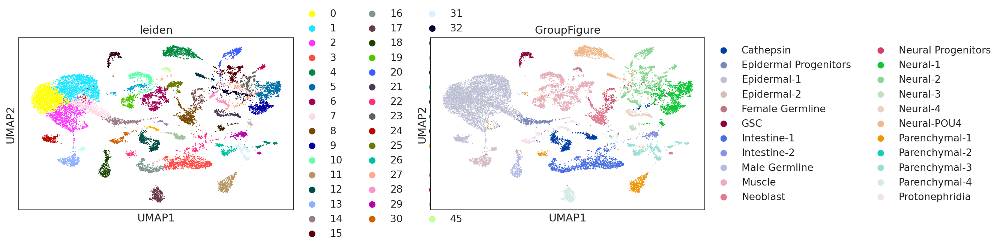

In [242]:
sc.pl.scatter(ch, basis='umap', color=['leiden', 'GroupFigure'])
plt.show()

In [245]:
# Number of SEACells to compute
nsc = len( ch.obs_names ) // 75 + 1
nsc

205

In [246]:
model = SEACells.core.SEACells( ch, build_kernel_on='X_svd', n_SEACells=nsc, 
                                n_waypoint_eigs=10, convergence_epsilon=1e-5 )

Welcome to SEACells!


In [247]:
model.construct_kernel_matrix()
M = model.kernel_matrix

Computing kNN graph using scanpy NN ...


/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/scipy/sparse/_index.py:125: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Computing radius for adaptive bandwidth kernel...


  0%|          | 0/15348 [00:00<?, ?it/s]

Making graph symmetric...
Parameter graph_construction = union being used to build KNN graph...
Computing RBF kernel...


sys:1: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f394e955520>


  0%|          | 0/15348 [00:00<?, ?it/s]

Building similarity LIL matrix...


sys:1: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f394e9556a0>


  0%|          | 0/15348 [00:00<?, ?it/s]

Constructing CSR matrix...


/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


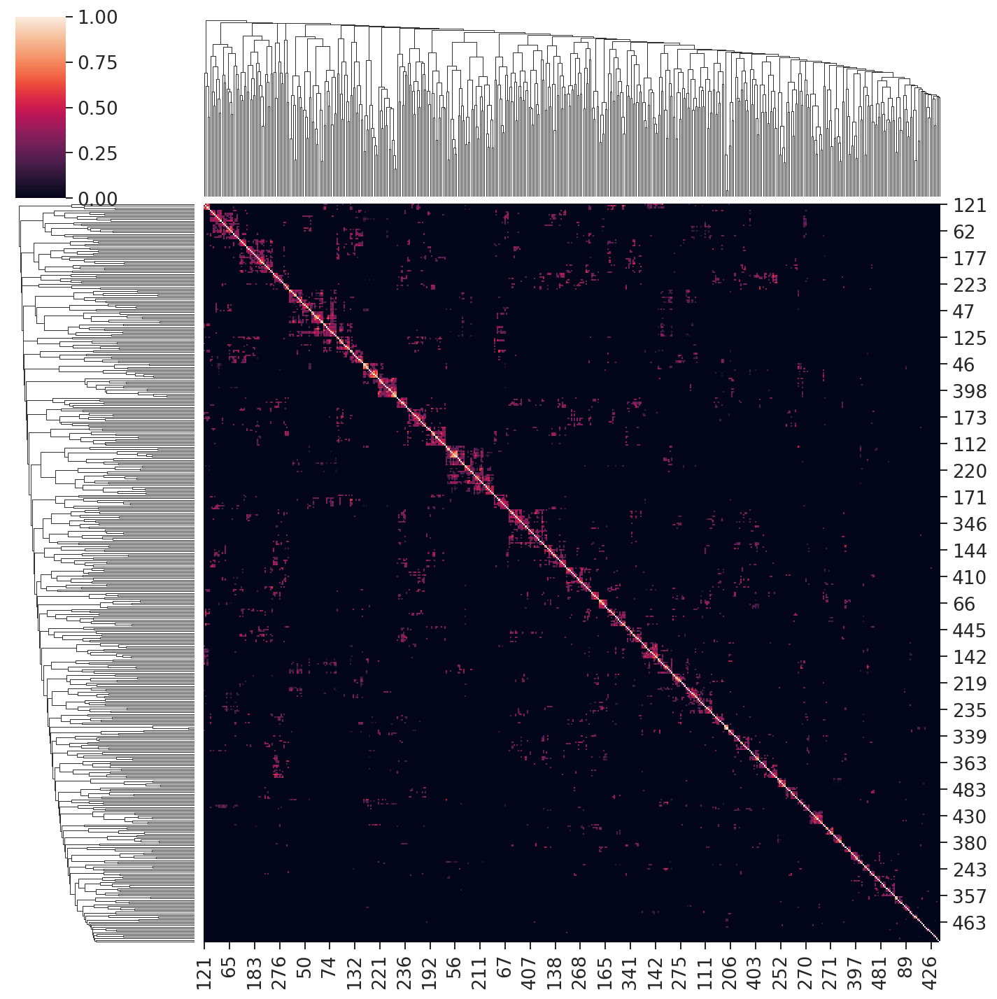

In [248]:
sns.clustermap(M.toarray()[:500,:500])
plt.show()

In [249]:
model.initialize_archetypes()

Building kernel on X_svd
Computing diffusion components from X_svd for waypoint initialization ... 
Determing nearest neighbor graph...


/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/palantir/utils.py:54: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  temp = sc.AnnData(data_df.values)


Done.
Sampling waypoints ...
Done.
Selecting 188 cells from waypoint initialization.
Initializing residual matrix using greedy column selection
Initializing f and g...


100%|████████████████████████████████████████████████████████████████| 27/27 [00:01<00:00, 21.53it/s]

Selecting 17 cells from greedy initialization.


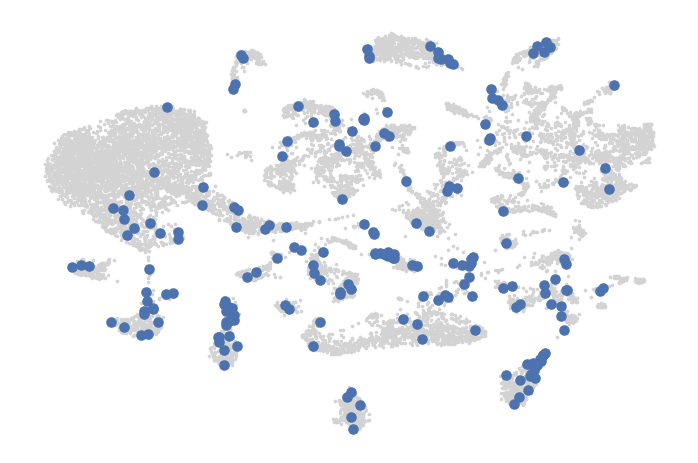

In [250]:
SEACells.plot.plot_initialization(ch, model)

In [251]:
model.fit(min_iter=10, max_iter=50)

Randomly initialized A matrix.
Setting convergence threshold at 0.00215
Starting iteration 1.
Completed iteration 1.
Starting iteration 10.
Completed iteration 10.
Starting iteration 20.
Completed iteration 20.
Starting iteration 30.
Completed iteration 30.
Converged after 36 iterations.


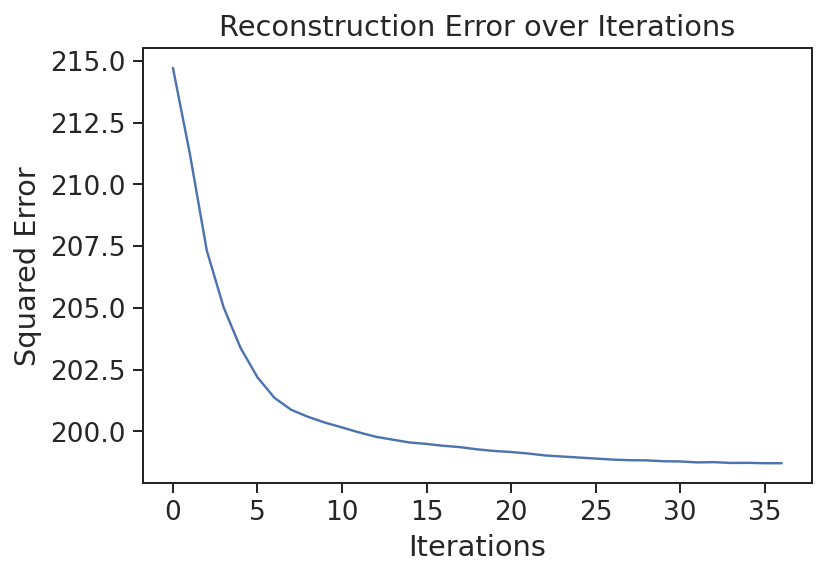

In [252]:
model.plot_convergence()

In [253]:
ch.layers['raw'] = ch.X

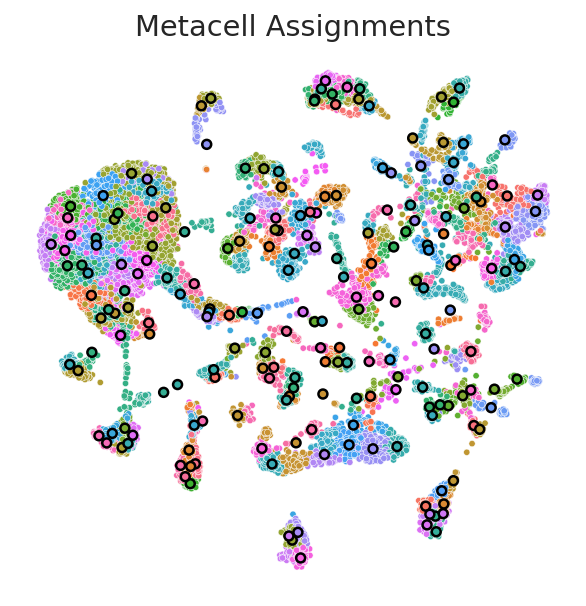

In [254]:
SEACells.plot.plot_2D(ch, key='X_umap', colour_metacells=True)

/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


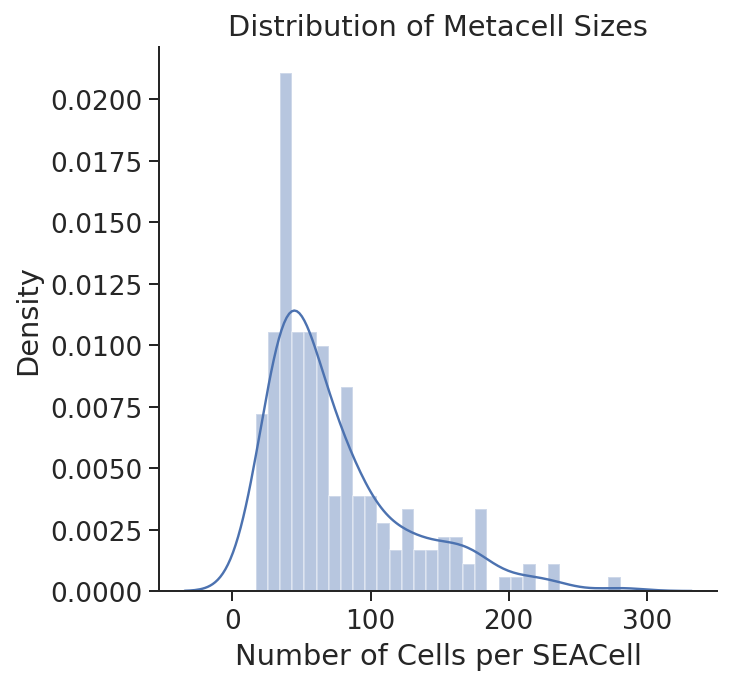

,size
SEACell,
SEACell-0,45
SEACell-1,24
SEACell-10,43
SEACell-100,39
SEACell-101,92
...,...
SEACell-95,81
SEACell-96,29
SEACell-97,95


In [255]:
SEACells.plot.plot_SEACell_sizes(ch, bins=30)

In [ ]:
ch.obs.groupby('SEACell').apply( lambda x: x.groupby('GroupFigure').size().idxmax() ).value_counts()

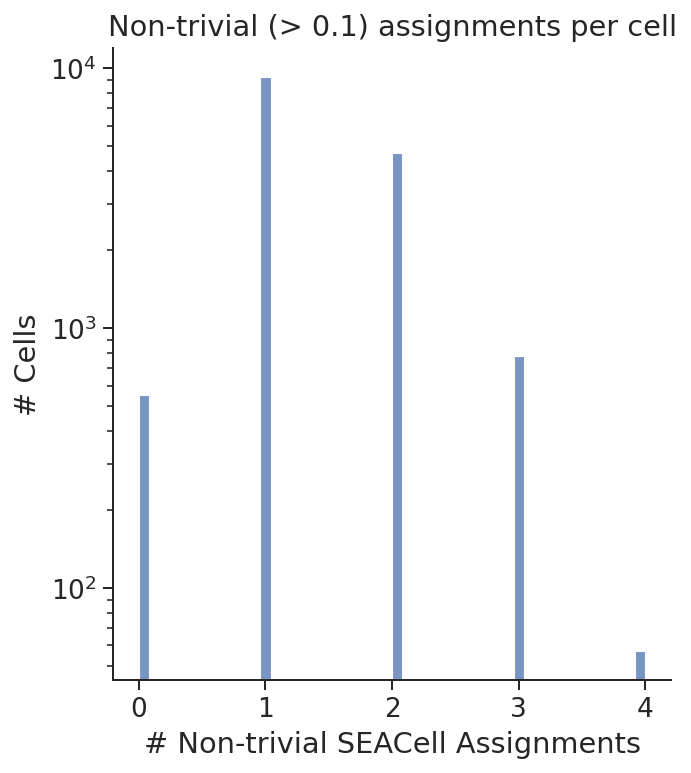

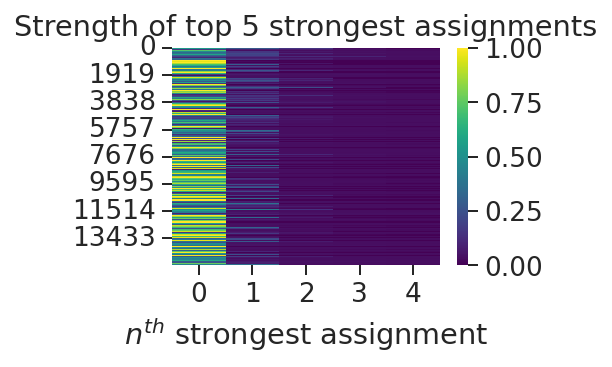

In [257]:
sns.displot((model.A_.T > 0.1).sum(axis=1), kde=False)
plt.title(f'Non-trivial (> 0.1) assignments per cell')
plt.xlabel('# Non-trivial SEACell Assignments')
plt.ylabel('# Cells')
plt.yscale('log')
plt.show()

plt.figure(figsize=(3,2))
b = np.partition(model.A_.T, -5)    
sns.heatmap(np.sort(b[:,-5:])[:, ::-1], cmap='viridis', vmin=0)
plt.title('Strength of top 5 strongest assignments')
plt.xlabel('$n^{th}$ strongest assignment')
plt.show()

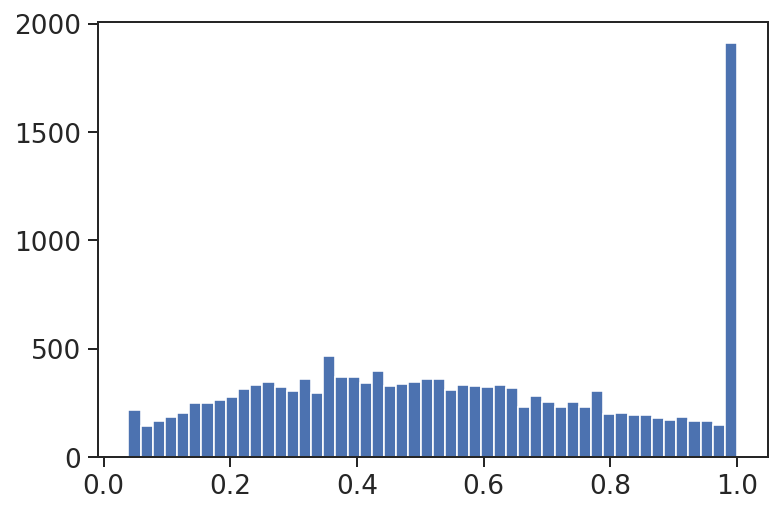

In [258]:
ch.obs['MaxSEACellScore'] = model.A_.max(0).flatten()
plt.hist( ch.obs['MaxSEACellScore'].values, bins=50 )
plt.show()

In [259]:
np.save( 'SEACellsOutput/Mlig.head_SEACell_assignments.npy', model.A_ )

In [260]:
ch.obs.loc[:,'SEACell'] = [ c.replace( '-', '-head-' ) for c in ch.obs.SEACell ]

## Amputated tail

In [261]:
ct = peaks[peaks.obs.Sample=='tail',:].copy()

ct

AnnData object with n_obs × n_vars = 10319 × 236018
    obs: 'SeuratClusters', 'GroupSAMName', 'TissueSAM', 'Sample', '_scvi_batch', '_scvi_labels', 'cluster_pvi', 'Injury', 'GroupFigure'
    var: 'seqnames', 'start', 'end', 'width', 'strand', 'score', 'idx', 'GC', 'N'
    uns: 'X_name', 'GeneScoresColums'
    obsm: 'X_svd', 'GeneScores'

In [262]:
warnings.filterwarnings('ignore')
sc.pp.neighbors(ct, use_rep='X_svd')
sc.tl.umap(ct)
sc.tl.leiden(ct)
warnings.filterwarnings('default')

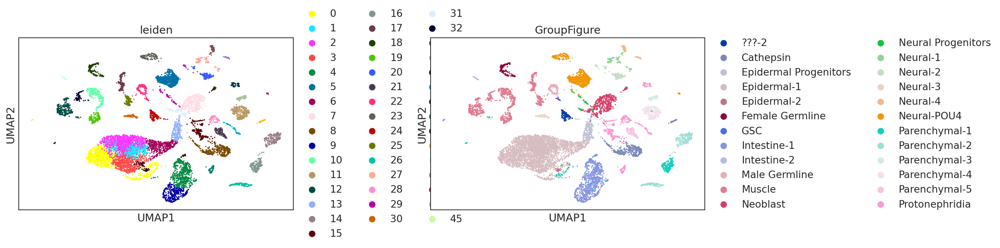

In [263]:
sc.pl.scatter(ct, basis='umap', color=['leiden', 'GroupFigure'])
plt.show()

In [266]:
# How many SEACells to find
nsc = len( ct.obs_names ) // 75 + 1
nsc

138

In [267]:
model = SEACells.core.SEACells( ct, build_kernel_on='X_svd', n_SEACells=nsc, 
                                n_waypoint_eigs=10, convergence_epsilon=1e-5 )

Welcome to SEACells!


In [268]:
model.construct_kernel_matrix()
M = model.kernel_matrix

Computing kNN graph using scanpy NN ...
Computing radius for adaptive bandwidth kernel...


/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/scipy/sparse/_index.py:125: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


  0%|          | 0/10319 [00:00<?, ?it/s]

Making graph symmetric...
Parameter graph_construction = union being used to build KNN graph...
Computing RBF kernel...


sys:1: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f395080f7c0>


  0%|          | 0/10319 [00:00<?, ?it/s]

Building similarity LIL matrix...


sys:1: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f3949ecf7c0>


  0%|          | 0/10319 [00:00<?, ?it/s]

Constructing CSR matrix...


/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


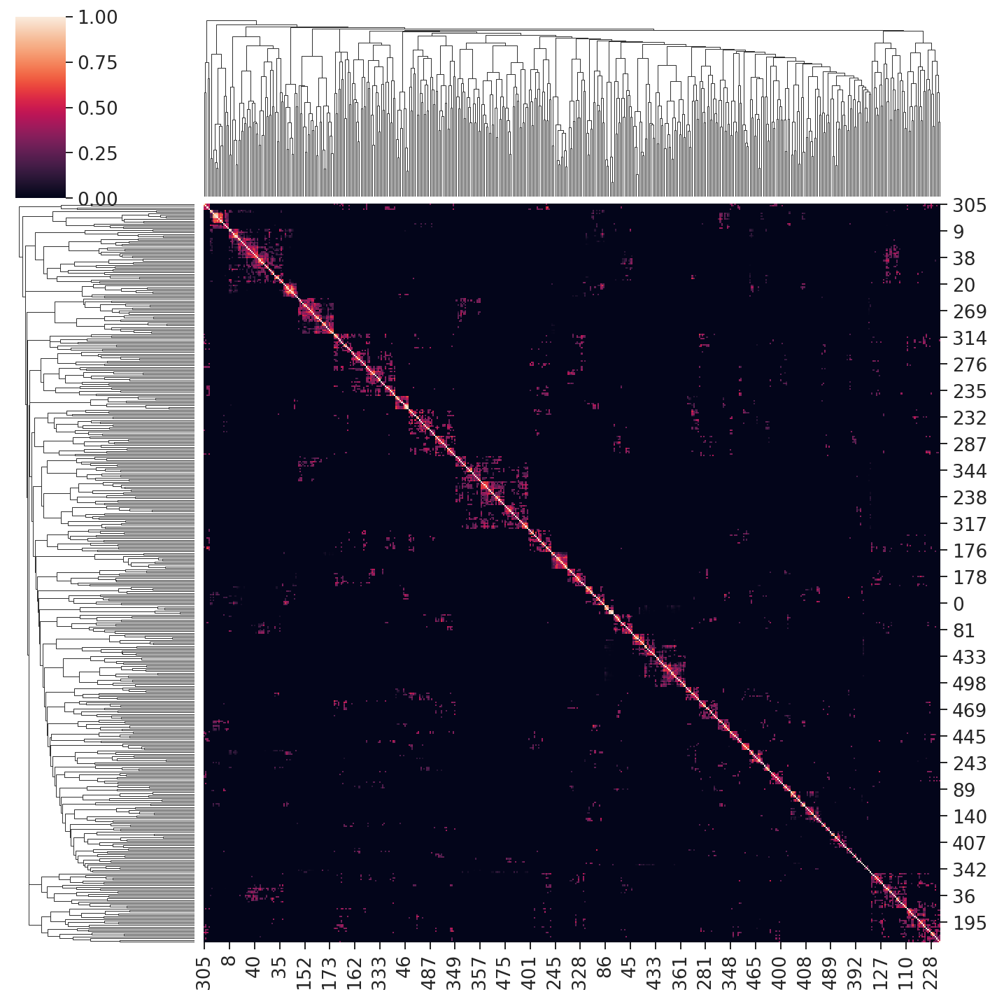

In [269]:
sns.clustermap(M.toarray()[:500,:500])
plt.show()

In [270]:
model.initialize_archetypes()

Building kernel on X_svd
Computing diffusion components from X_svd for waypoint initialization ... 
Determing nearest neighbor graph...


/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/palantir/utils.py:54: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  temp = sc.AnnData(data_df.values)


Done.
Sampling waypoints ...
Done.
Selecting 109 cells from waypoint initialization.
Initializing residual matrix using greedy column selection
Initializing f and g...


100%|████████████████████████████████████████████████████████████████| 39/39 [00:01<00:00, 28.88it/s]

Selecting 29 cells from greedy initialization.


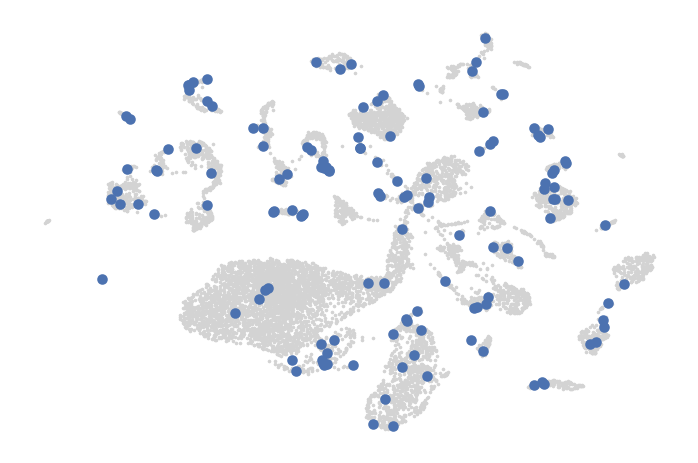

In [271]:
SEACells.plot.plot_initialization(ct, model)

In [272]:
model.fit(min_iter=10, max_iter=50)

Randomly initialized A matrix.
Setting convergence threshold at 0.00176
Starting iteration 1.
Completed iteration 1.
Starting iteration 10.
Completed iteration 10.
Starting iteration 20.
Completed iteration 20.
Starting iteration 30.
Completed iteration 30.
Converged after 34 iterations.


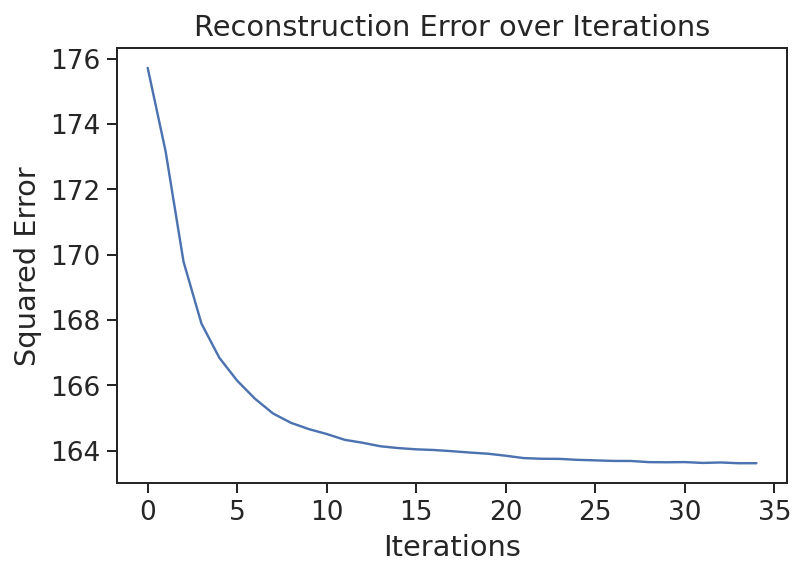

In [273]:
model.plot_convergence()

In [274]:
ct.layers['raw'] = ct.X

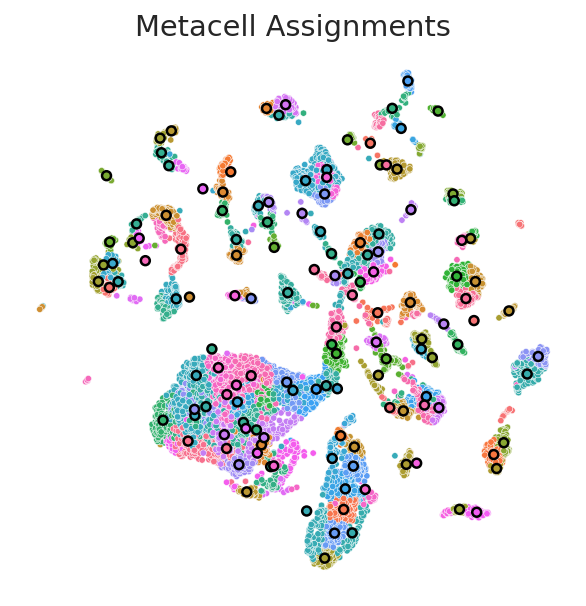

In [275]:
SEACells.plot.plot_2D(ct, key='X_umap', colour_metacells=True)

/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


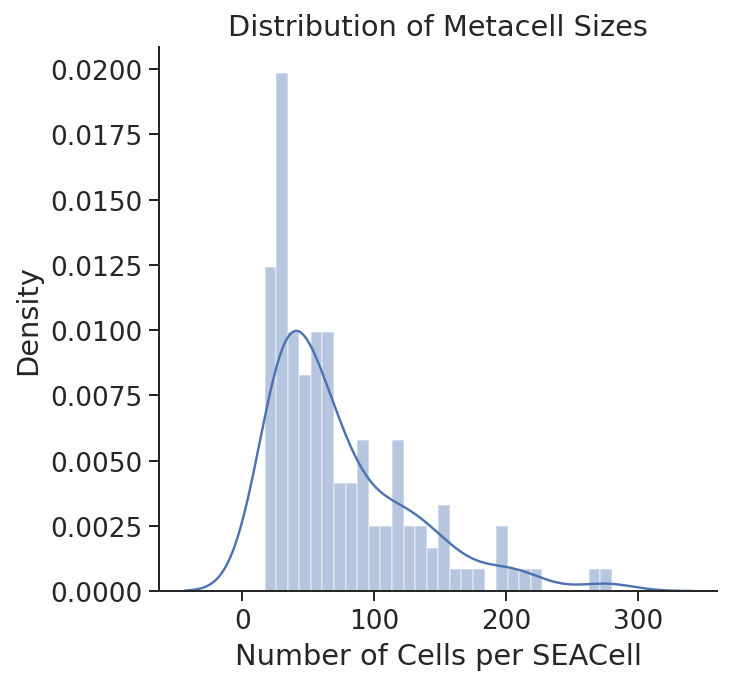

,size
SEACell,
SEACell-0,144
SEACell-1,119
SEACell-10,25
SEACell-100,54
SEACell-101,35
...,...
SEACell-95,37
SEACell-96,62
SEACell-97,25


In [276]:
SEACells.plot.plot_SEACell_sizes(ct, bins=30)

In [ ]:
ct.obs.groupby('SEACell').apply( lambda x: x.groupby('GroupFigure').size().idxmax() ).value_counts()

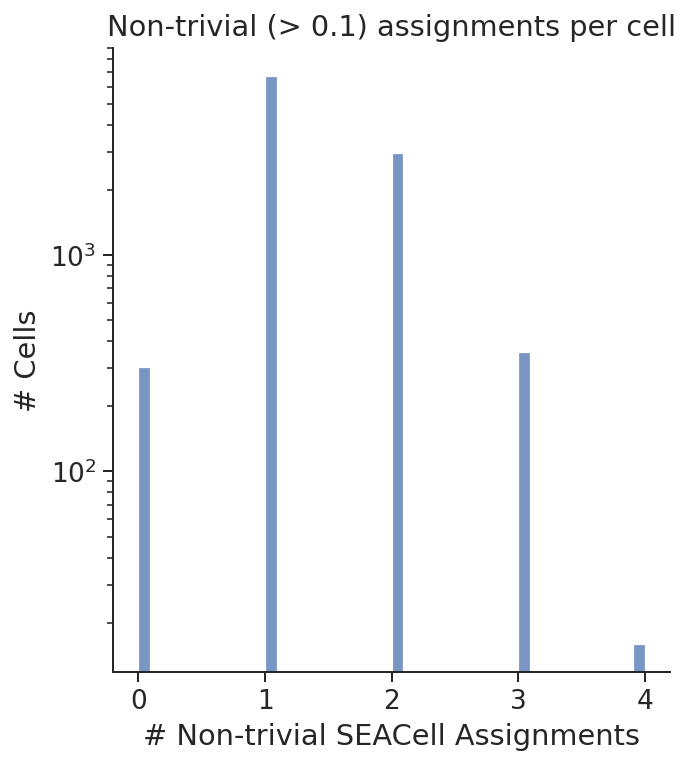

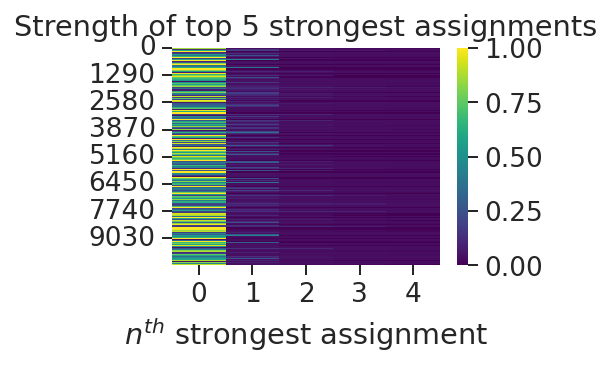

In [278]:
sns.displot((model.A_.T > 0.1).sum(axis=1), kde=False)
plt.title(f'Non-trivial (> 0.1) assignments per cell')
plt.xlabel('# Non-trivial SEACell Assignments')
plt.ylabel('# Cells')
plt.yscale('log')
plt.show()

plt.figure(figsize=(3,2))
b = np.partition(model.A_.T, -5)    
sns.heatmap(np.sort(b[:,-5:])[:, ::-1], cmap='viridis', vmin=0)
plt.title('Strength of top 5 strongest assignments')
plt.xlabel('$n^{th}$ strongest assignment')
plt.show()

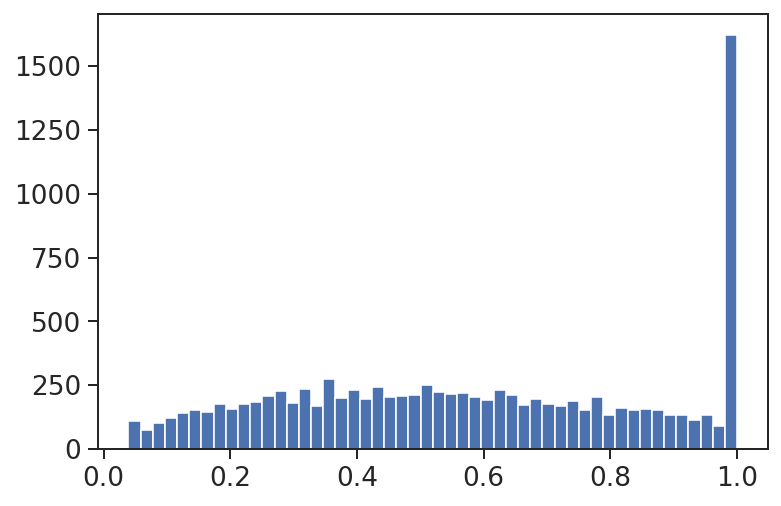

In [279]:
ct.obs['MaxSEACellScore'] = model.A_.max(0).flatten()
plt.hist( ct.obs['MaxSEACellScore'].values, bins=50 )
plt.show()

In [280]:
np.save( 'SEACellsOutput/Mlig.tail_SEACell_assignments.npy', model.A_ )

In [281]:
ct.obs.loc[:,'SEACell'] = [ c.replace( '-', '-tail-' ) for c in ct.obs.SEACell ]

## Merging samples

In [ ]:
# Transfer over the SEACell annotations to the complete dataset
update = pd.concat( (uc.obs,ch.obs,ct.obs), axis=0 )
peaks.obs['SEACell'] = update.loc[peaks.obs_names,'SEACell']
peaks.obs['MaxSEACellScore'] = update.loc[peaks.obs_names,'MaxSEACellScore']
del update
gc.collect()

peaks.obs

In [283]:
peaks.obs.loc[:,['SEACell','MaxSEACellScore']].to_csv( 'SEACellsOutput/Mlig.all_SEACell_assignments.csv' )

In [11]:
# Toss the cells that have no confident assignments
peaks = peaks[peaks.obs.MaxSEACellScore>0.1,:].copy()
peaks

AnnData object with n_obs × n_vars = 36199 × 236018
    obs: 'SeuratClusters', 'GroupSAMName', 'TissueSAM', 'Sample', '_scvi_batch', '_scvi_labels', 'cluster_pvi', 'Injury', 'GroupFigure', 'SEACell', 'MaxSEACellScore'
    var: 'seqnames', 'start', 'end', 'width', 'strand', 'score', 'idx', 'GC', 'N'
    uns: 'X_name'
    obsm: 'X_svd'

In [ ]:
# Read in the RNA data
rnau = sc.read_h5ad( 'GEXCounts/Mlig/kallisto_out/uncut/counts_unfiltered/adata.h5ad' )
rnau.obs_names = [ 'uncut#'+bc for bc in rnau.obs_names ]
rnau = rnau[uc.obs_names,:].copy()

rnah = sc.read_h5ad( 'GEXCounts/Mlig/kallisto_out/3H/counts_unfiltered/adata.h5ad' )
rnah.obs_names = [ 'head#'+bc for bc in rnah.obs_names ]
rnah = rnah[ch.obs_names,:].copy()

rnat = sc.read_h5ad( 'GEXCounts/Mlig/kallisto_out/3T/counts_unfiltered/adata.h5ad' )
rnat.obs_names = [ 'tail#'+bc for bc in rnat.obs_names ]
rnat = rnat[ct.obs_names,:].copy()

rna = ad.concat( (rnau,rnah,rnat) )[peaks.obs_names,:].copy()

del rnau
del rnah
del rnat
gc.collect()

rna

In [62]:
# aggregate over SEACell annotations
scATAC, scRNA = SEACells.genescores.prepare_multiome_anndata( peaks, rna )

scATAC

Generating Metacell matrices...
 ATAC


100%|█████████████████████████████████████████████████████████████| 502/502 [00:02<00:00, 219.77it/s]
/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/SEACells/genescores.py:48: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  atac_meta_ad.obsm['X_svd'] = summ_svd.loc[atac_meta_ad.obs_names, :].values
/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/SEACells/genescores.py:77: RuntimeWarning: divide by zero encountered in log10
  atac_ad.var['log_n_counts'] = np.ravel(np.log10(atac_ad.X.sum(axis=0)))
/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/SEACells/genescores.py:77: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  atac_ad.var['log_n_counts'] = np.ravel(np.log10(atac_ad.X.sum(axis=0)))


 RNA


100%|█████████████████████████████████████████████████████████████| 502/502 [00:01<00:00, 281.88it/s]
/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/SEACells/genescores.py:69: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  meta_ad.raw = meta_ad.copy()


AnnData object with n_obs × n_vars = 502 × 236015
    obs: 'n_counts'
    var: 'GC_bin', 'counts_bin', 'n_cells'
    uns: 'log1p'
    obsm: 'X_svd'
    layers: 'raw'

In [14]:
del rna
gc.collect()

1449

In [16]:
sclabels = scATAC.obs_names
tmpobs = peaks.obs.groupby('SEACell')\
                .apply( lambda x: x.groupby('GroupFigure').size().idxmax() )\
                .to_frame().loc[sclabels,:]
tmpobs['Sample'] = peaks.obs.groupby('SEACell')\
                          .apply( lambda x: x.groupby('Sample').size().idxmax() )\
                          .to_frame().loc[sclabels,:]

tmpobs

,GroupFigure,TissueSAM,Sample
SEACell-head-70,Epidermal-1,Epidermal,head
SEACell-head-128,Epidermal-1,Epidermal,head
SEACell-head-119,Epidermal-1,Epidermal,head
SEACell-head-155,Neural-1,Neural,head
SEACell-head-133,Epidermal-1,Epidermal,head
...,...,...,...
SEACell-uncut-135,Parenchymal-1,Parenchymal,uncut
SEACell-uncut-133,Protonephridia,Protonephridia,uncut
SEACell-uncut-156,Protonephridia,Protonephridia,uncut
SEACell-uncut-20,Parenchymal-1,Parenchymal,uncut


In [17]:
scATAC.obs = scATAC.obs.merge( tmpobs, left_index=True, right_index=True )

In [18]:
scRNA.obs = scRNA.obs.merge( tmpobs, left_index=True, right_index=True )

In [19]:
scATAC

AnnData object with n_obs × n_vars = 502 × 236015
    obs: 'n_counts', 'GroupFigure', 'TissueSAM', 'Sample'
    var: 'GC_bin', 'counts_bin', 'n_cells'
    uns: 'log1p'
    obsm: 'X_svd'
    layers: 'raw'

In [20]:
scRNA

AnnData object with n_obs × n_vars = 502 × 71174
    obs: 'n_counts', 'GroupFigure', 'TissueSAM', 'Sample'
    uns: 'log1p'
    layers: 'raw'

In [21]:
SEACells.accessibility.determine_metacell_open_peaks( scATAC )

100%|██████████████████████████████████████████████████████████████| 502/502 [00:31<00:00, 15.99it/s]


In [22]:
sc.pp.neighbors(scATAC, use_rep='X_svd')
sc.tl.umap(scATAC)

findfont: Font family ['Bitstream Vera Sans'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Bitstream Vera Sans'] not found. Falling back to DejaVu Sans.


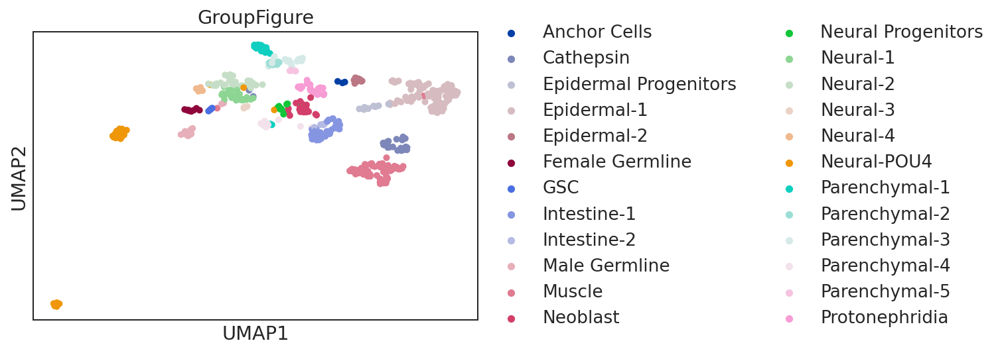

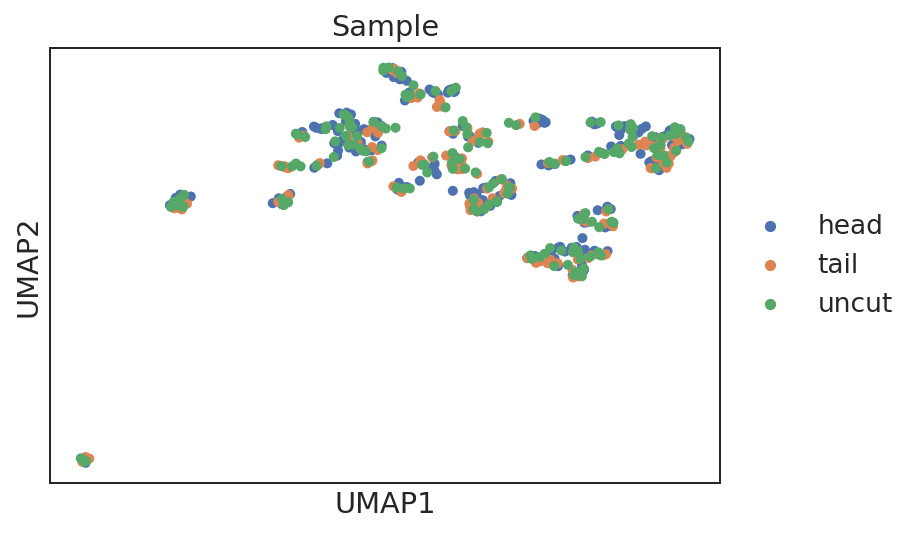

In [23]:
sc.pl.umap(scATAC, color='GroupFigure', s=100)
sc.pl.umap(scATAC, color='Sample', s=100)

Welcome to SEACells!
Computing kNN graph using scanpy NN ...
Computing radius for adaptive bandwidth kernel...


  0%|          | 0/502 [00:00<?, ?it/s]

Making graph symmetric...
Parameter graph_construction = union being used to build KNN graph...
Computing RBF kernel...


  0%|          | 0/502 [00:00<?, ?it/s]

Building similarity LIL matrix...


  0%|          | 0/502 [00:00<?, ?it/s]

Constructing CSR matrix...


/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


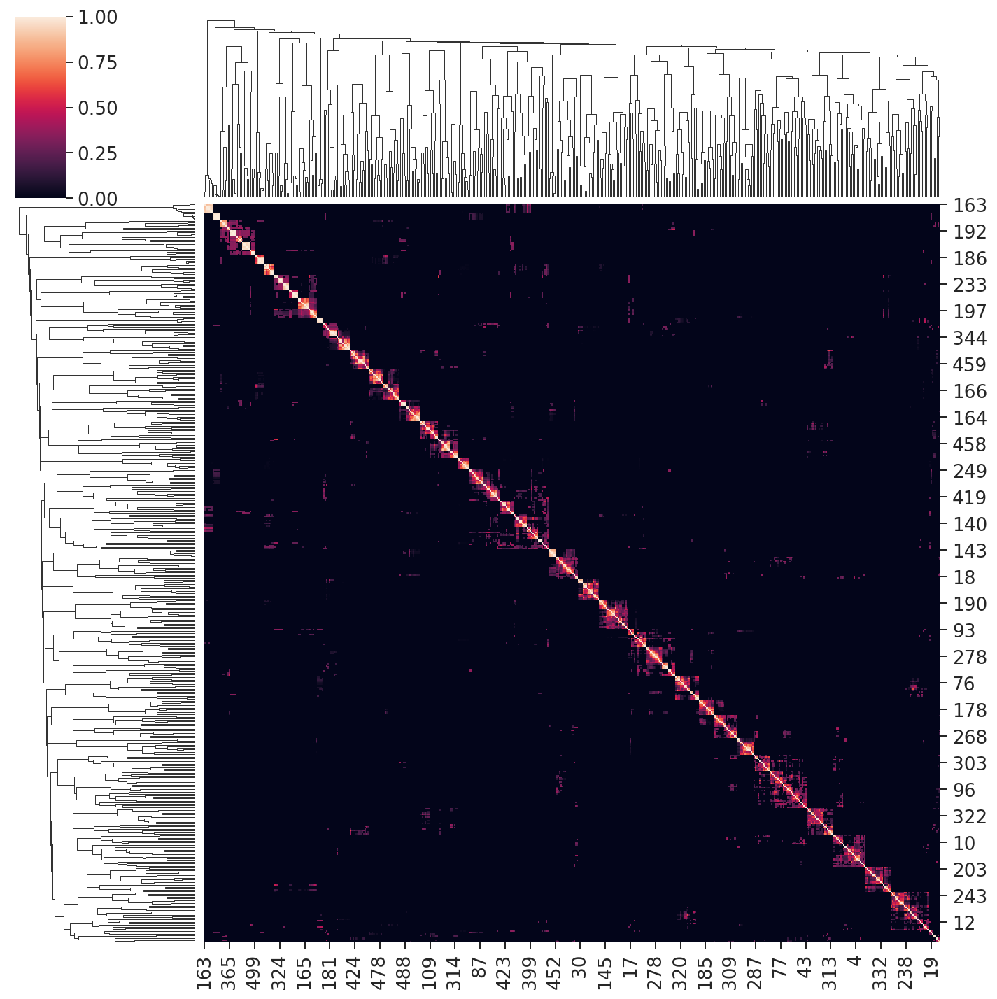

In [27]:
# Compute 'SEA2Cells' to cluster between samples
model = SEACells.core.SEACells(scATAC, 
                               build_kernel_on='X_svd', 
                               n_SEACells=scATAC.shape[0]//5, 
                               n_waypoint_eigs=10,
                               convergence_epsilon = 1e-6)

model.construct_kernel_matrix()
sns.clustermap(model.kernel_matrix.toarray()[:500,:500])
plt.show()

/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/palantir/utils.py:54: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  temp = sc.AnnData(data_df.values)


Building kernel on X_svd
Computing diffusion components from X_svd for waypoint initialization ... 
Determing nearest neighbor graph...
Done.
Sampling waypoints ...
Done.
Selecting 85 cells from waypoint initialization.
Initializing residual matrix using greedy column selection
Initializing f and g...


100%|██████████████████████████████████████████████████████████████| 25/25 [00:00<00:00, 1937.04it/s]

Selecting 15 cells from greedy initialization.


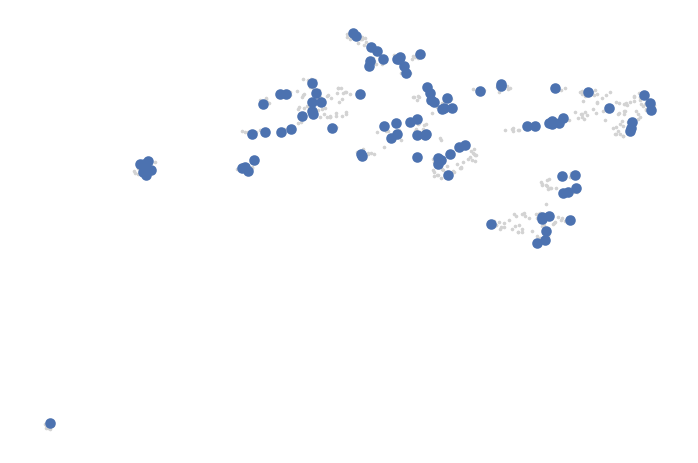

In [28]:
model.initialize_archetypes()
SEACells.plot.plot_initialization(scATAC, model)

Randomly initialized A matrix.
Setting convergence threshold at 0.00002
Starting iteration 1.
Completed iteration 1.
Starting iteration 10.
Completed iteration 10.
Starting iteration 20.
Completed iteration 20.
Starting iteration 30.
Completed iteration 30.
Starting iteration 40.
Completed iteration 40.
Starting iteration 50.
Completed iteration 50.
Starting iteration 60.
Completed iteration 60.
Converged after 63 iterations.


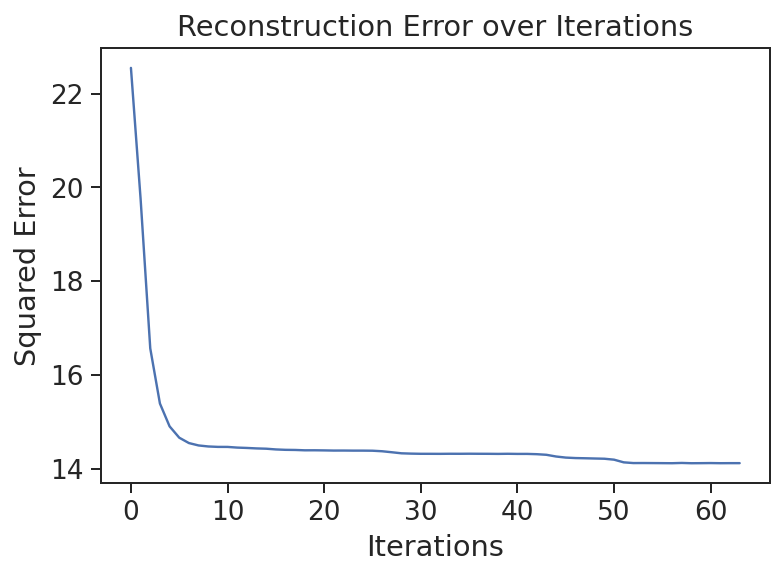

In [29]:
model.fit(min_iter=10, max_iter=200)
model.plot_convergence()

In [30]:
scATAC.layers['raw'] = scATAC.X

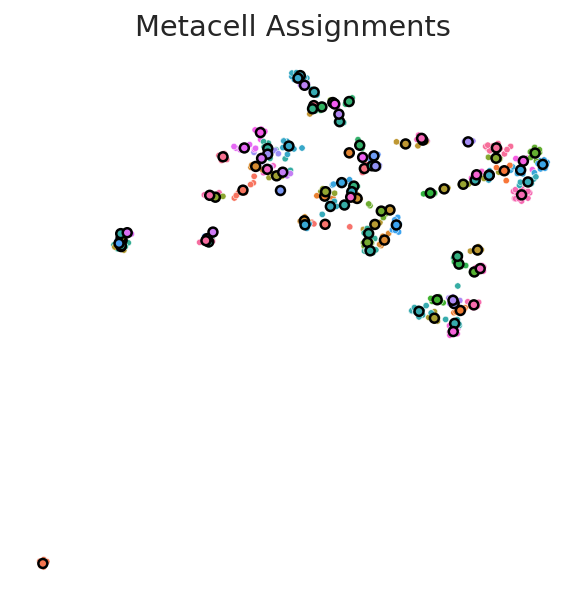

In [31]:
SEACells.plot.plot_2D(scATAC, key='X_umap', colour_metacells=True)

/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


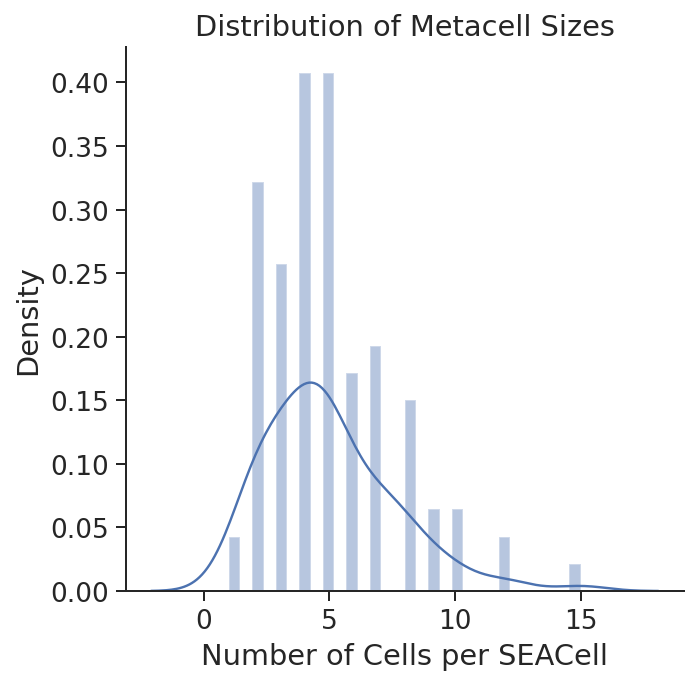

,size
SEACell,
SEACell-0,2
SEACell-1,2
SEACell-10,1
SEACell-11,3
SEACell-12,9
...,...
SEACell-95,6
SEACell-96,5
SEACell-97,4


In [32]:
SEACells.plot.plot_SEACell_sizes(scATAC, bins=30)

In [ ]:
scATAC.obs.groupby('SEACell').apply( lambda x: x.groupby('GroupFigure').size().idxmax() ).value_counts()

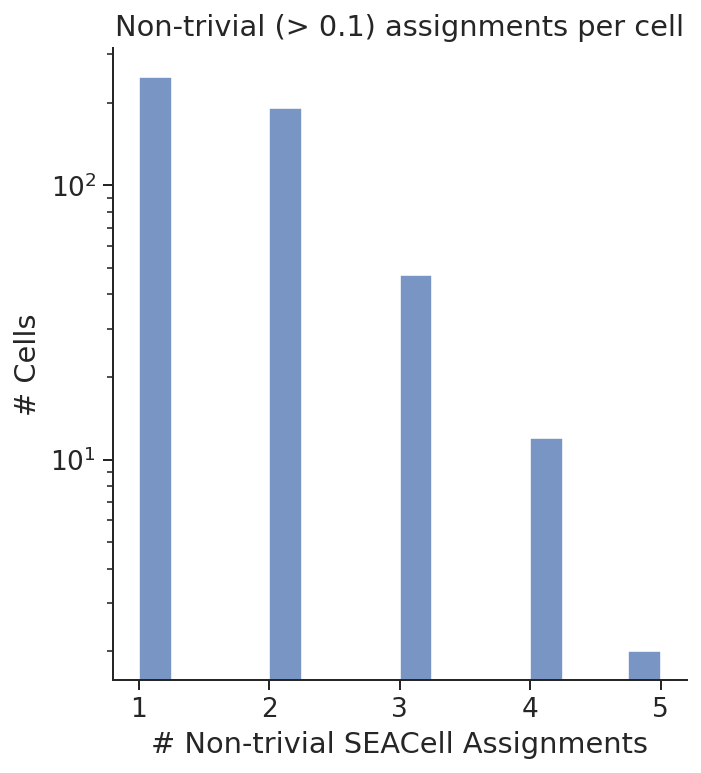

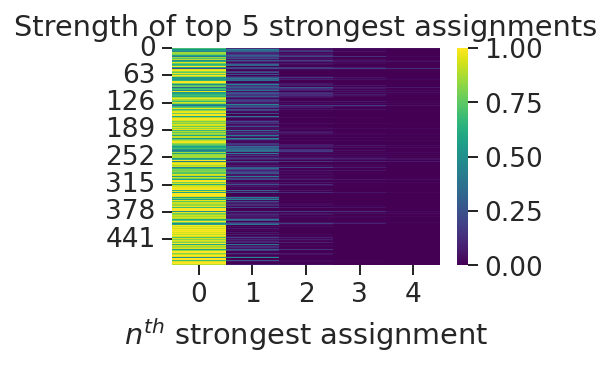

In [34]:
sns.displot((model.A_.T > 0.1).sum(axis=1), kde=False)
plt.title(f'Non-trivial (> 0.1) assignments per cell')
plt.xlabel('# Non-trivial SEACell Assignments')
plt.ylabel('# Cells')
plt.yscale('log')
plt.show()

plt.figure(figsize=(3,2))
b = np.partition(model.A_.T, -5)    
sns.heatmap(np.sort(b[:,-5:])[:, ::-1], cmap='viridis', vmin=0)
plt.title('Strength of top 5 strongest assignments')
plt.xlabel('$n^{th}$ strongest assignment')
plt.show()

In [ ]:
scATAC.write_h5ad( 'SEACellsOutput/Mlig.SEACells_ATAC.h5ad' )

In [ ]:
scRNA.write_h5ad( 'SEACellsOutput/Mlig.SEACells_RNA.h5ad' )

# *S. mediterranea*

## Read in the data

In [ ]:
peaks = sc.read_h5ad( 'ArchROutputs/Smed/Smed.peaks.h5ad' )

peaks

In [ ]:
peakdf = pd.read_csv( 'ArchROutputs/Smed/Smed.peaks.csv', index_col=0 )

peakdf.index = peakdf['seqnames'] + ':' + peakdf['start'].astype(str) + '-' + peakdf['end'].astype(str)
peaks.var = peakdf

In [ ]:
del peakdf

gc.collect()

In [ ]:
peaks.X = peaks.X.tocsr()

In [8]:
peaks

AnnData object with n_obs × n_vars = 20659 × 317488
    obs: 'ClustersSAM', 'GroupSAMName', 'TissueSAM', 'Sample', '_scvi_batch', '_scvi_labels', 'cluster_pvi', 'GroupFigure'
    var: 'seqnames', 'start', 'end', 'width', 'strand', 'score', 'idx', 'GC', 'N'
    uns: 'X_name'

In [9]:
peaks.obsm['X_svd'] = pd.read_csv('scVI_models/Smed.scvi_latent_dims.csv', 
                                  index_col=0).loc[peaks.obs_names, : ].values

Process the data separately per condition

## Asexual cut

In [15]:
ac = peaks[peaks.obs.Sample=='Smed_cut_g4_v03',:].copy()

ac

AnnData object with n_obs × n_vars = 7604 × 317488
    obs: 'ClustersSAM', 'GroupSAMName', 'TissueSAM', 'Sample', '_scvi_batch', '_scvi_labels', 'cluster_pvi', 'GroupFigure'
    var: 'seqnames', 'start', 'end', 'width', 'strand', 'score', 'idx', 'GC', 'N'
    uns: 'X_name', 'GeneScoresColums'
    obsm: 'X_svd', 'GeneScores'

In [16]:
warnings.filterwarnings('ignore')
sc.pp.neighbors(ac, use_rep='X_svd')
sc.tl.umap(ac)
sc.tl.leiden(ac)
warnings.filterwarnings('default')

findfont: Font family ['Bitstream Vera Sans'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Bitstream Vera Sans'] not found. Falling back to DejaVu Sans.


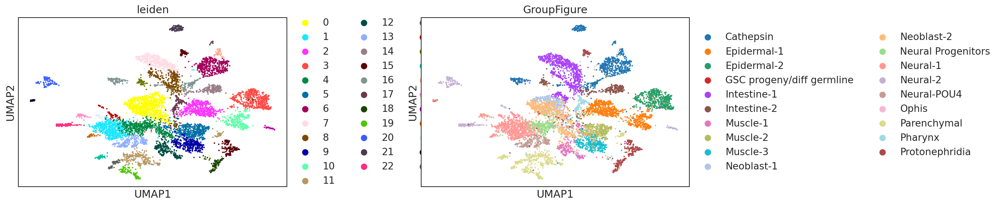

In [ ]:
sc.pl.scatter(ac, basis='umap', color=['leiden', 'GroupFigure'])
plt.show()

In [30]:
# Need more SEACells here because we weren't 
# hitting all of the smaller clusters
nsc = len( ac.obs_names ) // 50 + 1
nsc

153

In [38]:
model = SEACells.core.SEACells( ac, build_kernel_on='X_svd', n_SEACells=nsc, 
                                n_waypoint_eigs=10, convergence_epsilon=1e-5 )

Welcome to SEACells!


In [39]:
model.construct_kernel_matrix()
M = model.kernel_matrix

Computing kNN graph using scanpy NN ...
Computing radius for adaptive bandwidth kernel...


/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/scipy/sparse/_index.py:146: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


  0%|          | 0/7604 [00:00<?, ?it/s]

Making graph symmetric...
Parameter graph_construction = union being used to build KNN graph...
Computing RBF kernel...


sys:1: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f50db018160>


  0%|          | 0/7604 [00:00<?, ?it/s]

Building similarity LIL matrix...


sys:1: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f50db0bae80>


  0%|          | 0/7604 [00:00<?, ?it/s]

Constructing CSR matrix...


/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


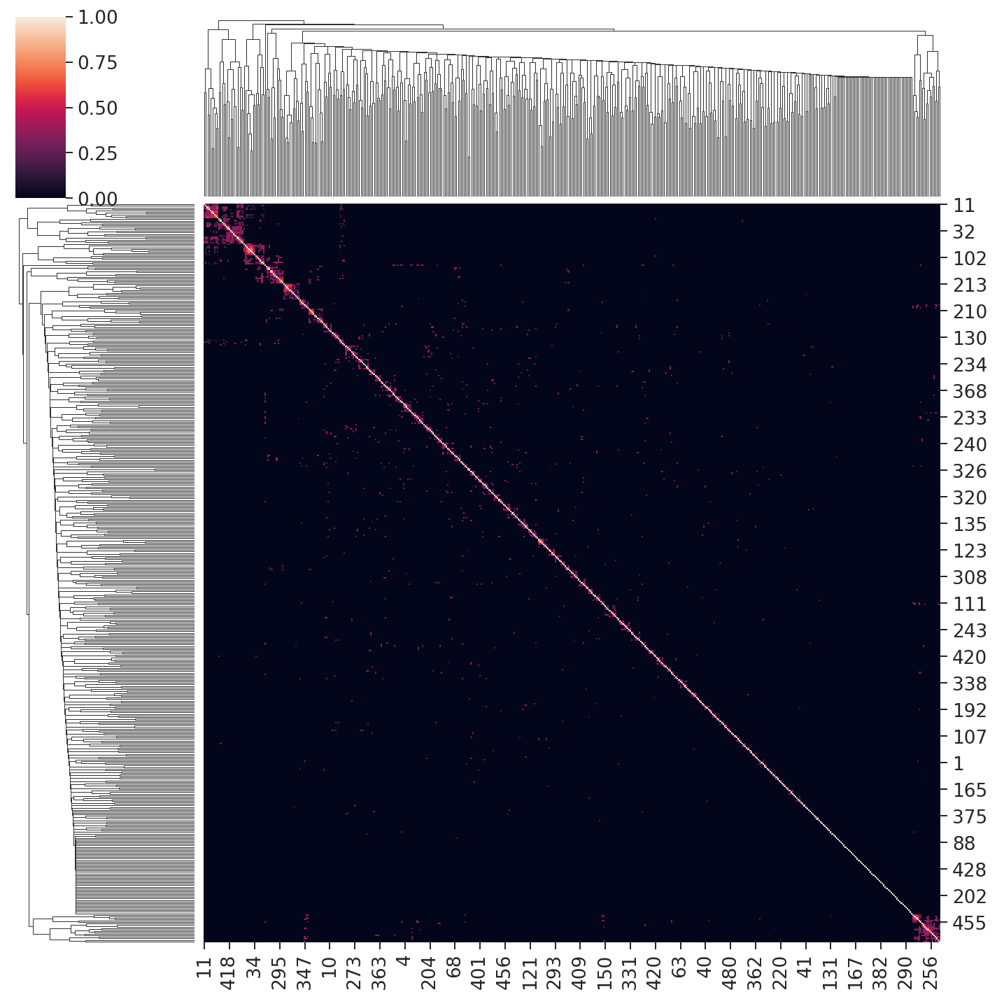

In [40]:
sns.clustermap(M.toarray()[:500,:500])
plt.show()

In [41]:
model.initialize_archetypes()

Building kernel on X_svd
Computing diffusion components from X_svd for waypoint initialization ... 
Determing nearest neighbor graph...


/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/palantir/utils.py:54: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  temp = sc.AnnData(data_df.values)


Done.
Sampling waypoints ...
Done.
Selecting 135 cells from waypoint initialization.
Initializing residual matrix using greedy column selection
Initializing f and g...


100%|███████████████████████████████████████████████████████████████████████| 28/28 [00:00<00:00, 170.48it/s]

Selecting 18 cells from greedy initialization.


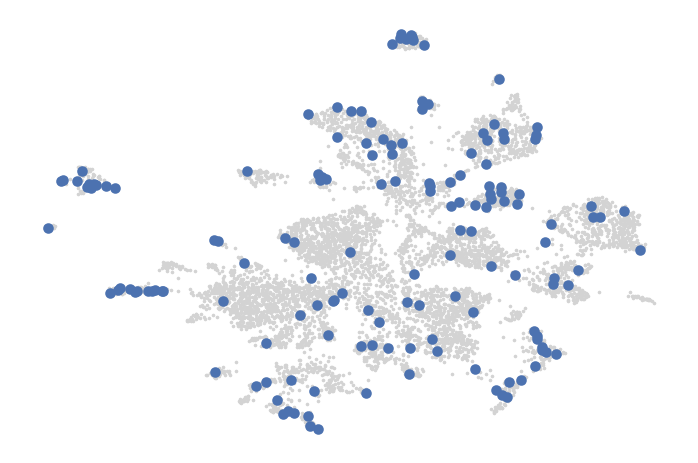

In [42]:
SEACells.plot.plot_initialization(ac, model)

In [43]:
model.fit(min_iter=10, max_iter=1000)

Randomly initialized A matrix.
Setting convergence threshold at 0.00149
Starting iteration 1.
Completed iteration 1.
Starting iteration 10.
Completed iteration 10.
Starting iteration 20.
Completed iteration 20.
Converged after 23 iterations.


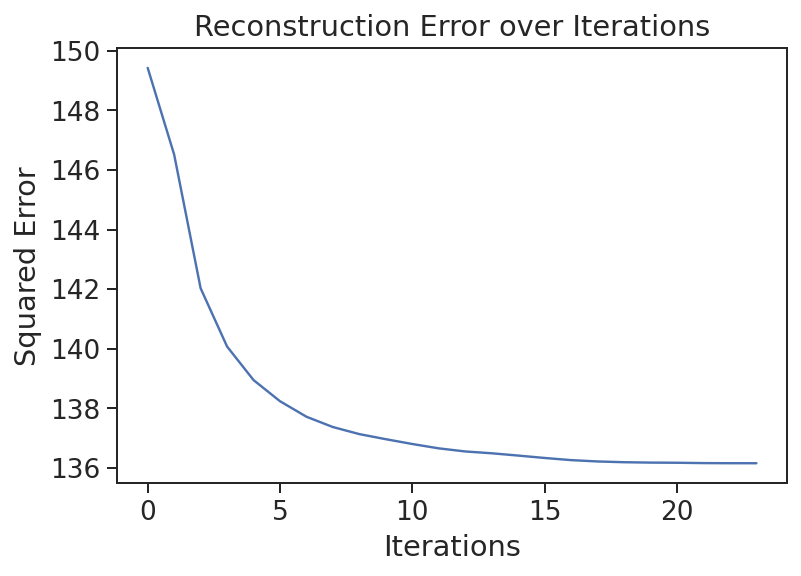

In [44]:
model.plot_convergence()

In [45]:
ac.layers['raw'] = ac.X

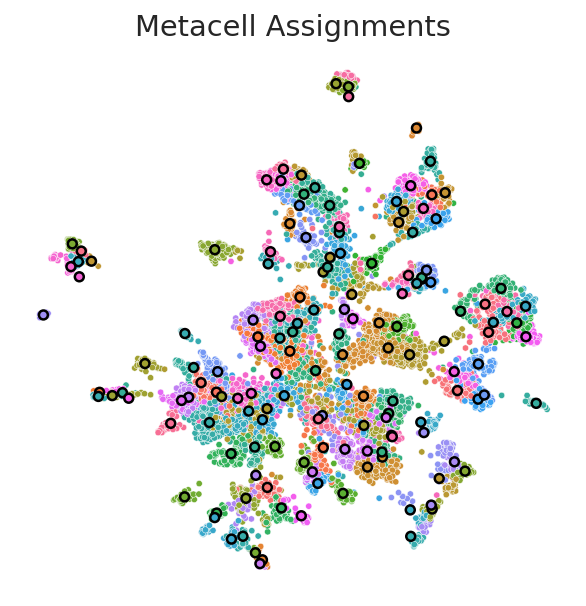

In [46]:
SEACells.plot.plot_2D(ac, key='X_umap', colour_metacells=True)

/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


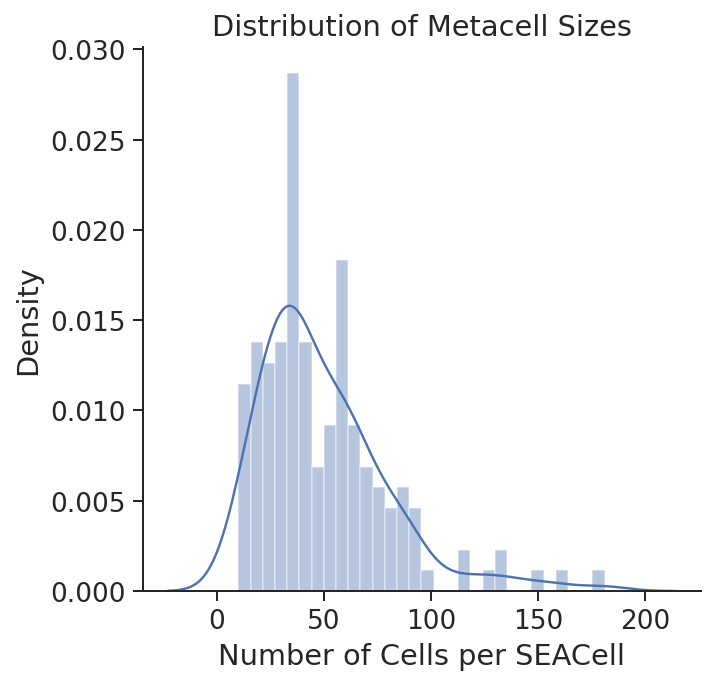

,size
SEACell,
SEACell-0,10
SEACell-1,56
SEACell-10,50
SEACell-100,67
SEACell-101,47
...,...
SEACell-95,28
SEACell-96,35
SEACell-97,20


In [47]:
SEACells.plot.plot_SEACell_sizes(ac, bins=30)

In [ ]:
ac.obs.groupby('SEACell').apply( lambda x: x.groupby('GroupFigure').size().idxmax() ).value_counts()

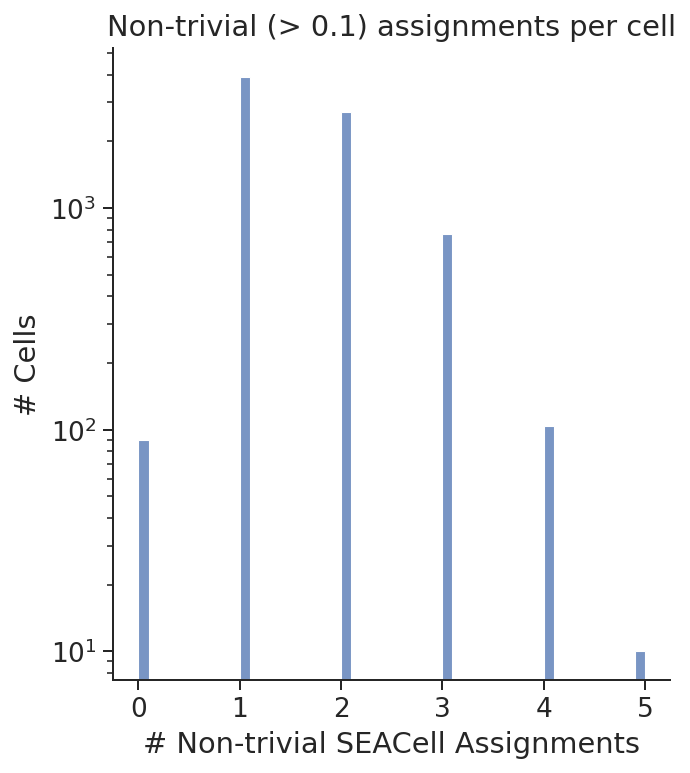

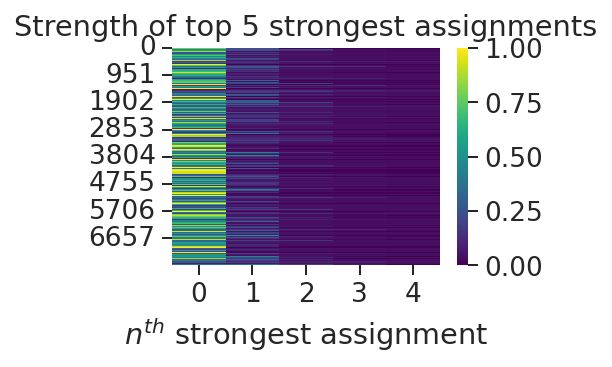

In [49]:
sns.displot((model.A_.T > 0.1).sum(axis=1), kde=False)
plt.title(f'Non-trivial (> 0.1) assignments per cell')
plt.xlabel('# Non-trivial SEACell Assignments')
plt.ylabel('# Cells')
plt.yscale('log')
plt.show()

plt.figure(figsize=(3,2))
b = np.partition(model.A_.T, -5)    
sns.heatmap(np.sort(b[:,-5:])[:, ::-1], cmap='viridis', vmin=0)
plt.title('Strength of top 5 strongest assignments')
plt.xlabel('$n^{th}$ strongest assignment')
plt.show()

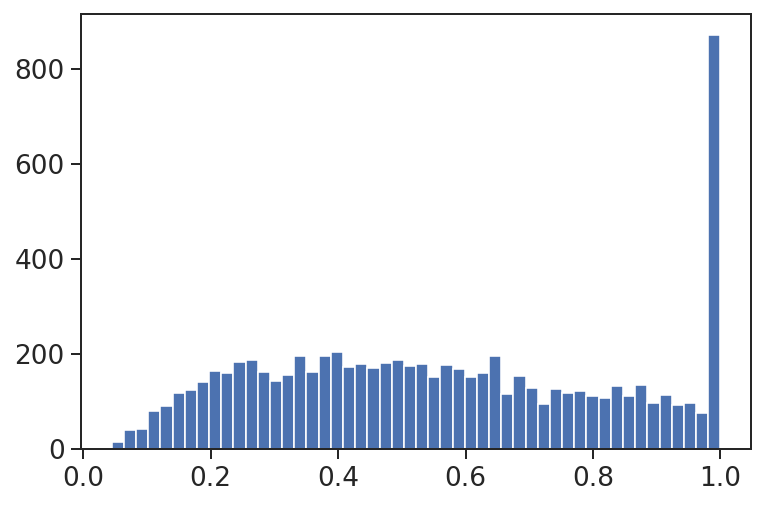

In [50]:
ac.obs['MaxSEACellScore'] = model.A_.max(0).flatten()
plt.hist( ac.obs['MaxSEACellScore'].values, bins=50 )
plt.show()

In [51]:
np.save( 'SEACellsOutput/Smed.cut_SEACell_assignments.npy', model.A_ )

In [52]:
ac.obs.loc[:,'SEACell'] = [ c.replace( '-', '-Smed_cut_g4_v03-' ) for c in ac.obs.SEACell ]

## Asexual uncut

In [53]:
au = peaks[peaks.obs.Sample=='Smed_uncut_g4_v03',:].copy()

au

AnnData object with n_obs × n_vars = 6034 × 317488
    obs: 'ClustersSAM', 'GroupSAMName', 'TissueSAM', 'Sample', '_scvi_batch', '_scvi_labels', 'cluster_pvi', 'GroupFigure'
    var: 'seqnames', 'start', 'end', 'width', 'strand', 'score', 'idx', 'GC', 'N'
    uns: 'X_name', 'GeneScoresColums'
    obsm: 'X_svd', 'GeneScores'

In [54]:
warnings.filterwarnings('ignore')
sc.pp.neighbors(au, use_rep='X_svd')
sc.tl.umap(au)
sc.tl.leiden(au)
warnings.filterwarnings('default')

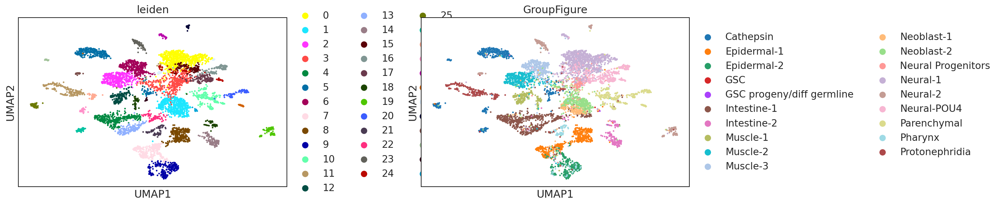

In [55]:
sc.pl.scatter(au, basis='umap', color=['leiden', 'GroupFigure'])
plt.show()

In [58]:
nsc = len( au.obs_names ) // 50 + 1
nsc

121

In [59]:
model = SEACells.core.SEACells( au, build_kernel_on='X_svd', n_SEACells=nsc, 
                                n_waypoint_eigs=10, convergence_epsilon=1e-5 )

Welcome to SEACells!


In [60]:
model.construct_kernel_matrix()
M = model.kernel_matrix

Computing kNN graph using scanpy NN ...
Computing radius for adaptive bandwidth kernel...


/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/scipy/sparse/_index.py:146: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


  0%|          | 0/6034 [00:00<?, ?it/s]

Making graph symmetric...
Parameter graph_construction = union being used to build KNN graph...
Computing RBF kernel...


sys:1: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f50d19407c0>


  0%|          | 0/6034 [00:00<?, ?it/s]

Building similarity LIL matrix...


sys:1: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f50d62eb6a0>


  0%|          | 0/6034 [00:00<?, ?it/s]

Constructing CSR matrix...


/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


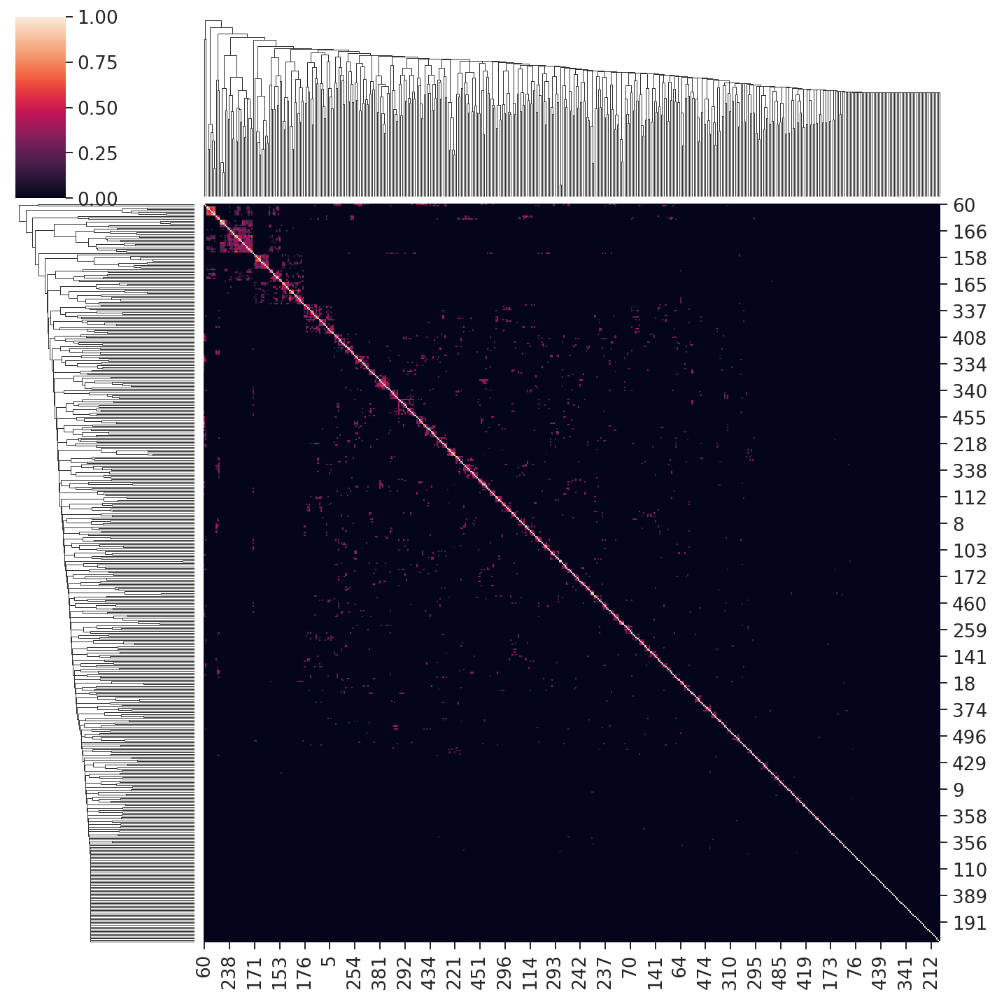

In [61]:
sns.clustermap(M.toarray()[:500,:500])
plt.show()

In [62]:
model.initialize_archetypes()

Building kernel on X_svd
Computing diffusion components from X_svd for waypoint initialization ... 
Determing nearest neighbor graph...


/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/palantir/utils.py:54: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  temp = sc.AnnData(data_df.values)


Done.
Sampling waypoints ...
Done.
Selecting 106 cells from waypoint initialization.
Initializing residual matrix using greedy column selection
Initializing f and g...


100%|███████████████████████████████████████████████████████████████████████| 25/25 [00:00<00:00, 250.10it/s]

Selecting 15 cells from greedy initialization.


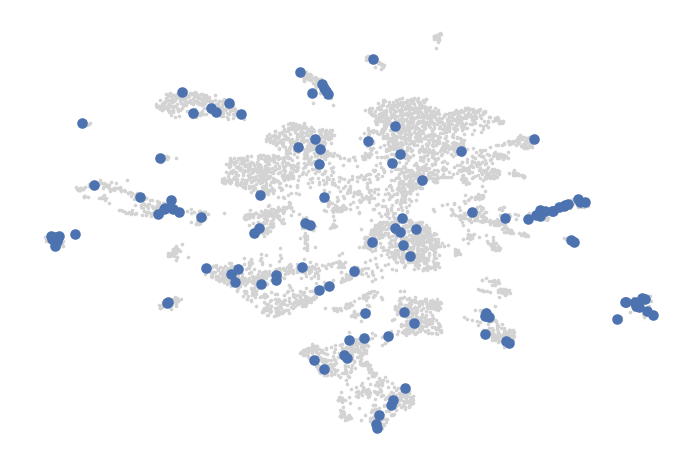

In [63]:
SEACells.plot.plot_initialization(au, model)

In [64]:
model.fit(min_iter=10, max_iter=100)

Randomly initialized A matrix.
Setting convergence threshold at 0.00133
Starting iteration 1.
Completed iteration 1.
Starting iteration 10.
Completed iteration 10.
Starting iteration 20.
Completed iteration 20.
Starting iteration 30.
Completed iteration 30.
Starting iteration 40.
Completed iteration 40.
Converged after 40 iterations.


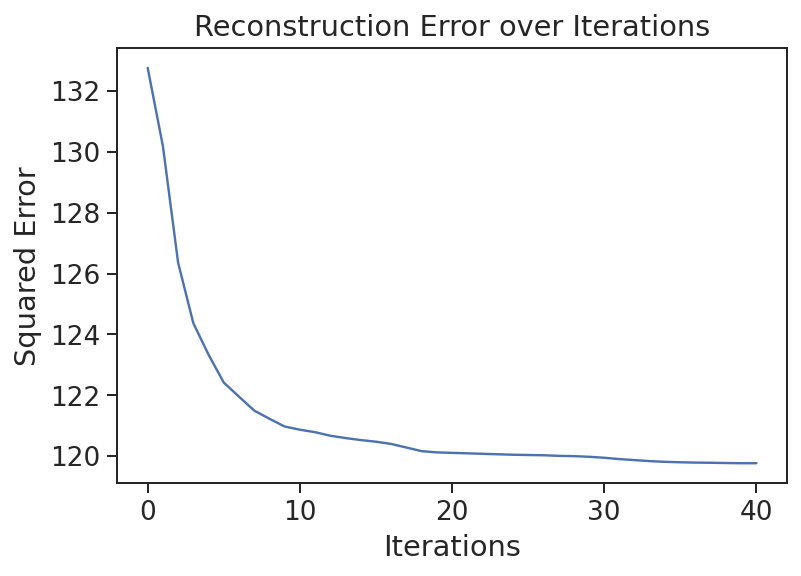

In [65]:
model.plot_convergence()

In [66]:
au.layers['raw'] = au.X

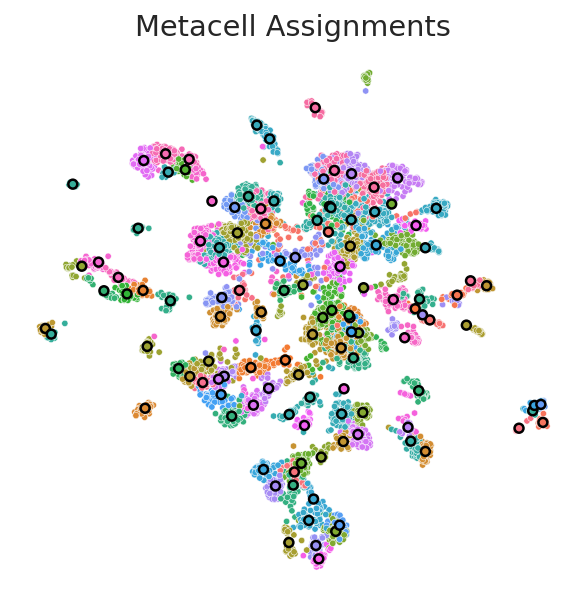

In [67]:
SEACells.plot.plot_2D(au, key='X_umap', colour_metacells=True)

/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


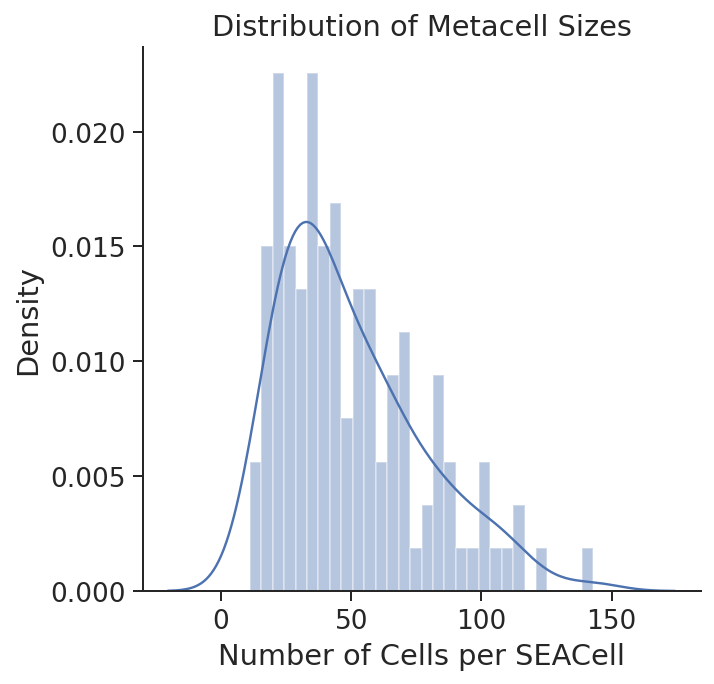

,size
SEACell,
SEACell-0,24
SEACell-1,16
SEACell-10,31
SEACell-100,33
SEACell-101,104
...,...
SEACell-95,113
SEACell-96,35
SEACell-97,113


In [68]:
SEACells.plot.plot_SEACell_sizes(au, bins=30)

In [ ]:
au.obs.groupby('SEACell').apply( lambda x: x.groupby('GroupFigure').size().idxmax() ).value_counts()

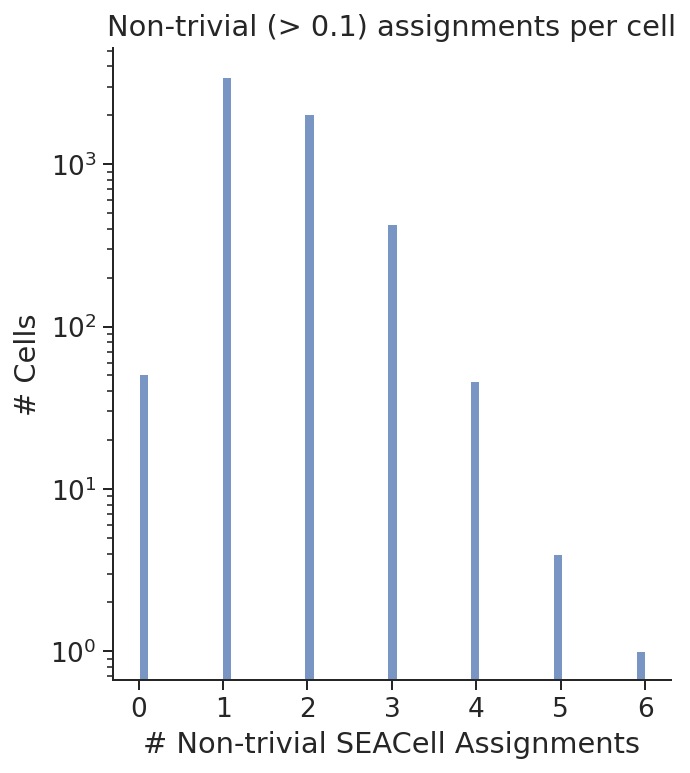

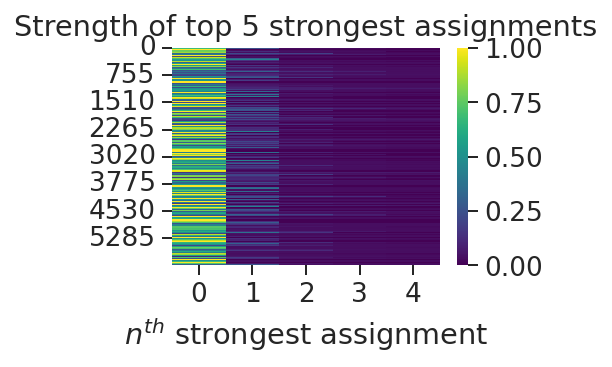

In [70]:
sns.displot((model.A_.T > 0.1).sum(axis=1), kde=False)
plt.title(f'Non-trivial (> 0.1) assignments per cell')
plt.xlabel('# Non-trivial SEACell Assignments')
plt.ylabel('# Cells')
plt.yscale('log')
plt.show()

plt.figure(figsize=(3,2))
b = np.partition(model.A_.T, -5)    
sns.heatmap(np.sort(b[:,-5:])[:, ::-1], cmap='viridis', vmin=0)
plt.title('Strength of top 5 strongest assignments')
plt.xlabel('$n^{th}$ strongest assignment')
plt.show()

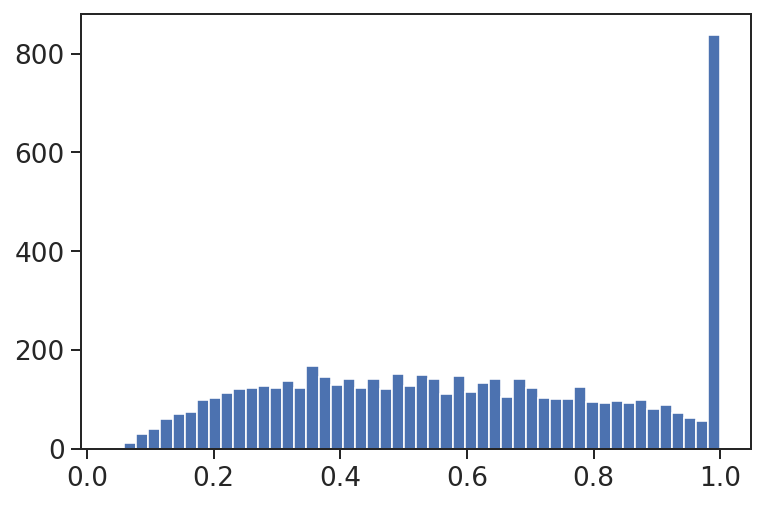

In [71]:
au.obs['MaxSEACellScore'] = model.A_.max(0).flatten()
plt.hist( au.obs['MaxSEACellScore'].values, bins=50 )
plt.show()

In [72]:
np.save( 'SEACellsOutput/Smed.uncut_SEACell_assignments.npy', model.A_ )

In [73]:
au.obs.loc[:,'SEACell'] = [ c.replace( '-', '-Smed_uncut_g4_v03-' ) for c in au.obs.SEACell ]

## Sexual

In [74]:
s1 = peaks[peaks.obs.Sample.str.contains('S2F2'),:].copy()

s1

AnnData object with n_obs × n_vars = 7021 × 317488
    obs: 'ClustersSAM', 'GroupSAMName', 'TissueSAM', 'Sample', '_scvi_batch', '_scvi_labels', 'cluster_pvi', 'GroupFigure'
    var: 'seqnames', 'start', 'end', 'width', 'strand', 'score', 'idx', 'GC', 'N'
    uns: 'X_name', 'GeneScoresColums'
    obsm: 'X_svd', 'GeneScores'

In [75]:
warnings.filterwarnings('ignore')
sc.pp.neighbors(s1, use_rep='X_svd')
sc.tl.umap(s1)
sc.tl.leiden(s1)
warnings.filterwarnings('default')

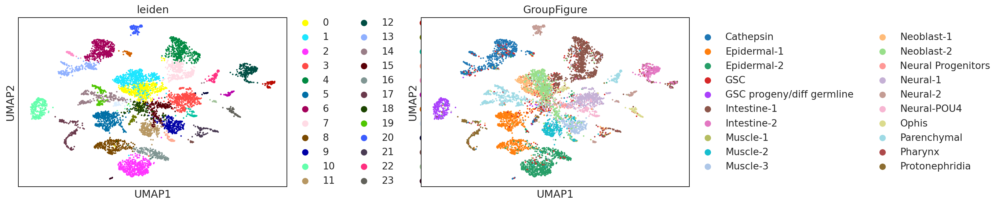

In [76]:
sc.pl.scatter(s1, basis='umap', color=['leiden', 'GroupFigure'])
plt.show()

In [79]:
nsc = len( s1.obs_names ) // 50 + 1
nsc

141

In [80]:
model = SEACells.core.SEACells( s1, build_kernel_on='X_svd', n_SEACells=nsc, 
                                n_waypoint_eigs=10, convergence_epsilon=1e-5 )

Welcome to SEACells!


In [81]:
model.construct_kernel_matrix()
M = model.kernel_matrix

Computing kNN graph using scanpy NN ...
Computing radius for adaptive bandwidth kernel...


/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/scipy/sparse/_index.py:146: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


  0%|          | 0/7021 [00:00<?, ?it/s]

Making graph symmetric...
Parameter graph_construction = union being used to build KNN graph...
Computing RBF kernel...


sys:1: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f50db01ce20>


  0%|          | 0/7021 [00:00<?, ?it/s]

Building similarity LIL matrix...


sys:1: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f50db016280>


  0%|          | 0/7021 [00:00<?, ?it/s]

Constructing CSR matrix...


/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


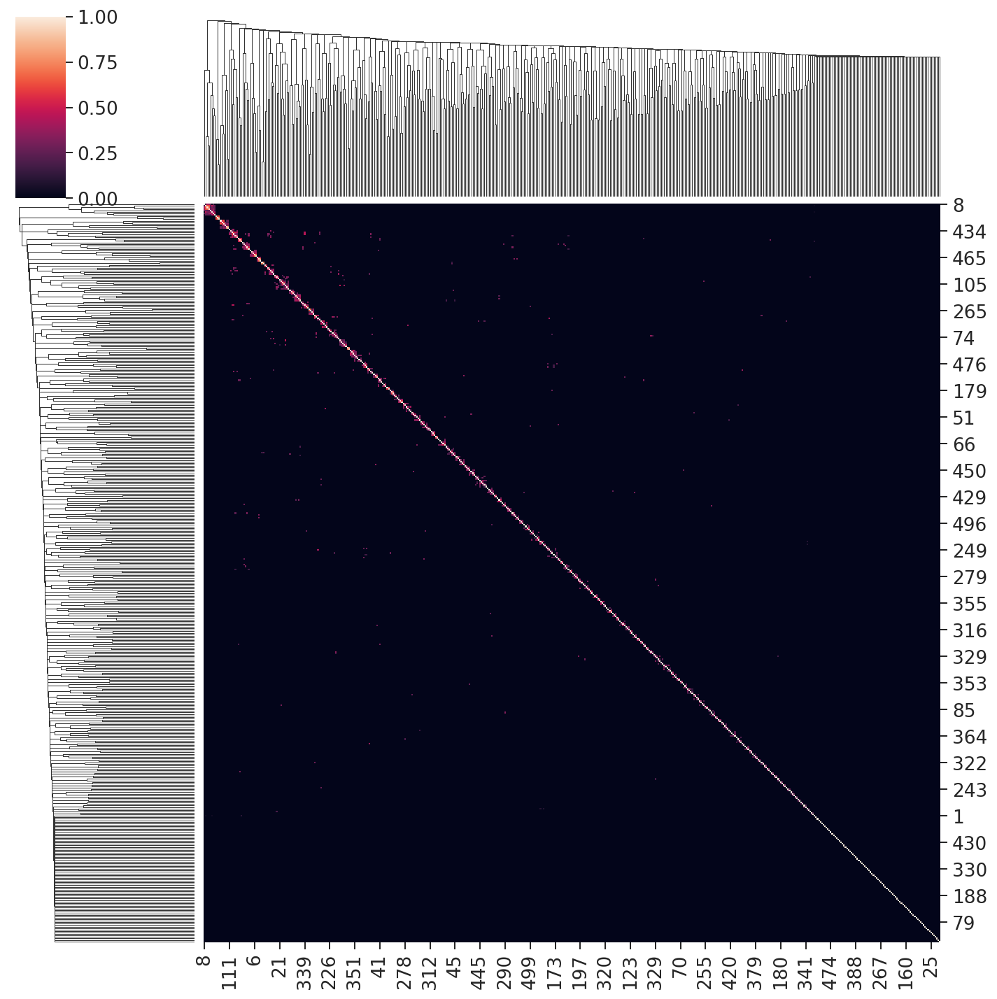

In [82]:
sns.clustermap(M.toarray()[:500,:500])
plt.show()

In [83]:
model.initialize_archetypes()

Building kernel on X_svd
Computing diffusion components from X_svd for waypoint initialization ... 
Determing nearest neighbor graph...


/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/palantir/utils.py:54: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  temp = sc.AnnData(data_df.values)


Done.
Sampling waypoints ...
Done.
Selecting 124 cells from waypoint initialization.
Initializing residual matrix using greedy column selection
Initializing f and g...


100%|███████████████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 203.19it/s]

Selecting 17 cells from greedy initialization.


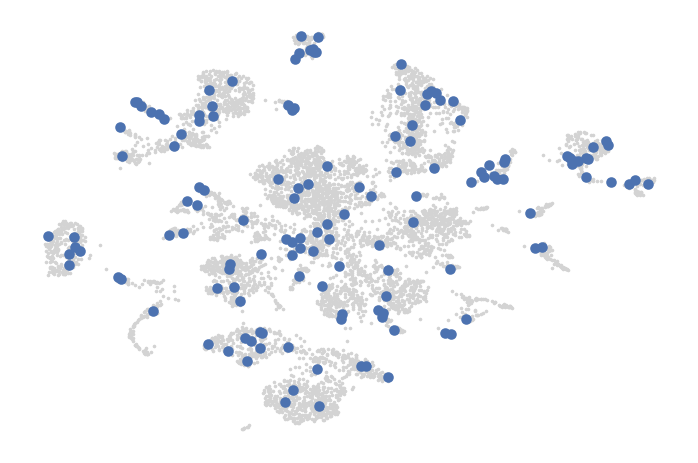

In [84]:
SEACells.plot.plot_initialization(s1, model)

In [85]:
model.fit(min_iter=10, max_iter=100)

Randomly initialized A matrix.
Setting convergence threshold at 0.00144
Starting iteration 1.
Completed iteration 1.
Starting iteration 10.
Completed iteration 10.
Starting iteration 20.
Completed iteration 20.
Starting iteration 30.
Completed iteration 30.
Converged after 32 iterations.


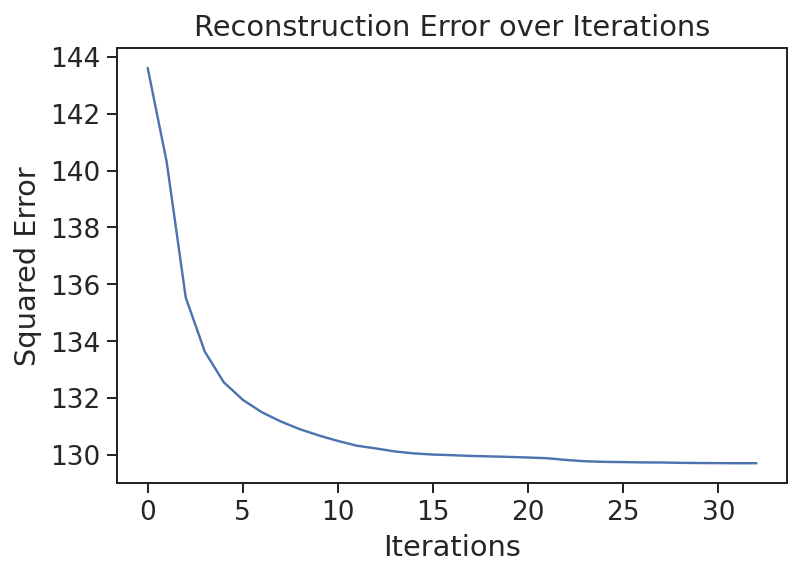

In [86]:
model.plot_convergence()

In [87]:
s1.layers['raw'] = s1.X

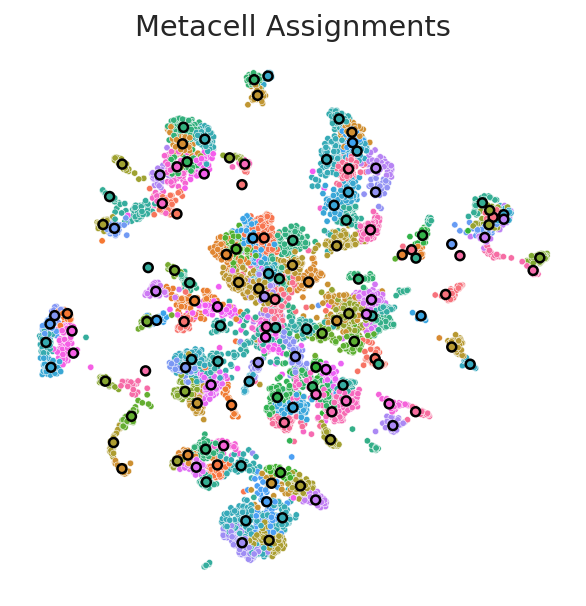

In [88]:
SEACells.plot.plot_2D(s1, key='X_umap', colour_metacells=True)

/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


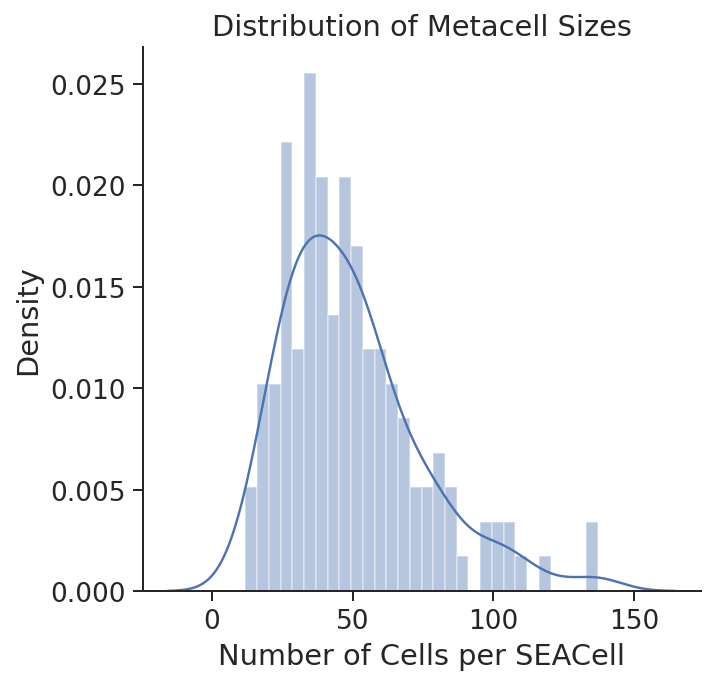

,size
SEACell,
SEACell-0,19
SEACell-1,23
SEACell-10,45
SEACell-100,12
SEACell-101,41
...,...
SEACell-95,21
SEACell-96,26
SEACell-97,59


In [89]:
SEACells.plot.plot_SEACell_sizes(s1, bins=30)

In [ ]:
s1.obs.groupby('SEACell').apply( lambda x: x.groupby('GroupFigure').size().idxmax() ).value_counts()

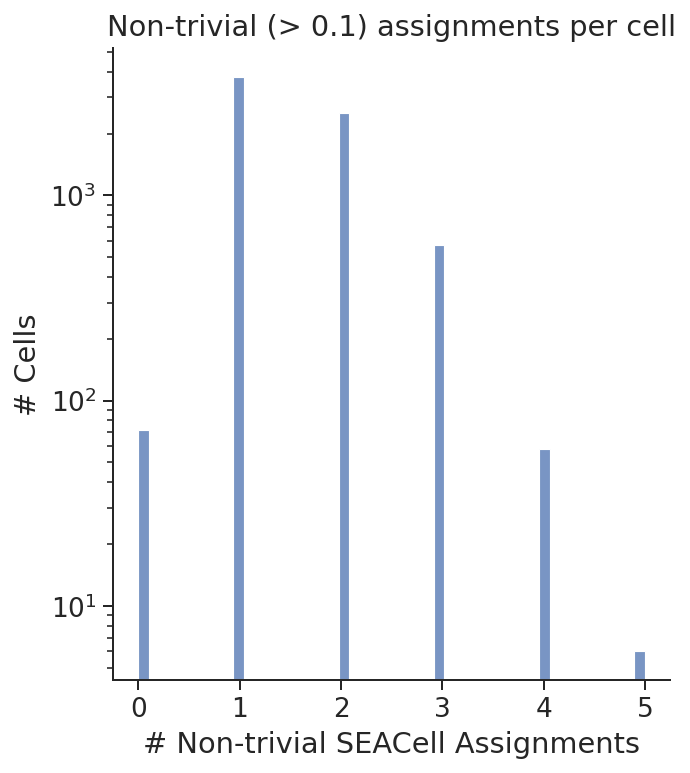

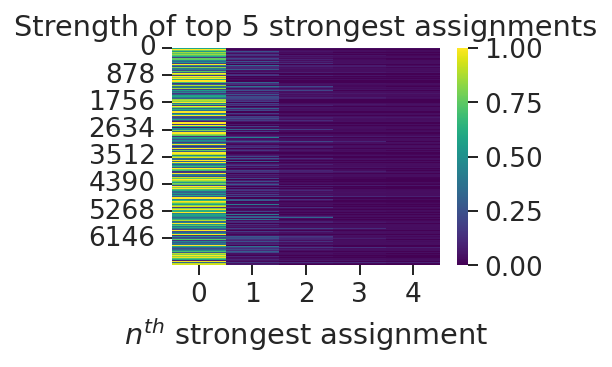

In [91]:
sns.displot((model.A_.T > 0.1).sum(axis=1), kde=False)
plt.title(f'Non-trivial (> 0.1) assignments per cell')
plt.xlabel('# Non-trivial SEACell Assignments')
plt.ylabel('# Cells')
plt.yscale('log')
plt.show()

plt.figure(figsize=(3,2))
b = np.partition(model.A_.T, -5)    
sns.heatmap(np.sort(b[:,-5:])[:, ::-1], cmap='viridis', vmin=0)
plt.title('Strength of top 5 strongest assignments')
plt.xlabel('$n^{th}$ strongest assignment')
plt.show()

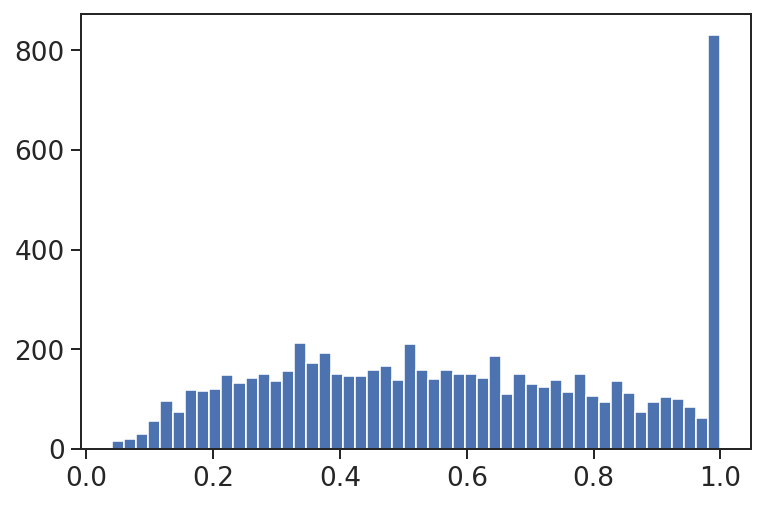

In [92]:
s1.obs['MaxSEACellScore'] = model.A_.max(0).flatten()
plt.hist( s1.obs['MaxSEACellScore'].values, bins=50 )
plt.show()

In [93]:
# np.save( 'planarian_SEACells_Models/sexual_assignments_pvi.npy', model.A_ )
np.save( 'SEACellsOutput/Smed.S2F2_SEACell_assignments.npy', model.A_ )

In [94]:
s1.obs.loc[:,'SEACell'] = [ c.replace( '-', '-S2F2-' ) for c in s1.obs.SEACell ]

# Merging samples

In [ ]:
update = pd.concat( (ac.obs,au.obs,s1.obs), axis=0 )
peaks.obs['SEACell'] = update.loc[peaks.obs_names,'SEACell']
peaks.obs['MaxSEACellScore'] = update.loc[peaks.obs_names,'MaxSEACellScore']
del update
gc.collect()

peaks.obs

In [96]:
peaks.obs.loc[:,['SEACell','MaxSEACellScore']].to_csv( 'SEACellsOutput/Smed.all_SEACell_assignments.csv' )

In [97]:
peaks = peaks[peaks.obs.MaxSEACellScore>0.1,:].copy()
peaks

AnnData object with n_obs × n_vars = 20446 × 317488
    obs: 'ClustersSAM', 'GroupSAMName', 'TissueSAM', 'Sample', '_scvi_batch', '_scvi_labels', 'cluster_pvi', 'GroupFigure', 'SEACell', 'MaxSEACellScore'
    var: 'seqnames', 'start', 'end', 'width', 'strand', 'score', 'idx', 'GC', 'N'
    uns: 'X_name', 'GeneScoresColums'
    obsm: 'X_svd', 'GeneScores'

In [98]:
rna = sc.read_h5ad( 'GEXCounts/Smed/Smed.raw_RNA_counts.h5ad' )
rna.layers['raw'] = rna.X
rna = rna[peaks.obs_names,:].copy()
rna.obs = peaks.obs

rna

AnnData object with n_obs × n_vars = 20446 × 22192
    obs: 'ClustersSAM', 'GroupSAMName', 'TissueSAM', 'Sample', '_scvi_batch', '_scvi_labels', 'cluster_pvi', 'GroupFigure', 'SEACell', 'MaxSEACellScore'
    layers: 'raw'

In [100]:
scATAC, scRNA = SEACells.genescores.prepare_multiome_anndata( peaks, rna )

scATAC

Generating Metacell matrices...
 ATAC


100%|█████████████████████████████████████████████████████████████████████| 415/415 [00:01<00:00, 266.12it/s]
/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/SEACells/genescores.py:48: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  atac_meta_ad.obsm['X_svd'] = summ_svd.loc[atac_meta_ad.obs_names, :].values
/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/SEACells/genescores.py:77: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  atac_ad.var['log_n_counts'] = np.ravel(np.log10(atac_ad.X.sum(axis=0)))
/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/SEACells/genescores.py:58: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  rna_mod_ad.obs[

 RNA


100%|█████████████████████████████████████████████████████████████████████| 415/415 [00:01<00:00, 298.19it/s]
/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/SEACells/genescores.py:69: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  meta_ad.raw = meta_ad.copy()


AnnData object with n_obs × n_vars = 415 × 317488
    obs: 'n_counts'
    var: 'GC_bin', 'counts_bin', 'n_cells'
    uns: 'log1p'
    obsm: 'X_svd'
    layers: 'raw'

In [101]:
del rna
gc.collect()

6394

In [103]:
sclabels = scATAC.obs_names
tmpobs = peaks.obs.groupby('SEACell')\
                .apply( lambda x: x.groupby('GroupFigure').size().idxmax() )\
                .to_frame().loc[sclabels,:]
tmpobs.columns = ['GroupFigure']
tmpobs['Sample'] = peaks.obs.groupby('SEACell')\
                          .apply( lambda x: x.groupby('Sample').size().idxmax() )\
                          .to_frame().loc[sclabels,:]
tmpobs.loc[tmpobs.Sample.str.contains('S2F2'),'Sample'] = 'S2F2_uncut_g4_v03'

tmpobs

,GroupFigure,TissueSAM,Sample
SEACell-Smed_cut_g4_v03-64,GSC progeny/diff germline,Germline,Smed_cut_g4_v03
SEACell-Smed_cut_g4_v03-68,Neoblast-1,Neoblast,Smed_cut_g4_v03
SEACell-Smed_cut_g4_v03-33,Neoblast-2,Neoblast,Smed_cut_g4_v03
SEACell-Smed_cut_g4_v03-11,Parenchymal,Parenchymal,Smed_cut_g4_v03
SEACell-Smed_cut_g4_v03-113,Epidermal-1,Epidermal,Smed_cut_g4_v03
...,...,...,...
SEACell-S2F2-139,Protonephridia,Protonephridia,S2F2_uncut_g4_v03
SEACell-S2F2-14,Neural-POU4,Neural-POU4,S2F2_uncut_g4_v03
SEACell-S2F2-76,Neural-1,Neural,S2F2_uncut_g4_v03
SEACell-S2F2-100,Cathepsin,Cathepsin,S2F2_uncut_g4_v03


In [104]:
scATAC.obs = scATAC.obs.merge( tmpobs, left_index=True, right_index=True )

In [105]:
scRNA.obs = scRNA.obs.merge( tmpobs, left_index=True, right_index=True )

In [106]:
scATAC

AnnData object with n_obs × n_vars = 415 × 317488
    obs: 'n_counts', 'GroupFigure', 'TissueSAM', 'Sample'
    var: 'GC_bin', 'counts_bin', 'n_cells'
    uns: 'log1p'
    obsm: 'X_svd'
    layers: 'raw'

In [107]:
scRNA

AnnData object with n_obs × n_vars = 415 × 22192
    obs: 'n_counts', 'GroupFigure', 'TissueSAM', 'Sample'
    uns: 'log1p'
    layers: 'raw'

In [108]:
SEACells.accessibility.determine_metacell_open_peaks( scATAC )

100%|██████████████████████████████████████████████████████████████████████| 415/415 [00:26<00:00, 15.64it/s]


In [109]:
sc.pp.neighbors(scATAC, use_rep='X_svd')
sc.tl.umap(scATAC)

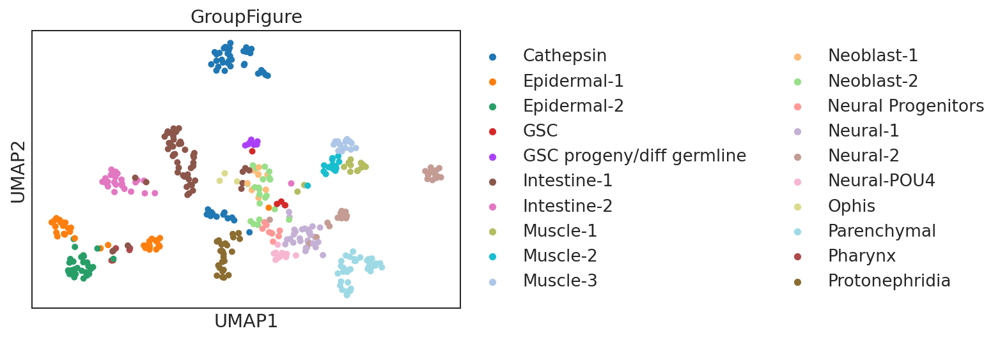

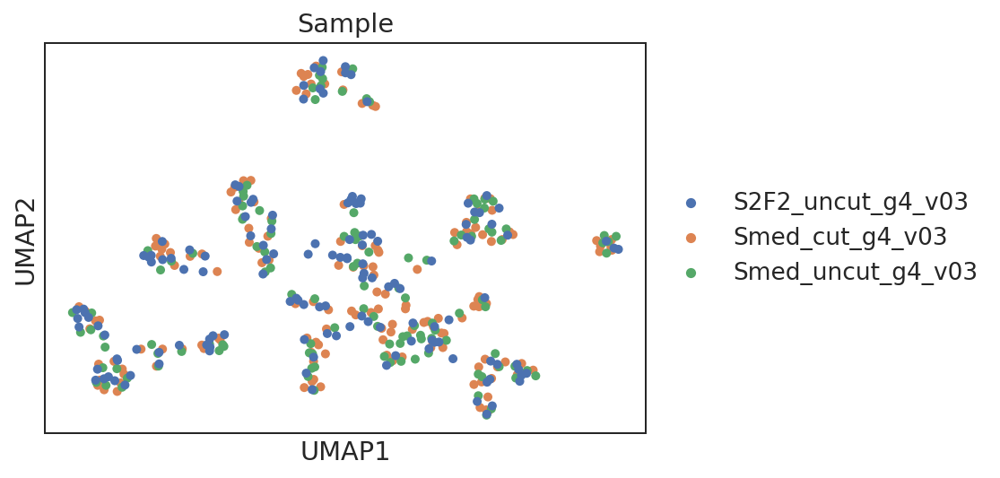

In [110]:
sc.pl.umap(scATAC, color='GroupFigure', s=100)
sc.pl.umap(scATAC, color='Sample', s=100)

In [ ]:
model = SEACells.core.SEACells(scATAC, 
                               build_kernel_on='X_svd', 
                               n_SEACells=scATAC.shape[0]//4, 
                               n_waypoint_eigs=10,
                               convergence_epsilon = 1e-6)

model.construct_kernel_matrix()
sns.clustermap(model.kernel_matrix.toarray()[:500,:500])
plt.show()

Welcome to SEACells!
Computing kNN graph using scanpy NN ...
Computing radius for adaptive bandwidth kernel...


/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/scipy/sparse/_index.py:146: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


  0%|          | 0/415 [00:00<?, ?it/s]

Making graph symmetric...
Parameter graph_construction = union being used to build KNN graph...
Computing RBF kernel...


sys:1: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f50d7326ee0>


  0%|          | 0/415 [00:00<?, ?it/s]

Building similarity LIL matrix...


sys:1: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f50d7326a60>


  0%|          | 0/415 [00:00<?, ?it/s]

Constructing CSR matrix...


/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/palantir/utils.py:54: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  temp = sc.AnnData(data_df.values)


Building kernel on X_svd
Computing diffusion components from X_svd for waypoint initialization ... 
Determing nearest neighbor graph...
Done.
Sampling waypoints ...
Done.
Selecting 72 cells from waypoint initialization.
Initializing residual matrix using greedy column selection
Initializing f and g...


100%|██████████████████████████████████████████████████████████████████████| 21/21 [00:00<00:00, 1356.69it/s]

Selecting 11 cells from greedy initialization.


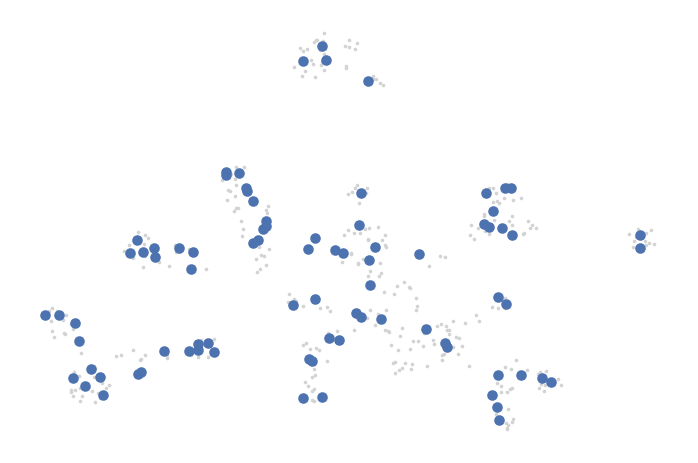

In [112]:
model.initialize_archetypes()
SEACells.plot.plot_initialization(scATAC, model)

Randomly initialized A matrix.
Setting convergence threshold at 0.00002
Starting iteration 1.
Completed iteration 1.
Starting iteration 10.
Completed iteration 10.
Starting iteration 20.
Completed iteration 20.
Starting iteration 30.
Completed iteration 30.
Starting iteration 40.
Completed iteration 40.
Starting iteration 50.
Completed iteration 50.
Starting iteration 60.
Completed iteration 60.
Starting iteration 70.
Completed iteration 70.
Starting iteration 80.
Completed iteration 80.
Converged after 88 iterations.


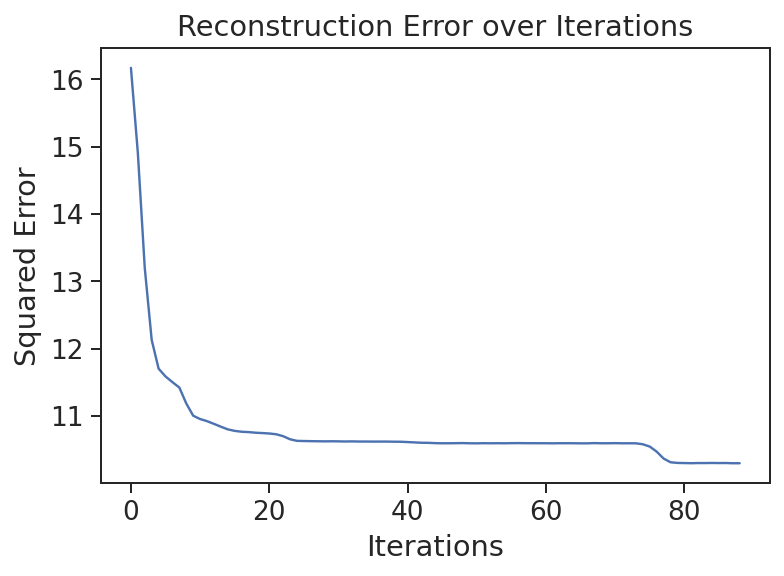

In [152]:
model.fit(min_iter=10, max_iter=150)
model.plot_convergence()

In [153]:
scATAC.layers['raw'] = scATAC.X

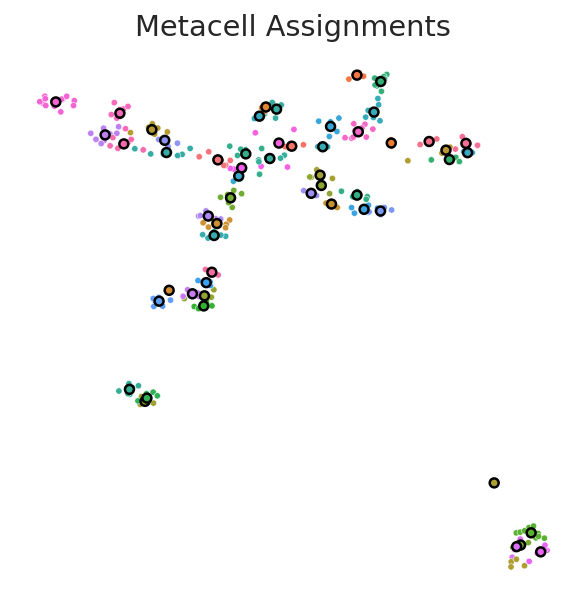

In [154]:
SEACells.plot.plot_2D(scATAC, key='X_umap', colour_metacells=True)

/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


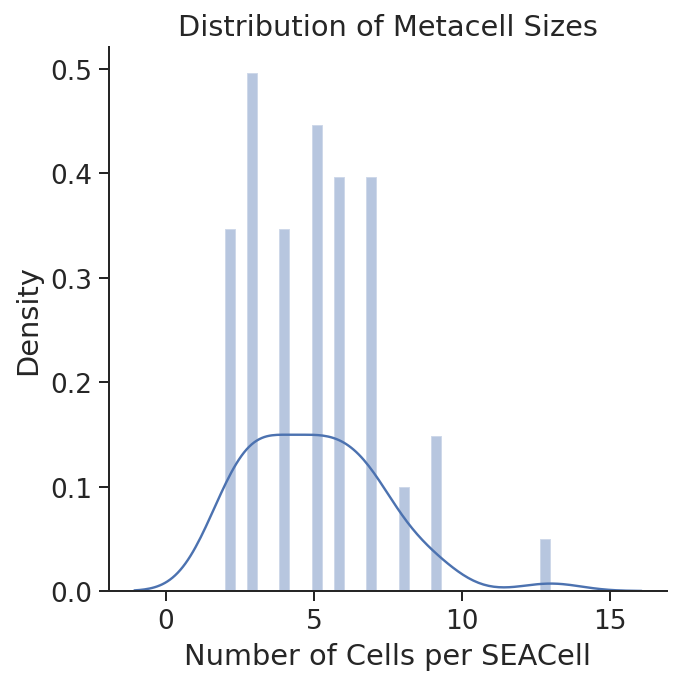

,size
SEACell,
SEACell-0,3
SEACell-1,7
SEACell-10,3
SEACell-11,5
SEACell-12,2
SEACell-13,4
SEACell-14,2
SEACell-15,7
SEACell-16,3


In [155]:
SEACells.plot.plot_SEACell_sizes(scATAC, bins=30)

In [ ]:
scATAC.obs.groupby('SEACell').apply( lambda x: x.groupby('GroupFigure').size().idxmax() ).value_counts()

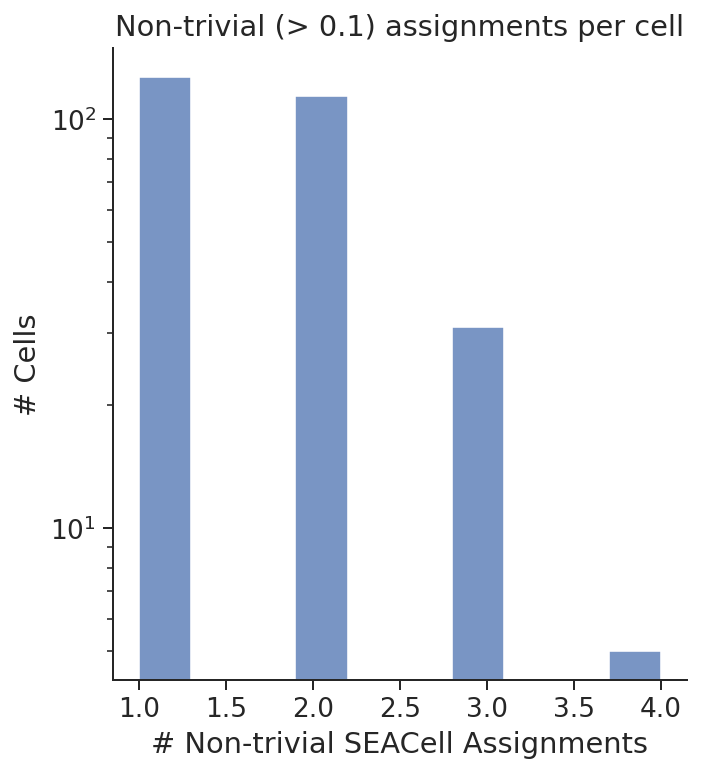

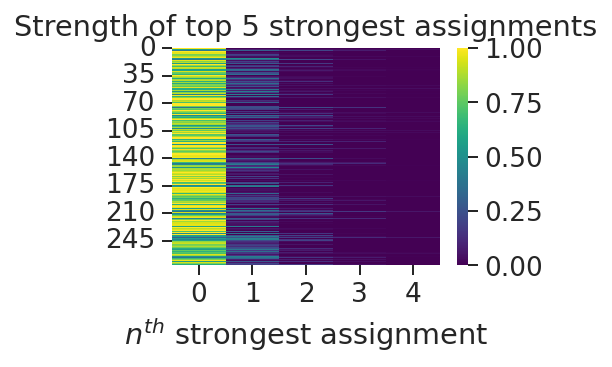

In [158]:
sns.displot((model.A_.T > 0.1).sum(axis=1), kde=False)
plt.title(f'Non-trivial (> 0.1) assignments per cell')
plt.xlabel('# Non-trivial SEACell Assignments')
plt.ylabel('# Cells')
plt.yscale('log')
plt.show()

plt.figure(figsize=(3,2))
b = np.partition(model.A_.T, -5)    
sns.heatmap(np.sort(b[:,-5:])[:, ::-1], cmap='viridis', vmin=0)
plt.title('Strength of top 5 strongest assignments')
plt.xlabel('$n^{th}$ strongest assignment')
plt.show()

In [159]:
scATAC.write_h5ad( 'SEACellsOutput/Smed.SEACells_ATAC.h5ad' )

In [160]:
scRNA.write_h5ad( 'SEACellsOutput/Smed.SEACells_RNA.h5ad' )

# *S. mansoni*

## Read in the data

In [ ]:
peaks = sc.read_h5ad( 'ArchROutputs/Sman/Sman.peaks.h5ad' )

peaks

In [ ]:
peakdf = pd.read_csv( 'ArchROutputs/Sman/Sman.peaks.h5ad', index_col=0 )

peakdf.index = peakdf['seqnames'] + ':' + peakdf['start'].astype(str) + '-' + peakdf['end'].astype(str)
peaks.var = peakdf

In [ ]:
del peakdf

gc.collect()

In [ ]:
peaks.X = peaks.X.tocsr()

In [ ]:
peaks.obsm['X_svd'] = pd.read_csv('scVI_models/Sman.pvi_latent_dims.csv', 
                                  index_col=0).loc[peaks.obs_names, : ].values

Process separately per condition

## Juvenile

In [15]:
juv = peaks[peaks.obs.Sample.str.contains('juvenile'),:].copy()

juv

AnnData object with n_obs × n_vars = 13838 × 162349
    obs: 'ClustersSAM', 'GroupSAMName', 'TissueSAM', 'Sample', '_scvi_batch', '_scvi_labels', 'cluster_pvi', 'GroupFigure'
    var: 'seqnames', 'start', 'end', 'width', 'strand', 'score', 'idx', 'GC', 'N'
    uns: 'X_name', 'GeneScoresColums'
    obsm: 'X_svd', 'GeneScores'

In [16]:
warnings.filterwarnings('ignore')
sc.pp.neighbors(juv, use_rep='X_svd')
sc.tl.umap(juv)
sc.tl.leiden(juv)
warnings.filterwarnings('default')

findfont: Font family ['Bitstream Vera Sans'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Bitstream Vera Sans'] not found. Falling back to DejaVu Sans.


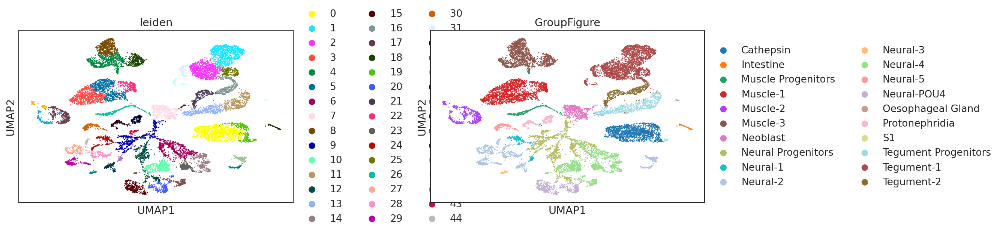

In [17]:
sc.pl.scatter(juv, basis='umap', color=['leiden', 'GroupFigure'])
plt.show()

In [20]:
nsc = len( juv.obs_names ) // 75 + 1
nsc

185

In [21]:
model = SEACells.core.SEACells( juv, build_kernel_on='X_svd', n_SEACells=nsc, 
                                n_waypoint_eigs=10, convergence_epsilon=1e-5 )

Welcome to SEACells!


In [22]:
model.construct_kernel_matrix()
M = model.kernel_matrix

Computing kNN graph using scanpy NN ...


/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/scipy/sparse/_index.py:125: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


Computing radius for adaptive bandwidth kernel...


  0%|          | 0/13838 [00:00<?, ?it/s]

Making graph symmetric...
Parameter graph_construction = union being used to build KNN graph...
Computing RBF kernel...


sys:1: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f5c96d256a0>


  0%|          | 0/13838 [00:00<?, ?it/s]

Building similarity LIL matrix...


sys:1: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f5c7f21b7c0>


  0%|          | 0/13838 [00:00<?, ?it/s]

Constructing CSR matrix...


/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


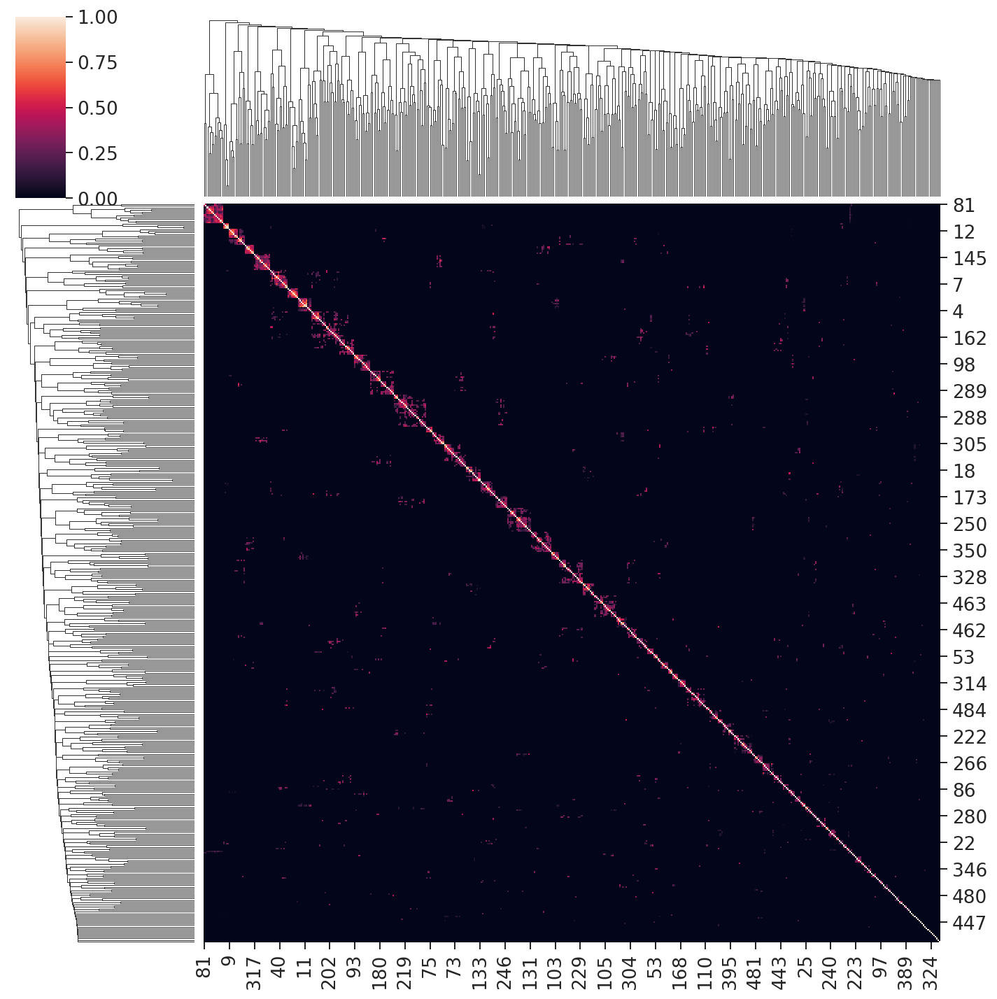

In [23]:
sns.clustermap(M.toarray()[:500,:500])
plt.show()

In [24]:
model.initialize_archetypes()

Building kernel on X_svd
Computing diffusion components from X_svd for waypoint initialization ... 
Determing nearest neighbor graph...


/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/palantir/utils.py:54: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  temp = sc.AnnData(data_df.values)


Done.
Sampling waypoints ...
Done.
Selecting 172 cells from waypoint initialization.
Initializing residual matrix using greedy column selection
Initializing f and g...


100%|████████████████████████████████████████████████████████████████| 23/23 [00:00<00:00, 60.19it/s]

Selecting 13 cells from greedy initialization.


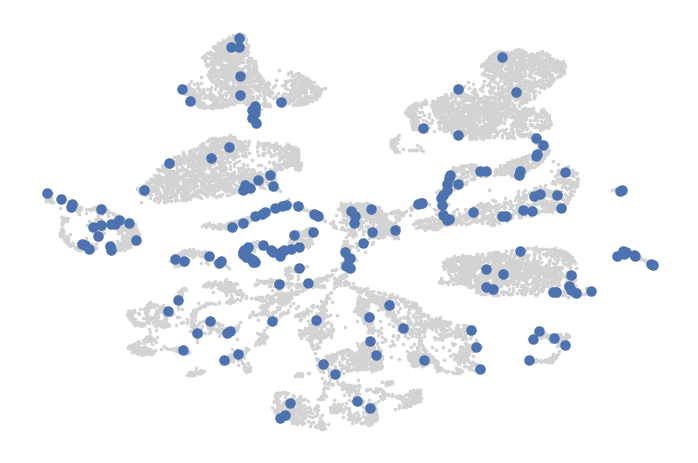

In [25]:
SEACells.plot.plot_initialization(juv, model)

In [26]:
model.fit(min_iter=10, max_iter=50)

Randomly initialized A matrix.
Setting convergence threshold at 0.00204
Starting iteration 1.
Completed iteration 1.
Starting iteration 10.
Completed iteration 10.
Starting iteration 20.
Completed iteration 20.
Starting iteration 30.
Completed iteration 30.
Converged after 36 iterations.


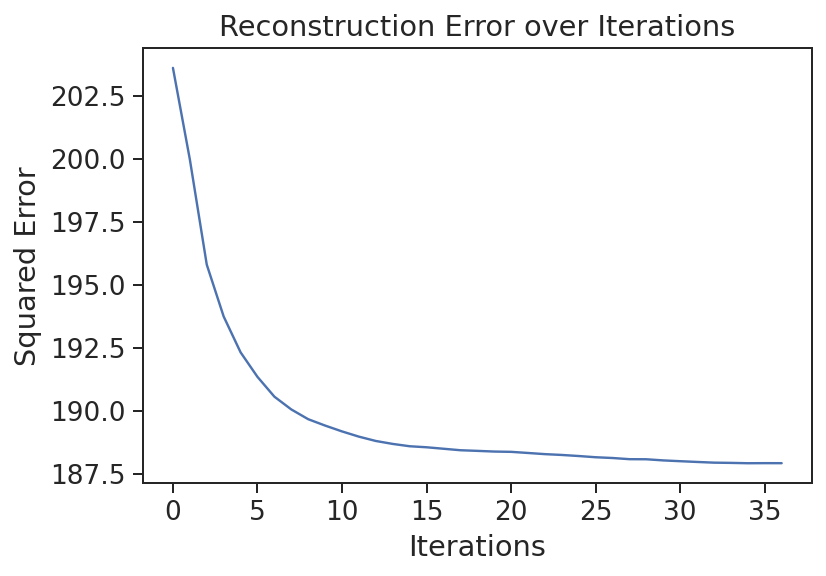

In [31]:
model.plot_convergence()

In [27]:
juv.layers['raw'] = juv.X

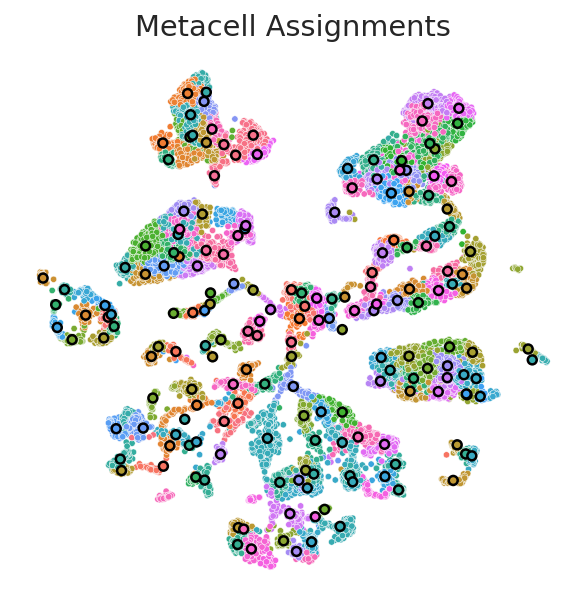

In [28]:
SEACells.plot.plot_2D(juv, key='X_umap', colour_metacells=True)

Notice we are missing oeso and Neural-3, let's just make two extra ones

In [38]:
np.max([ int(s.split('-')[1]) for s in juv.obs.SEACell ])

184

In [39]:
juv.obs.loc[juv.obs.GroupFigure=='Oesophageal Gland','SEACell'] = 'SEACell-185'
juv.obs.loc[juv.obs.GroupFigure=='Neural-3','SEACell'] = 'SEACell-186'

/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


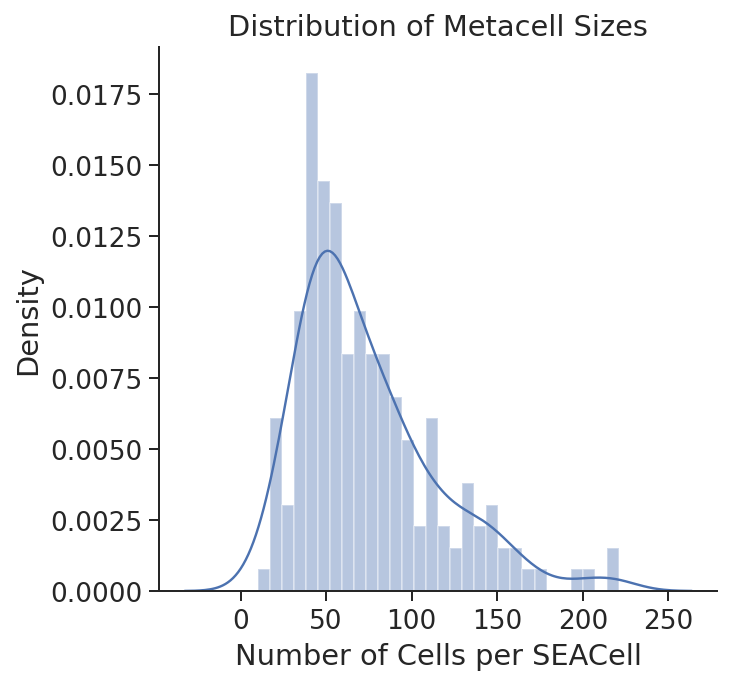

,size
SEACell,
SEACell-0,137
SEACell-1,60
SEACell-10,80
SEACell-100,42
SEACell-101,49
...,...
SEACell-95,96
SEACell-96,36
SEACell-97,36


In [40]:
SEACells.plot.plot_SEACell_sizes(juv, bins=30)

In [ ]:
juv.obs.groupby('SEACell').apply( lambda x: x.groupby('GroupFigure').size().idxmax() ).value_counts()

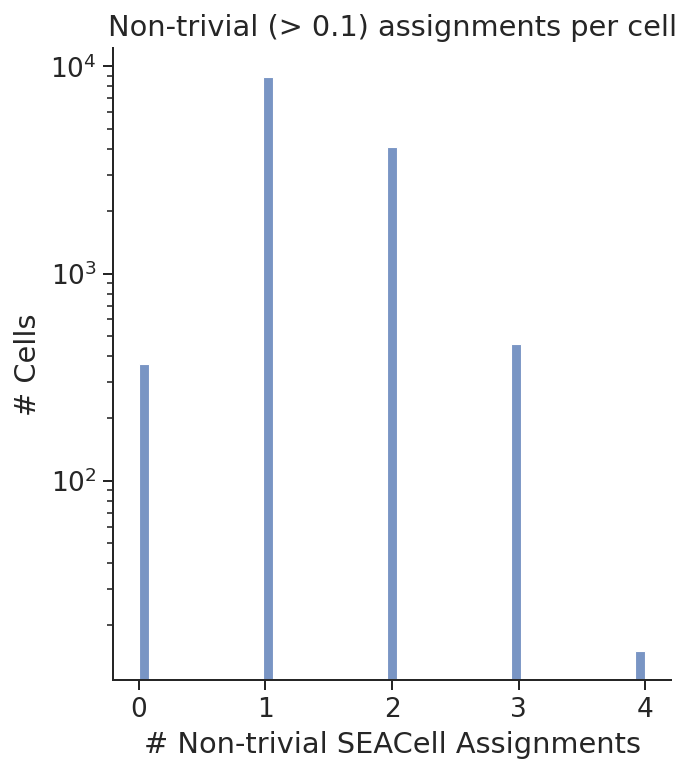

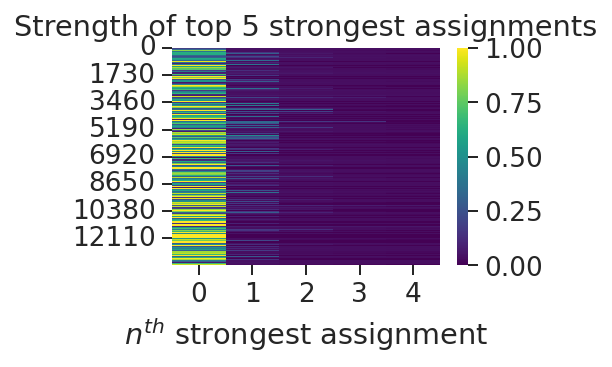

In [42]:
sns.displot((model.A_.T > 0.1).sum(axis=1), kde=False)
plt.title(f'Non-trivial (> 0.1) assignments per cell')
plt.xlabel('# Non-trivial SEACell Assignments')
plt.ylabel('# Cells')
plt.yscale('log')
plt.show()

plt.figure(figsize=(3,2))
b = np.partition(model.A_.T, -5)    
sns.heatmap(np.sort(b[:,-5:])[:, ::-1], cmap='viridis', vmin=0)
plt.title('Strength of top 5 strongest assignments')
plt.xlabel('$n^{th}$ strongest assignment')
plt.show()

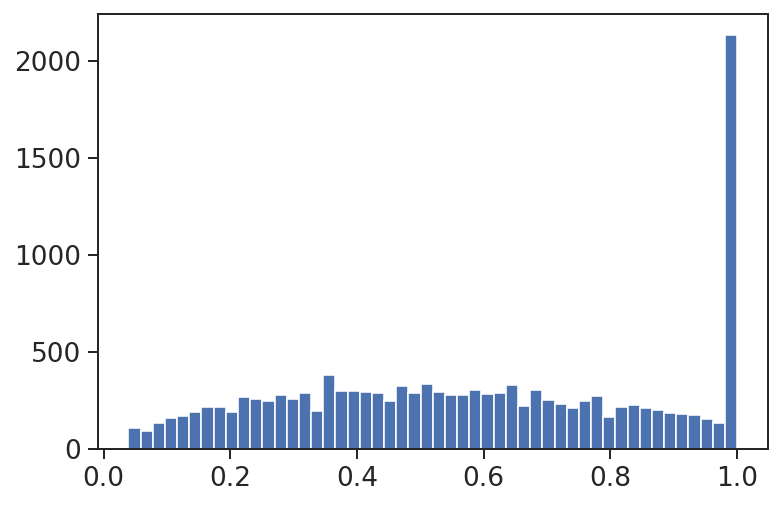

In [43]:
juv.obs['MaxSEACellScore'] = model.A_.max(0).flatten()
plt.hist( juv.obs['MaxSEACellScore'].values, bins=50 )
plt.show()

In [47]:
np.save( 'SEACellsOutput/Sman.juvenile_SEACell_assignments.npy', model.A_ )

In [48]:
juv.obs.loc[:,'SEACell'] = [ c.replace( '-', '-juvenile-' ) for c in juv.obs.SEACell ]

## Cut adults

In [49]:
ac = peaks[peaks.obs.Sample=='adult_cut',:].copy()

ac

AnnData object with n_obs × n_vars = 9351 × 162349
    obs: 'ClustersSAM', 'GroupSAMName', 'TissueSAM', 'Sample', '_scvi_batch', '_scvi_labels', 'cluster_pvi', 'GroupFigure'
    var: 'seqnames', 'start', 'end', 'width', 'strand', 'score', 'idx', 'GC', 'N'
    uns: 'X_name', 'GeneScoresColums'
    obsm: 'X_svd', 'GeneScores'

In [50]:
warnings.filterwarnings('ignore')
sc.pp.neighbors(ac, use_rep='X_svd')
sc.tl.umap(ac)
sc.tl.leiden(ac)
warnings.filterwarnings('default')

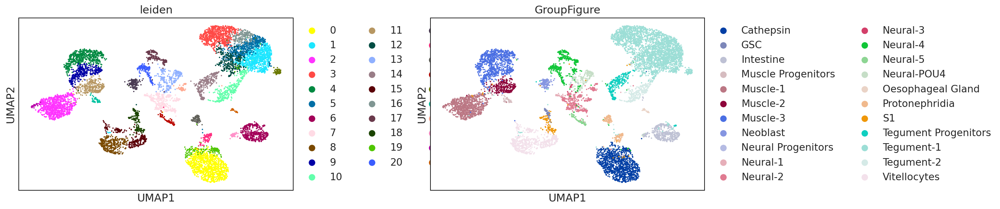

In [51]:
sc.pl.scatter(ac, basis='umap', color=['leiden', 'GroupFigure'])
plt.show()

In [54]:
nsc = len( ac.obs_names ) // 75 + 1
nsc

125

In [55]:
model = SEACells.core.SEACells( ac, build_kernel_on='X_svd', n_SEACells=nsc, 
                                n_waypoint_eigs=10, convergence_epsilon=1e-5 )

Welcome to SEACells!


In [56]:
model.construct_kernel_matrix()
M = model.kernel_matrix

Computing kNN graph using scanpy NN ...
Computing radius for adaptive bandwidth kernel...


/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/scipy/sparse/_index.py:125: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


  0%|          | 0/9351 [00:00<?, ?it/s]

Making graph symmetric...
Parameter graph_construction = union being used to build KNN graph...
Computing RBF kernel...


sys:1: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f5cb3b0f8e0>


  0%|          | 0/9351 [00:00<?, ?it/s]

Building similarity LIL matrix...


sys:1: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f5c7f38e640>


  0%|          | 0/9351 [00:00<?, ?it/s]

Constructing CSR matrix...


/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


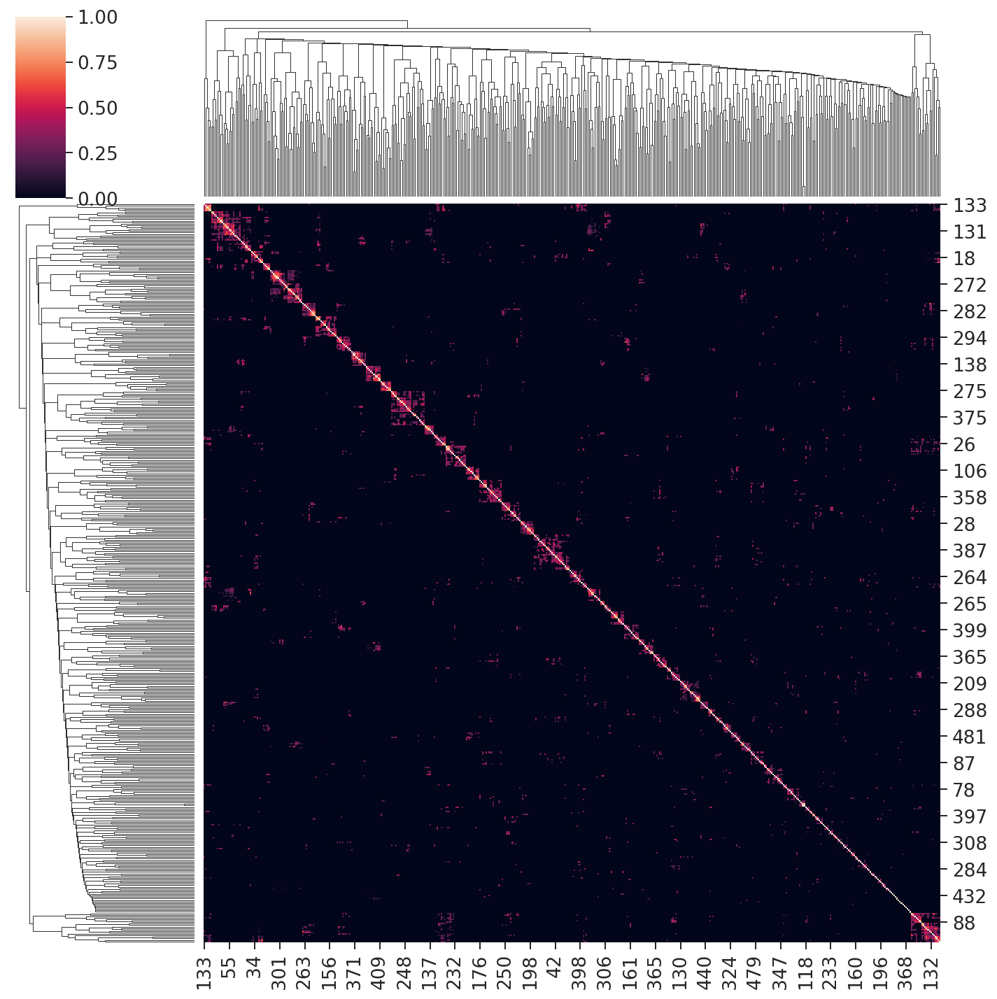

In [57]:
sns.clustermap(M.toarray()[:500,:500])
plt.show()

In [58]:
model.initialize_archetypes()

Building kernel on X_svd
Computing diffusion components from X_svd for waypoint initialization ... 
Determing nearest neighbor graph...


/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/palantir/utils.py:54: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  temp = sc.AnnData(data_df.values)


Done.
Sampling waypoints ...
Done.
Selecting 108 cells from waypoint initialization.
Initializing residual matrix using greedy column selection
Initializing f and g...


100%|███████████████████████████████████████████████████████████████| 27/27 [00:00<00:00, 183.67it/s]

Selecting 17 cells from greedy initialization.


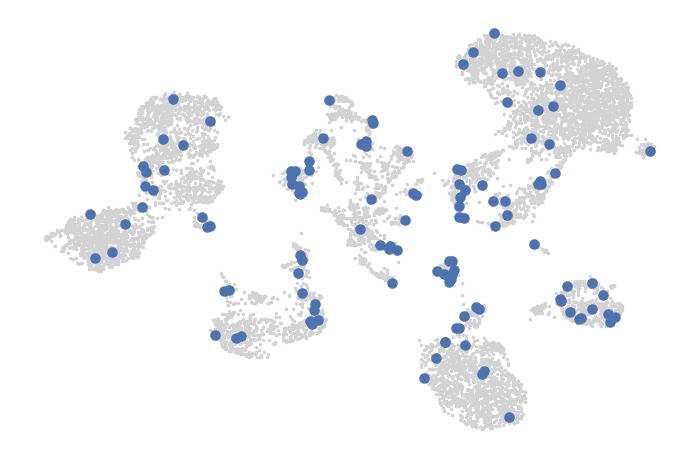

In [59]:
SEACells.plot.plot_initialization(ac, model)

In [60]:
model.fit(min_iter=10, max_iter=50)

Randomly initialized A matrix.
Setting convergence threshold at 0.00168
Starting iteration 1.
Completed iteration 1.
Starting iteration 10.
Completed iteration 10.
Starting iteration 20.
Completed iteration 20.
Starting iteration 30.
Completed iteration 30.
Converged after 34 iterations.


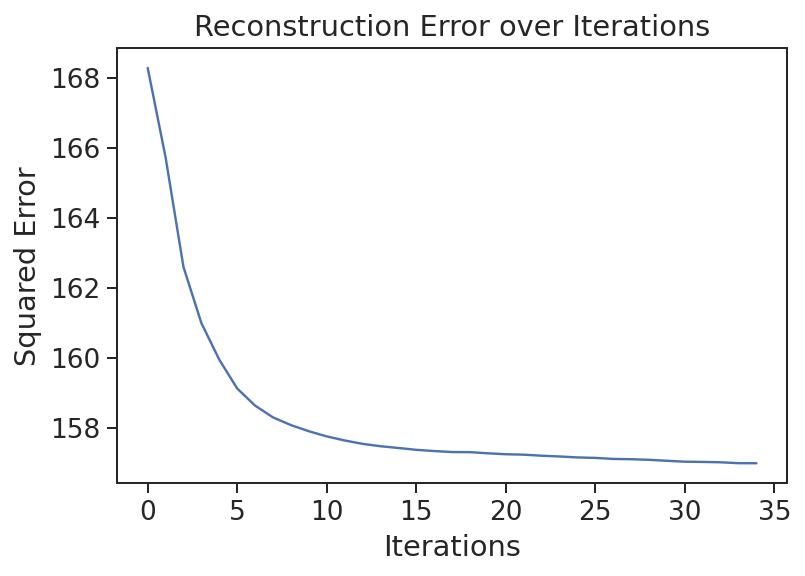

In [61]:
model.plot_convergence()

In [62]:
ac.layers['raw'] = ac.X

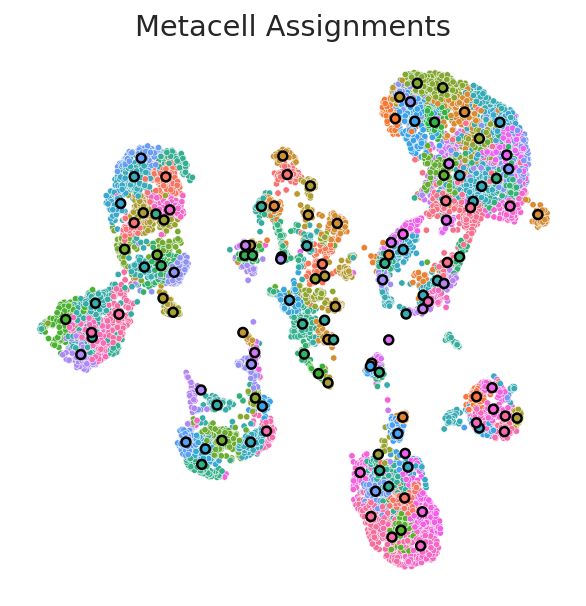

In [63]:
SEACells.plot.plot_2D(ac, key='X_umap', colour_metacells=True)

Notice we are missing oeso and Neural-3

In [65]:
np.max([ int(s.split('-')[1]) for s in ac.obs.SEACell ])

124

In [68]:
ac.obs.loc[ac.obs.GroupFigure=='Oesophageal Gland','SEACell'] = 'SEACell-125'
ac.obs.loc[ac.obs.GroupFigure=='Neural-3','SEACell'] = 'SEACell-126'

/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


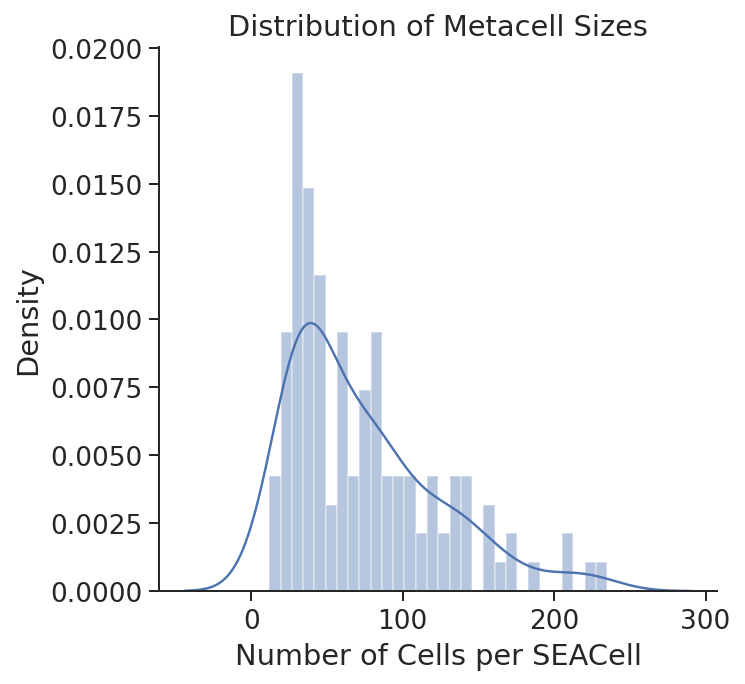

,size
SEACell,
SEACell-0,33
SEACell-1,80
SEACell-10,77
SEACell-100,74
SEACell-101,89
...,...
SEACell-95,139
SEACell-96,127
SEACell-97,122


In [69]:
SEACells.plot.plot_SEACell_sizes(ac, bins=30)

In [ ]:
ac.obs.groupby('SEACell').apply( lambda x: x.groupby('GroupFigure').size().idxmax() ).value_counts()

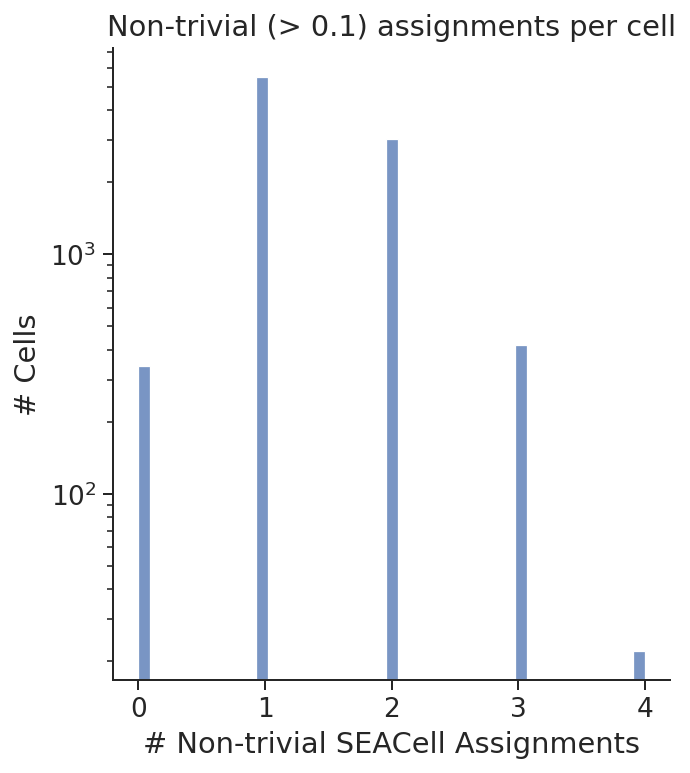

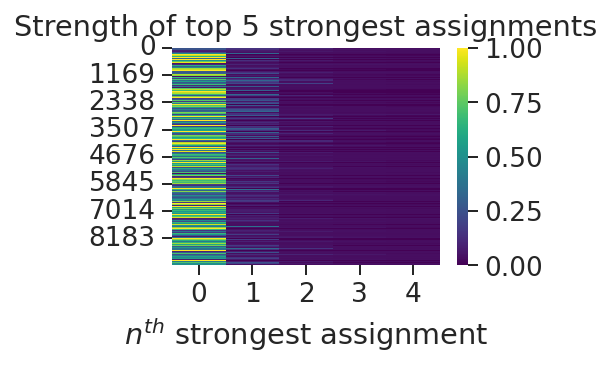

In [71]:
sns.displot((model.A_.T > 0.1).sum(axis=1), kde=False)
plt.title(f'Non-trivial (> 0.1) assignments per cell')
plt.xlabel('# Non-trivial SEACell Assignments')
plt.ylabel('# Cells')
plt.yscale('log')
plt.show()

plt.figure(figsize=(3,2))
b = np.partition(model.A_.T, -5)    
sns.heatmap(np.sort(b[:,-5:])[:, ::-1], cmap='viridis', vmin=0)
plt.title('Strength of top 5 strongest assignments')
plt.xlabel('$n^{th}$ strongest assignment')
plt.show()

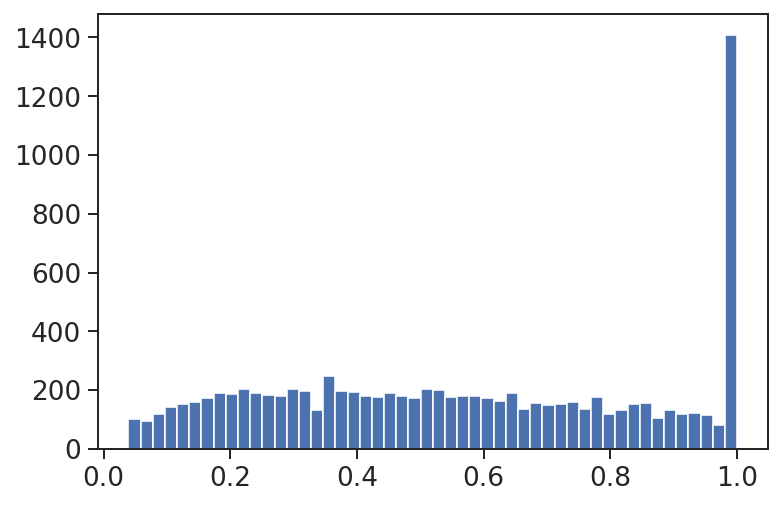

In [72]:
ac.obs['MaxSEACellScore'] = model.A_.max(0).flatten()
plt.hist( ac.obs['MaxSEACellScore'].values, bins=50 )
plt.show()

In [73]:
np.save( 'SEACellsOutput/Sman.adult_cut_SEACell_assignments.npy', model.A_ )

In [74]:
ac.obs.loc[:,'SEACell'] = [ c.replace( '-', '-adult_cut-' ) for c in ac.obs.SEACell ]

## Uncut adults

In [75]:
au = peaks[peaks.obs.Sample=='adult_uncut',:].copy()

au

AnnData object with n_obs × n_vars = 8974 × 162349
    obs: 'ClustersSAM', 'GroupSAMName', 'TissueSAM', 'Sample', '_scvi_batch', '_scvi_labels', 'cluster_pvi', 'GroupFigure'
    var: 'seqnames', 'start', 'end', 'width', 'strand', 'score', 'idx', 'GC', 'N'
    uns: 'X_name', 'GeneScoresColums'
    obsm: 'X_svd', 'GeneScores'

In [76]:
warnings.filterwarnings('ignore')
sc.pp.neighbors(au, use_rep='X_svd')
sc.tl.umap(au)
sc.tl.leiden(au)
warnings.filterwarnings('default')

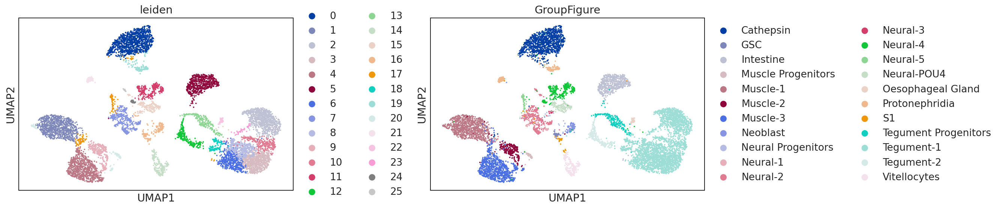

In [77]:
sc.pl.scatter(au, basis='umap', color=['leiden', 'GroupFigure'])
plt.show()

In [80]:
nsc = len( au.obs_names ) // 75 + 1
nsc

120

In [81]:
model = SEACells.core.SEACells( au, build_kernel_on='X_svd', n_SEACells=nsc, 
                                n_waypoint_eigs=10, convergence_epsilon=1e-5 )

Welcome to SEACells!


In [82]:
model.construct_kernel_matrix()
M = model.kernel_matrix

Computing kNN graph using scanpy NN ...
Computing radius for adaptive bandwidth kernel...


/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/scipy/sparse/_index.py:125: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


  0%|          | 0/8974 [00:00<?, ?it/s]

Making graph symmetric...
Parameter graph_construction = union being used to build KNN graph...
Computing RBF kernel...


sys:1: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f5c7f201340>


  0%|          | 0/8974 [00:00<?, ?it/s]

Building similarity LIL matrix...


sys:1: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f5c7f7409a0>


  0%|          | 0/8974 [00:00<?, ?it/s]

Constructing CSR matrix...


/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


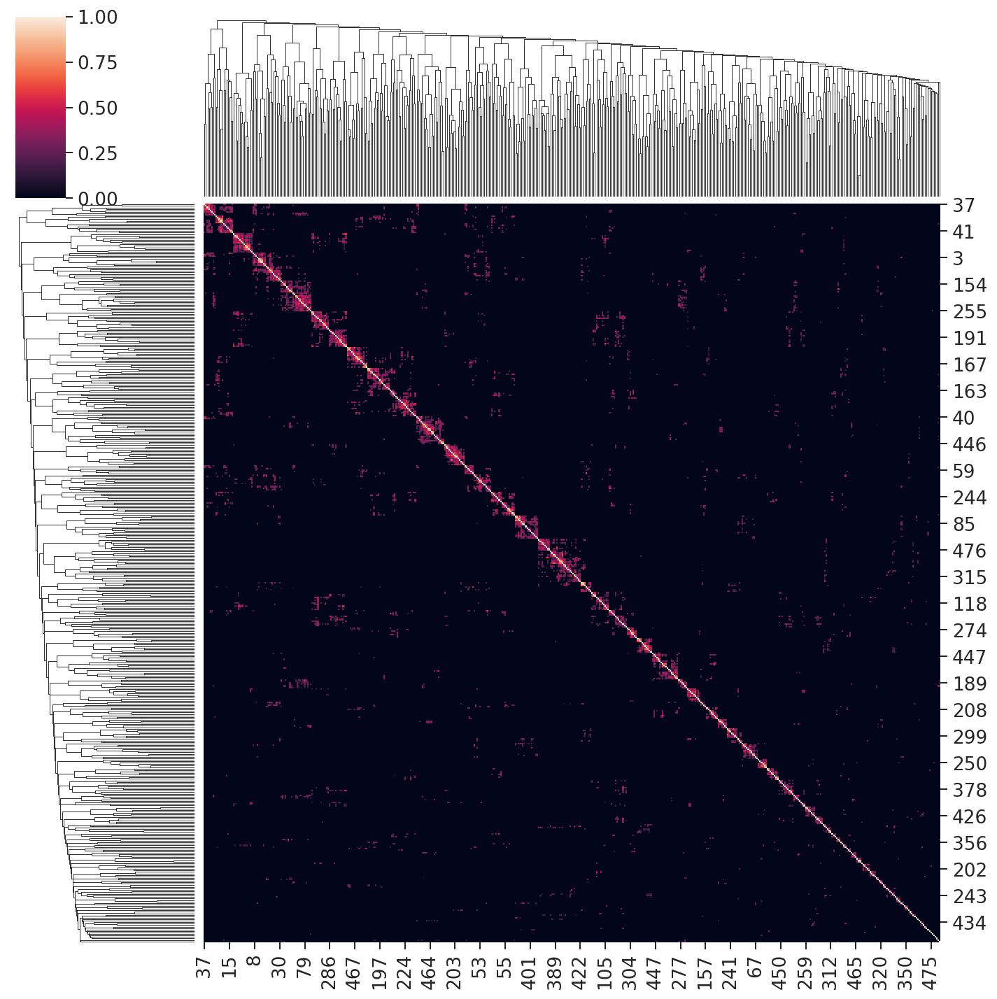

In [83]:
sns.clustermap(M.toarray()[:500,:500])
plt.show()

In [84]:
model.initialize_archetypes()

Building kernel on X_svd
Computing diffusion components from X_svd for waypoint initialization ... 
Determing nearest neighbor graph...


/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/palantir/utils.py:54: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  temp = sc.AnnData(data_df.values)


Done.
Sampling waypoints ...
Done.
Selecting 109 cells from waypoint initialization.
Initializing residual matrix using greedy column selection
Initializing f and g...


100%|███████████████████████████████████████████████████████████████| 21/21 [00:00<00:00, 204.21it/s]

Selecting 11 cells from greedy initialization.


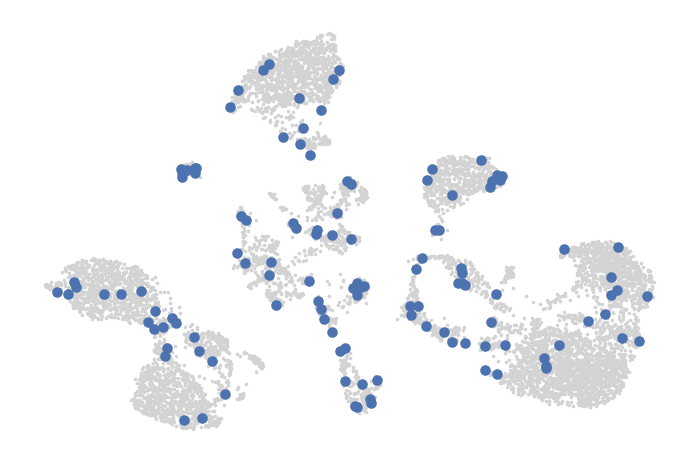

In [86]:
SEACells.plot.plot_initialization(au, model)

In [87]:
model.fit(min_iter=10, max_iter=50)

Randomly initialized A matrix.
Setting convergence threshold at 0.00166
Starting iteration 1.
Completed iteration 1.
Starting iteration 10.
Completed iteration 10.
Starting iteration 20.
Completed iteration 20.
Starting iteration 30.
Completed iteration 30.
Starting iteration 40.
Completed iteration 40.
Converged after 44 iterations.


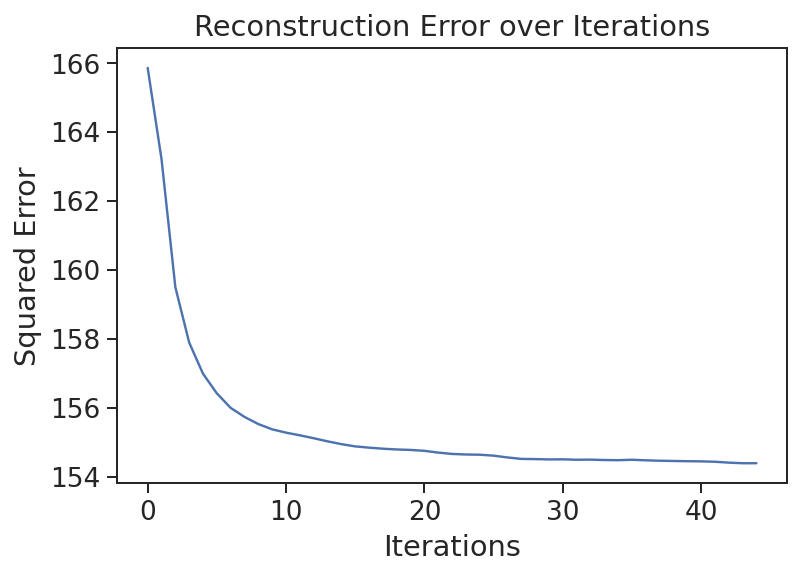

In [88]:
model.plot_convergence()

In [89]:
au.layers['raw'] = au.X

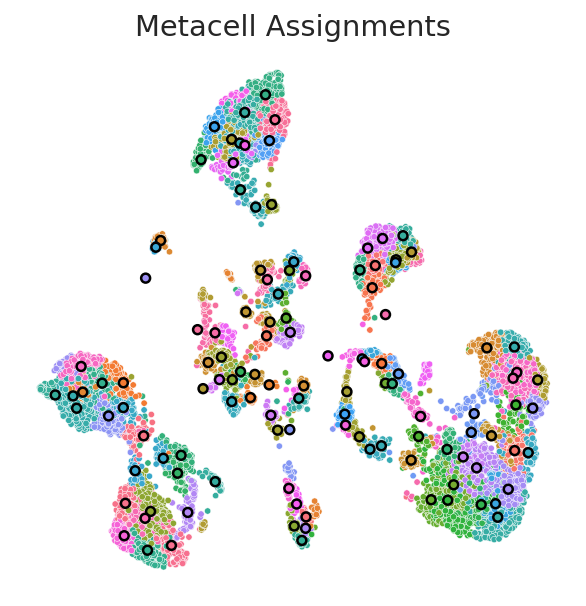

In [90]:
SEACells.plot.plot_2D(au, key='X_umap', colour_metacells=True)

Notice we are missing oeso and Neural-3

In [98]:
np.max([ int(s.split('-')[1]) for s in au.obs.SEACell ])

119

In [99]:
au.obs.loc[au.obs.GroupFigure=='Oesophageal Gland','SEACell'] = 'SEACell-120'
au.obs.loc[au.obs.GroupFigure=='Neural-3','SEACell'] = 'SEACell-121'

/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


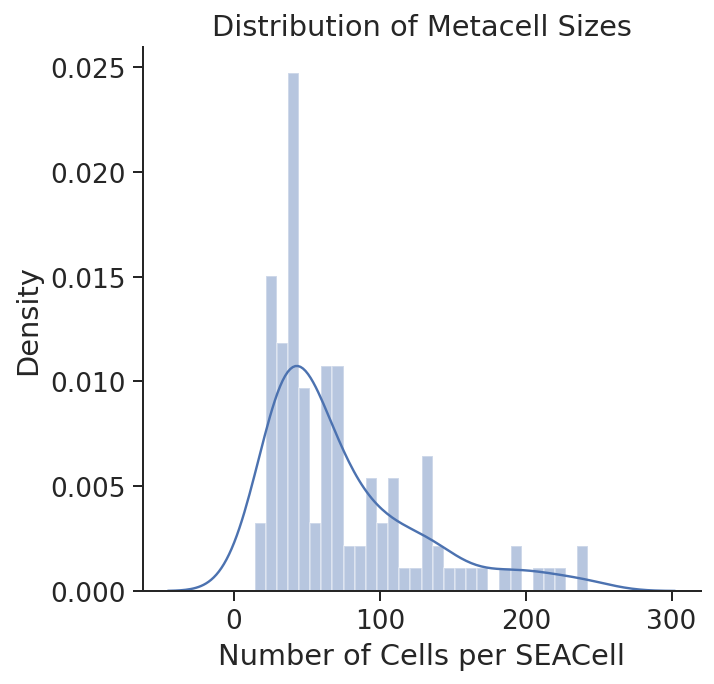

,size
SEACell,
SEACell-0,96
SEACell-1,73
SEACell-10,24
SEACell-100,74
SEACell-101,130
...,...
SEACell-95,44
SEACell-96,62
SEACell-97,28


In [100]:
SEACells.plot.plot_SEACell_sizes(au, bins=30)

In [ ]:
au.obs.groupby('SEACell').apply( lambda x: x.groupby('GroupFigure').size().idxmax() ).value_counts()

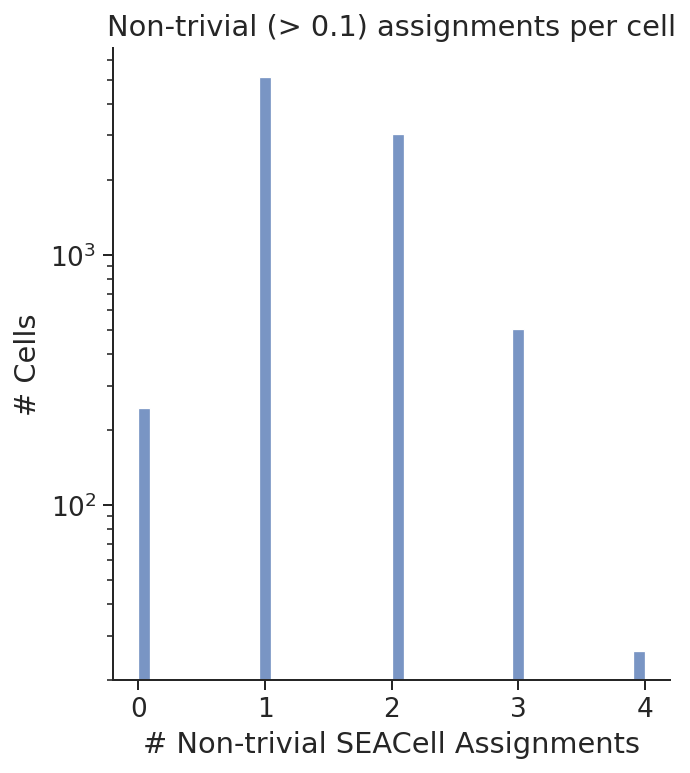

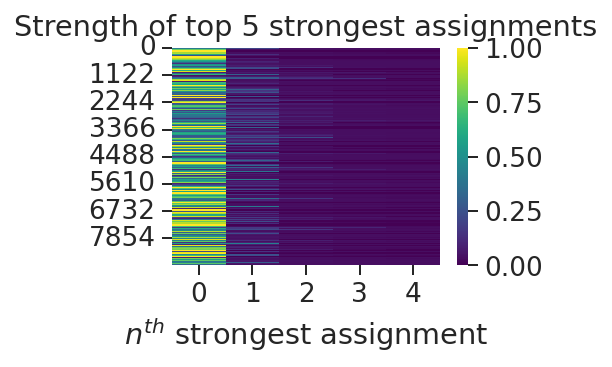

In [102]:
sns.displot((model.A_.T > 0.1).sum(axis=1), kde=False)
plt.title(f'Non-trivial (> 0.1) assignments per cell')
plt.xlabel('# Non-trivial SEACell Assignments')
plt.ylabel('# Cells')
plt.yscale('log')
plt.show()

plt.figure(figsize=(3,2))
b = np.partition(model.A_.T, -5)    
sns.heatmap(np.sort(b[:,-5:])[:, ::-1], cmap='viridis', vmin=0)
plt.title('Strength of top 5 strongest assignments')
plt.xlabel('$n^{th}$ strongest assignment')
plt.show()

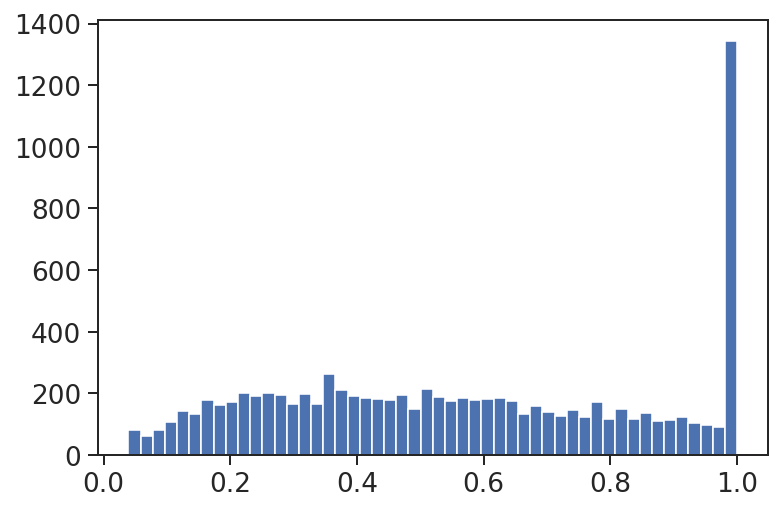

In [103]:
au.obs['MaxSEACellScore'] = model.A_.max(0).flatten()
plt.hist( au.obs['MaxSEACellScore'].values, bins=50 )
plt.show()

In [104]:
np.save( 'SEACellsOutput/Sman.adult_uncut_SEACell_assignments.npy', model.A_ )

In [ ]:
au.obs.loc[:,'SEACell'] = [ c.replace( '-', '-adult_uncut-' ) for c in au.obs.SEACell ]

## Merging samples

In [ ]:
update = pd.concat( (ac.obs,au.obs,juv.obs), axis=0 )
peaks.obs['SEACell'] = update.loc[peaks.obs_names,'SEACell']
peaks.obs['MaxSEACellScore'] = update.loc[peaks.obs_names,'MaxSEACellScore']
del update
gc.collect()

peaks.obs

In [107]:
peaks.obs.loc[:,['SEACell','MaxSEACellScore']].to_csv( 'SEACellsOutput/Sman.all_SEACell_assignments.csv' )

In [17]:
peaks = peaks[peaks.obs.MaxSEACellScore>0.1,:].copy()
peaks

AnnData object with n_obs × n_vars = 31211 × 162349
    obs: 'ClustersSAM', 'GroupSAMName', 'TissueSAM', 'Sample', '_scvi_batch', '_scvi_labels', 'cluster_pvi', 'GroupFigure', 'SEACell', 'MaxSEACellScore'
    var: 'seqnames', 'start', 'end', 'width', 'strand', 'score', 'idx', 'GC', 'N'
    uns: 'X_name', 'GeneScoresColums'
    obsm: 'X_svd', 'GeneScores'

In [18]:
# TODO: get a cleaner picture of where this RNA data should be coming from
# rna = sc.read_h5ad( 'schisto_export/Sman.all_RNA_20230320.h5ad' )
# rna.layers['raw'] = rna.X
# rna = rna[peaks.obs_names,:].copy()
# rna.obs = peaks.obs

rna

AnnData object with n_obs × n_vars = 31211 × 10150
    obs: 'ClustersSAM', 'GroupSAMName', 'TissueSAM', 'Sample', '_scvi_batch', '_scvi_labels', 'cluster_pvi', 'GroupFigure', 'SEACell', 'MaxSEACellScore'
    uns: 'X_name'
    layers: 'raw'

In [20]:
scATAC, scRNA = SEACells.genescores.prepare_multiome_anndata( peaks, rna )

scATAC

Generating Metacell matrices...
 ATAC


100%|█████████████████████████████████████████████████████████████| 436/436 [00:01<00:00, 223.65it/s]
/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/SEACells/genescores.py:48: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  atac_meta_ad.obsm['X_svd'] = summ_svd.loc[atac_meta_ad.obs_names, :].values
/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/SEACells/genescores.py:77: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  atac_ad.var['log_n_counts'] = np.ravel(np.log10(atac_ad.X.sum(axis=0)))


 RNA


/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/SEACells/genescores.py:58: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  rna_mod_ad.obs['temp'] = atac_mod_ad.obs[SEACells_label]
100%|██████████████████████████████████████████████████████████████| 436/436 [01:57<00:00,  3.71it/s]
/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/SEACells/genescores.py:69: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  meta_ad.raw = meta_ad.copy()


AnnData object with n_obs × n_vars = 435 × 162349
    obs: 'n_counts'
    var: 'GC_bin', 'counts_bin', 'n_cells'
    uns: 'log1p'
    obsm: 'X_svd'
    layers: 'raw'

In [139]:
del rna
gc.collect()

12947

In [24]:
scRNA

AnnData object with n_obs × n_vars = 435 × 10150
    obs: 'n_counts'
    uns: 'log1p'
    layers: 'raw'

In [ ]:
sclabels = scATAC.obs_names
tmpobs = peaks.obs.groupby('SEACell')\
                .apply( lambda x: x.groupby('GroupFigure').size().idxmax() )\
                .to_frame().loc[sclabels,:]
tmpobs.columns = ['GroupFigure']
tmpobs['Sample'] = peaks.obs.groupby('SEACell')\
                          .apply( lambda x: x.groupby('Sample').size().idxmax() )\
                          .to_frame().loc[sclabels,:]
tmpobs.loc[tmpobs.Sample.str.contains('juvenile'),'Sample'] = 'juvenile'

tmpobs

In [27]:
scATAC.obs = scATAC.obs.merge( tmpobs, left_index=True, right_index=True )

In [28]:
scRNA.obs = scRNA.obs.merge( tmpobs, left_index=True, right_index=True )

In [29]:
scATAC

AnnData object with n_obs × n_vars = 435 × 162349
    obs: 'n_counts', 'GroupFigure', 'TissueSAM', 'Sample'
    var: 'GC_bin', 'counts_bin', 'n_cells'
    uns: 'log1p'
    obsm: 'X_svd'
    layers: 'raw'

In [30]:
scRNA

AnnData object with n_obs × n_vars = 435 × 10150
    obs: 'n_counts', 'GroupFigure', 'TissueSAM', 'Sample'
    uns: 'log1p'
    layers: 'raw'

In [31]:
SEACells.accessibility.determine_metacell_open_peaks( scATAC )

100%|██████████████████████████████████████████████████████████████| 435/435 [00:22<00:00, 19.68it/s]


In [32]:
sc.pp.neighbors(scATAC, use_rep='X_svd')
sc.tl.umap(scATAC)

findfont: Font family ['Bitstream Vera Sans'] not found. Falling back to DejaVu Sans.


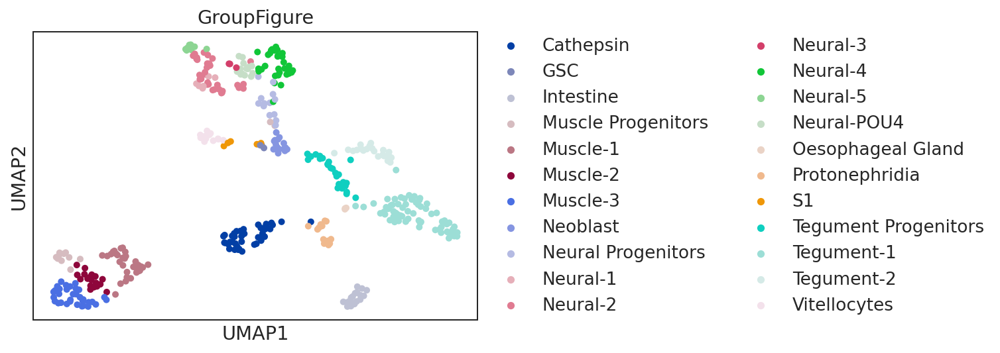

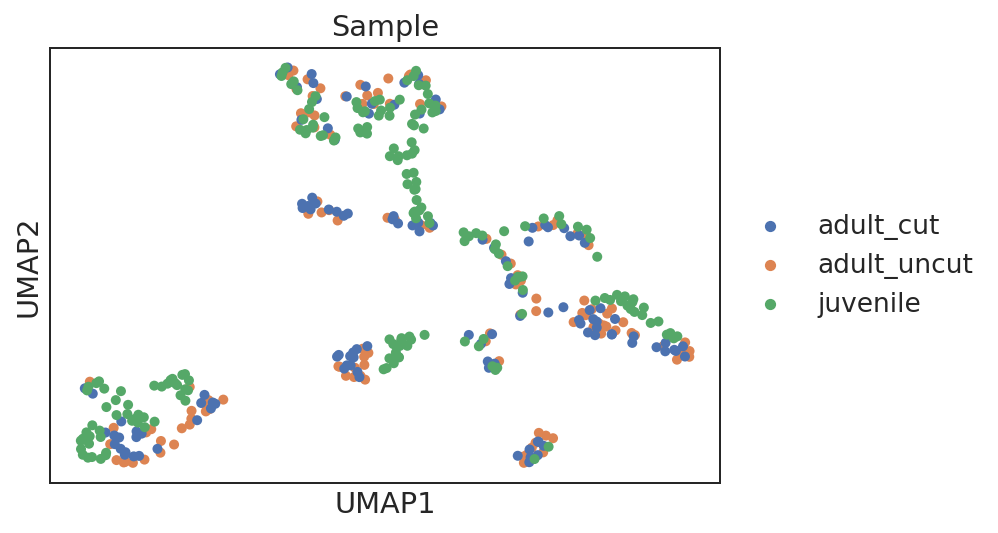

In [33]:
sc.pl.umap(scATAC, color='GroupFigure', s=100)
sc.pl.umap(scATAC, color='Sample', s=100)

Welcome to SEACells!
Computing kNN graph using scanpy NN ...
Computing radius for adaptive bandwidth kernel...


  0%|          | 0/435 [00:00<?, ?it/s]

Making graph symmetric...
Parameter graph_construction = union being used to build KNN graph...
Computing RBF kernel...


  0%|          | 0/435 [00:00<?, ?it/s]

Building similarity LIL matrix...


  0%|          | 0/435 [00:00<?, ?it/s]

Constructing CSR matrix...


/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


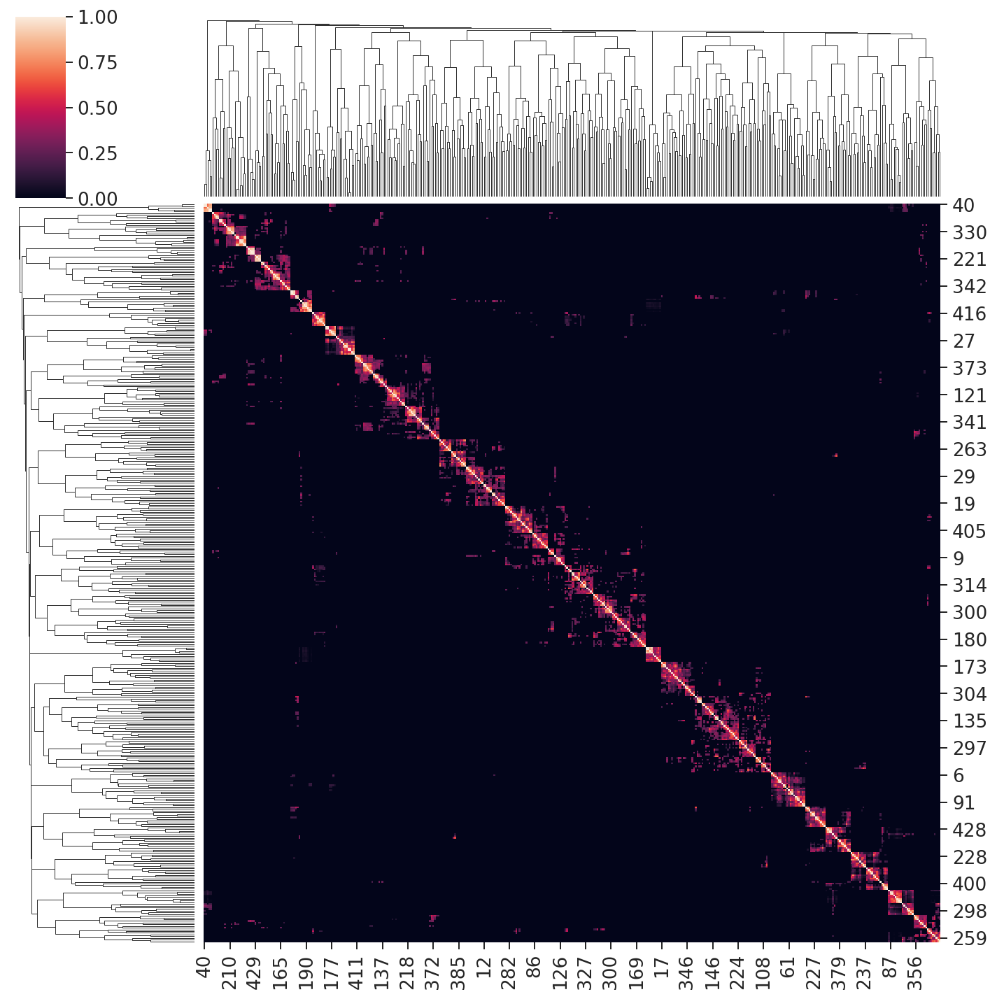

In [34]:
model = SEACells.core.SEACells(scATAC, 
                               build_kernel_on='X_svd', 
                               n_SEACells=scATAC.shape[0]//5, 
                               n_waypoint_eigs=10,
                               convergence_epsilon = 1e-6)

model.construct_kernel_matrix()
sns.clustermap(model.kernel_matrix.toarray()[:500,:500])
plt.show()

/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/palantir/utils.py:54: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  temp = sc.AnnData(data_df.values)


Building kernel on X_svd
Computing diffusion components from X_svd for waypoint initialization ... 
Determing nearest neighbor graph...
Done.
Sampling waypoints ...
Done.
Selecting 67 cells from waypoint initialization.
Initializing residual matrix using greedy column selection
Initializing f and g...


100%|███████████████████████████████████████████████████████████████| 30/30 [00:00<00:00, 713.21it/s]

Selecting 20 cells from greedy initialization.


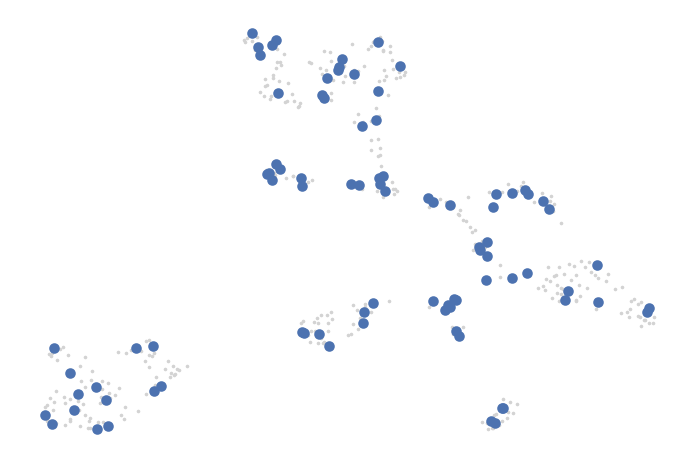

In [35]:
model.initialize_archetypes()
SEACells.plot.plot_initialization(scATAC, model)

Randomly initialized A matrix.
Setting convergence threshold at 0.00002
Starting iteration 1.
Completed iteration 1.
Starting iteration 10.
Completed iteration 10.
Starting iteration 20.
Completed iteration 20.
Starting iteration 30.
Completed iteration 30.
Converged after 36 iterations.


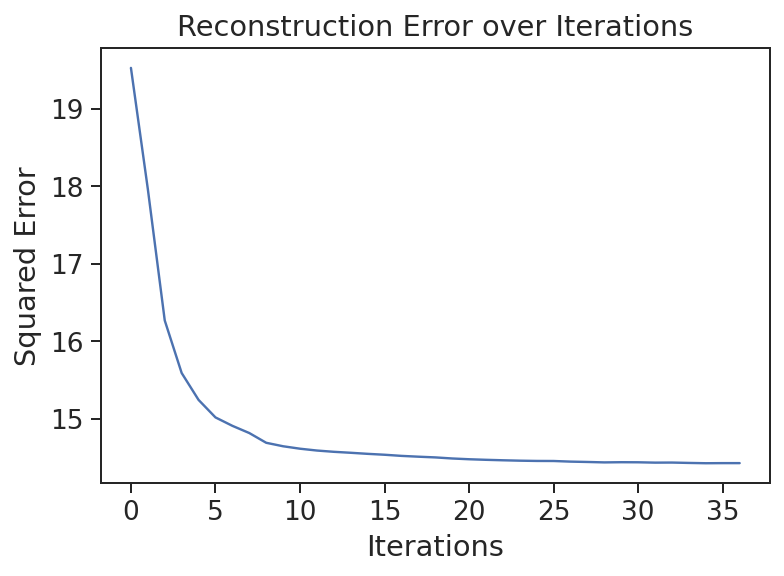

In [36]:
model.fit(min_iter=10, max_iter=150)
model.plot_convergence()

In [37]:
scATAC.layers['raw'] = scATAC.X

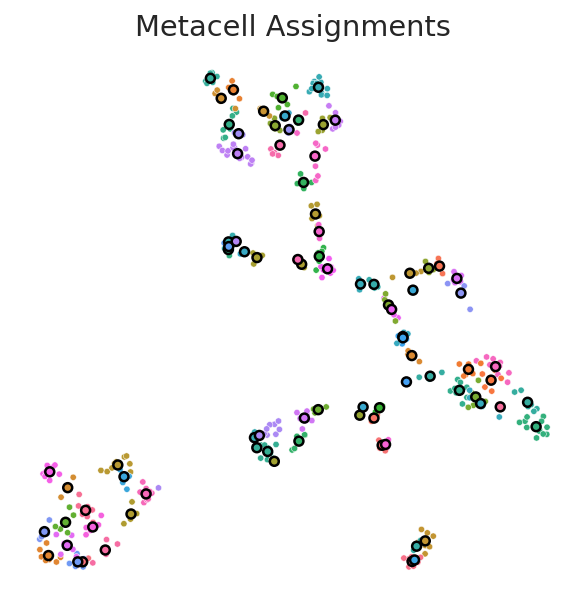

In [38]:
SEACells.plot.plot_2D(scATAC, key='X_umap', colour_metacells=True)

/home/gary/anaconda2/envs/seacells/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


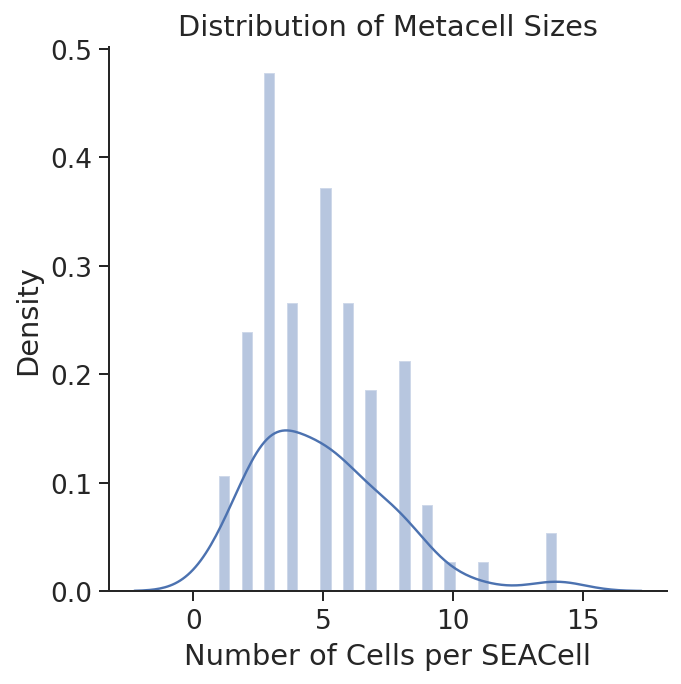

,size
SEACell,
SEACell-0,8
SEACell-1,2
SEACell-10,5
SEACell-11,3
SEACell-12,4
...,...
SEACell-83,2
SEACell-84,6
SEACell-85,5


In [39]:
SEACells.plot.plot_SEACell_sizes(scATAC, bins=30)

In [ ]:
scATAC.obs.groupby('SEACell').apply( lambda x: x.groupby('GroupFigure').size().idxmax() ).value_counts()

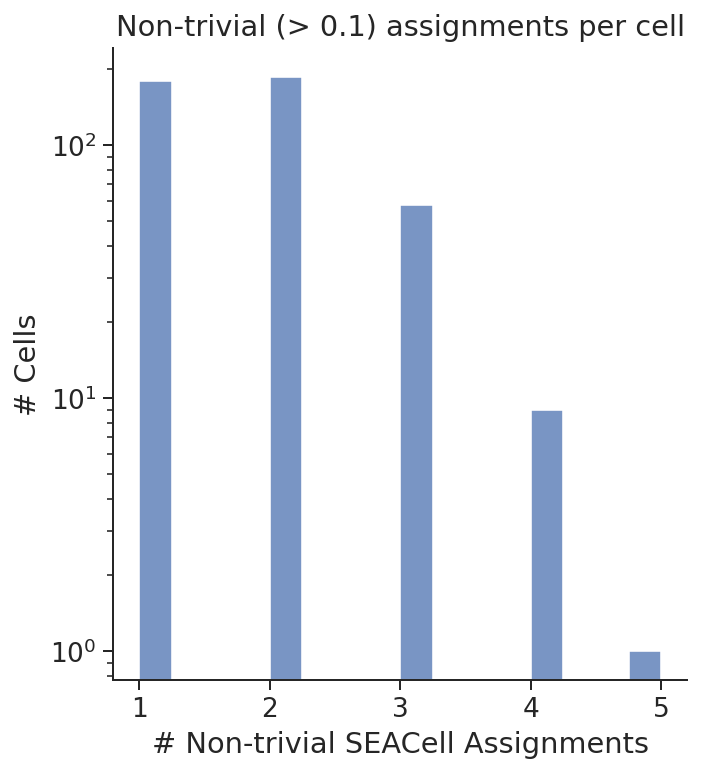

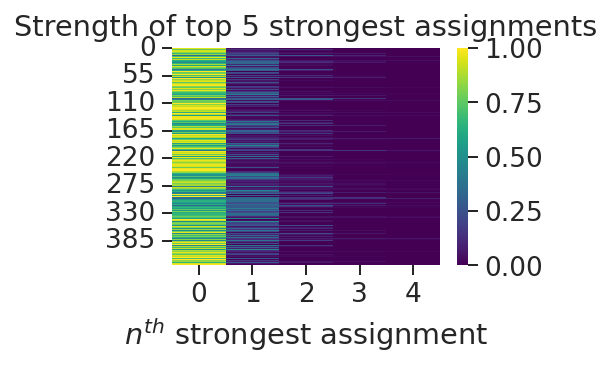

In [42]:
sns.displot((model.A_.T > 0.1).sum(axis=1), kde=False)
plt.title(f'Non-trivial (> 0.1) assignments per cell')
plt.xlabel('# Non-trivial SEACell Assignments')
plt.ylabel('# Cells')
plt.yscale('log')
plt.show()

plt.figure(figsize=(3,2))
b = np.partition(model.A_.T, -5)    
sns.heatmap(np.sort(b[:,-5:])[:, ::-1], cmap='viridis', vmin=0)
plt.title('Strength of top 5 strongest assignments')
plt.xlabel('$n^{th}$ strongest assignment')
plt.show()

In [159]:
scATAC.write_h5ad( 'SEACellsOutput/Sman.SEACells_ATAC.h5ad' )

In [160]:
scRNA.write_h5ad( 'SEACellsOutput/Sman.SEACells_RNA.h5ad' )